In [1]:
import json
import numpy as np
from matplotlib import pyplot as plt
from datetime import datetime
import re
import pandas as pd

In [2]:
with open("articles.json", "r") as f:
    articles = json.load(f)

In [3]:
articles

[{'article_url': 'https://www.heise.de/news/Telekom-und-Apple-starten-Augmented-Reality-Innovationsprogramm-6147126.html',
  'number_comments': 0,
  'date': '07-26-2021, 16:01',
  'brandig': ['Mac & i'],
  'related_topics': ['5G',
   'Apple',
   'Augmented Reality',
   'Deutsche Telekom',
   'Innovation',
   'iOS',
   'iPhone',
   'Mobilfunk',
   'Startups',
   'Wettbewerb'],
  'authors': ['Ben Schwan'],
  'heading': 'Telekom und Apple starten Augmented-Reality-Innovationsprogramm',
  'lead': 'Im Rahmen des Start-up-Inkubators "Hubraum" können sich Entwickler in sechs Kategorien bewerben, um Apples AR-Technik mit 5G und Co. zu kombinieren.',
  'atricle_text': 'Die Deutsche Telekom AG hat zusammen mit ihrer US-Tochter T-Mobile sowie Apple ein Innovationsprogramm für Augmented Reality (AR) aufgelegt. Die Kampagne läuft im Rahmen des Telekom-Inkubators Hubraum mit Sitz in Deutschland und ist international angelegt. Bewerbungen sind noch bis zum 4. August möglich, danach wird es für die in

# Clustering lead
## without label 

In [6]:
import pandas as pd
import numpy as np
from sklearn.cluster import MiniBatchKMeans
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import advertools as adv

In [5]:
lead_article = [article["lead"] for article in articles]

In [7]:
# removing stopwords
stopwords = adv.stopwords['german']
pattern = re.compile(r'\b(' + r'|'.join(stopwords) + r')\b\s*')
lead_list = []
for i, lead in enumerate(lead_article):
    lead = pattern.sub('', lead)
    lead = re.sub(r'[^\w]', ' ', lead)
    lead = re.sub(r'[0-9]+', '', lead)
    lead_list.append(lead)
 
lead_list  

['Im Rahmen Start up Inkubators  Hubraum  Entwickler Kategorien bewerben  Apples AR Technik G Co  kombinieren ',
 'Ein Fonds  Milliarden Euro Jahr ökologischen Umbau  Autozulieferer  unterstützen  Voraussetzung  soziales Wohlverhalten ',
 'Pünktlich Weltraumflug Jeff Bezos FAA Regeln Verleihung Astronautenabzeichen geändert  Der Milliardär bekommt  ',
 'Weniger Nutzer gedacht Reklameverfolgung App widersprochen  soziale Netzwerk Analysten  Facebook größeren Ärger ',
 'Das Rohstoffangebot knapp  Preise steigen  Auf Verbraucher Teuerungen unterschiedlichsten Produkten   Autoreifen Marmeladengläser ',
 'Bei TSMC prüft Errichtung Halbleiterfabrik Deutschland Japan  An Kosten Kunden Staaten beteiligen ',
 'Einen Monat Start Thüringer Reparaturbonus Land Leute  Elektrogeräte Schrottplatz gerettet ',
 'Und plötzlich Licht   Stromausfälle Berlin häufiger mal   Doch Blackouts  Köpenick Ausnahme ',
 'Wird Stromtanken einfach Tanken Benzin Diesel  Das zumindest Ziel  Beim Aufbau Ladenetzes E Auto

In [ ]:
# Stemming
import nltk
from nltk.stem.porter import PorterStemmer
lead_list_stemming =[]

porter_stemmer = PorterStemmer()
  
for i, lead in enumerate(lead_list):
    lead_nltk_tokens = nltk.word_tokenize(lead)
    lead_list_stemming.append(lead)
    for w in lead_nltk_tokens:
       print ("Actual: %s  Stem: %s"  % (w,porter_stemmer.stem(w)))

In [ ]:
nltk.download('wordnet')

In [8]:
# Lemmatisierung
import nltk
from nltk.stem import WordNetLemmatizer
wordnet_lemmatizer = WordNetLemmatizer()
       
lemma_list =[]     
lead_list_lemma = []
for i, lead in enumerate(lead_list):
    lead_nltk_tokens = nltk.word_tokenize(lead)
    for w in lead_nltk_tokens:
      print ("Actual: %s  Lemma: %s"  % (w,wordnet_lemmatizer.lemmatize(w)))
      lemma = wordnet_lemmatizer.lemmatize(w)
      lemma_list.append(lemma)
    lemmas = ' '.join(map(str,lemma_list))
    lead_list_lemma.append(lemmas)
    lemma_list = []

Actual: Im  Lemma: Im
Actual: Rahmen  Lemma: Rahmen
Actual: Start  Lemma: Start
Actual: up  Lemma: up
Actual: Inkubators  Lemma: Inkubators
Actual: Hubraum  Lemma: Hubraum
Actual: Entwickler  Lemma: Entwickler
Actual: Kategorien  Lemma: Kategorien
Actual: bewerben  Lemma: bewerben
Actual: Apples  Lemma: Apples
Actual: AR  Lemma: AR
Actual: Technik  Lemma: Technik
Actual: G  Lemma: G
Actual: Co  Lemma: Co
Actual: kombinieren  Lemma: kombinieren
Actual: Ein  Lemma: Ein
Actual: Fonds  Lemma: Fonds
Actual: Milliarden  Lemma: Milliarden
Actual: Euro  Lemma: Euro
Actual: Jahr  Lemma: Jahr
Actual: ökologischen  Lemma: ökologischen
Actual: Umbau  Lemma: Umbau
Actual: Autozulieferer  Lemma: Autozulieferer
Actual: unterstützen  Lemma: unterstützen
Actual: Voraussetzung  Lemma: Voraussetzung
Actual: soziales  Lemma: soziales
Actual: Wohlverhalten  Lemma: Wohlverhalten
Actual: Pünktlich  Lemma: Pünktlich
Actual: Weltraumflug  Lemma: Weltraumflug
Actual: Jeff  Lemma: Jeff
Actual: Bezos  Lemma: Bezo

Actual: Weltweit  Lemma: Weltweit
Actual: laut  Lemma: laut
Actual: Internationalen  Lemma: Internationalen
Actual: Energieagentur  Lemma: Energieagentur
Actual: Prozent  Lemma: Prozent
Actual: nationalen  Lemma: nationalen
Actual: Corona  Lemma: Corona
Actual: Konjunkturprogramme  Lemma: Konjunkturprogramme
Actual: Energiewende  Lemma: Energiewende
Actual: vorgesehen  Lemma: vorgesehen
Actual: Am  Lemma: Am
Actual: Mittwoch  Lemma: Mittwoch
Actual: Juli  Lemma: Juli
Actual: Interessierte  Lemma: Interessierte
Actual: iX  Lemma: iX
Actual: Redakteurin  Lemma: Redakteurin
Actual: Susanne  Lemma: Susanne
Actual: Nolte  Lemma: Nolte
Actual: Reddit  Lemma: Reddit
Actual: Thema  Lemma: Thema
Actual: Quantencomputer  Lemma: Quantencomputer
Actual: befragen  Lemma: befragen
Actual: Der  Lemma: Der
Actual: nächste  Lemma: nächste
Actual: Milliardär  Lemma: Milliardär
Actual: All  Lemma: All
Actual: Nach  Lemma: Nach
Actual: Richard  Lemma: Richard
Actual: Branson  Lemma: Branson
Actual: fliegt

Actual: Das  Lemma: Das
Actual: Thermofenster  Lemma: Thermofenster
Actual: Daimler  Lemma: Daimler
Actual: sittenwidrig  Lemma: sittenwidrig
Actual: Urteil  Lemma: Urteil
Actual: Für  Lemma: Für
Actual: Konzern  Lemma: Konzern
Actual: Angelegenheit  Lemma: Angelegenheit
Actual: Teil  Lemma: Teil
Actual: erledigt  Lemma: erledigt
Actual: Sicherheit  Lemma: Sicherheit
Actual: Straßen  Lemma: Straßen
Actual: geringerer  Lemma: geringerer
Actual: Spritverbrauch  Lemma: Spritverbrauch
Actual: Mit  Lemma: Mit
Actual: Punkten  Lemma: Punkten
Actual: argumentiert  Lemma: argumentiert
Actual: Bündnis  Lemma: Bündnis
Actual: Beschränkung  Lemma: Beschränkung
Actual: Geschwindigkeiten  Lemma: Geschwindigkeiten
Actual: Da  Lemma: Da
Actual: Google  Lemma: Google
Actual: mehreren  Lemma: mehreren
Actual: Aufforderungen  Lemma: Aufforderungen
Actual: nachgekommen  Lemma: nachgekommen
Actual: Presseverlagen  Lemma: Presseverlagen
Actual: faire  Lemma: faire
Actual: Verhandlungen  Lemma: Verhandlunge

Actual: Harnstofftanks  Lemma: Harnstofftanks
Actual: VW  Lemma: VW
Actual: Millionen  Lemma: Millionen
Actual: Euro  Lemma: Euro
Actual: zahlen  Lemma: zahlen
Actual: Atomkraftgegner  Lemma: Atomkraftgegner
Actual: empört  Lemma: empört
Actual: AKW  Lemma: AKW
Actual: Revision  Lemma: Revision
Actual: ans  Lemma: an
Actual: Netz  Lemma: Netz
Actual: zuständige  Lemma: zuständige
Actual: Umweltministerium  Lemma: Umweltministerium
Actual: versucht  Lemma: versucht
Actual: beruhigen  Lemma: beruhigen
Actual: Die  Lemma: Die
Actual: EU  Lemma: EU
Actual: Kommission  Lemma: Kommission
Actual: Anschuldigungen  Lemma: Anschuldigungen
Actual: BMW  Lemma: BMW
Actual: Kartelluntersuchung  Lemma: Kartelluntersuchung
Actual: Autohersteller  Lemma: Autohersteller
Actual: weitgehend  Lemma: weitgehend
Actual: fallen  Lemma: fallen
Actual: gelassen  Lemma: gelassen
Actual: BMW  Lemma: BMW
Actual: stimmt  Lemma: stimmt
Actual: Vergleich  Lemma: Vergleich
Actual: Das  Lemma: Das
Actual: vormals  Lemm

Actual: Mal  Lemma: Mal
Actual: Jahr  Lemma: Jahr
Actual: Bewerber  Lemma: Bewerber
Actual: Arbeitgeber  Lemma: Arbeitgeber
Actual: direkt  Lemma: direkt
Actual: IT  Lemma: IT
Actual: Jobtag  Lemma: Jobtag
Actual: treffen  Lemma: treffen
Actual: Freie  Lemma: Freie
Actual: Händler  Lemma: Händler
Actual: Apple  Lemma: Apple
Actual: Hardware  Lemma: Hardware
Actual: Amazons  Lemma: Amazons
Actual: Marktplatz  Lemma: Marktplatz
Actual: vertreiben  Lemma: vertreiben
Actual: Die  Lemma: Die
Actual: Handelseinschränkung  Lemma: Handelseinschränkung
Actual: möglicherweise  Lemma: möglicherweise
Actual: wettbewerbswidrig  Lemma: wettbewerbswidrig
Actual: Regulierer  Lemma: Regulierer
Actual: Die  Lemma: Die
Actual: Online  Lemma: Online
Actual: Pinnwand  Lemma: Pinnwand
Actual: erweitert  Lemma: erweitert
Actual: Anzeigenrichtlinien  Lemma: Anzeigenrichtlinien
Actual: körperliche  Lemma: körperliche
Actual: Merkmale  Lemma: Merkmale
Actual: beziehen  Lemma: beziehen
Actual: Bei  Lemma: Bei
Ac

Actual: Die  Lemma: Die
Actual: E  Lemma: E
Actual: Zigaretten  Lemma: Zigaretten
Actual: Firma  Lemma: Firma
Actual: Juul  Lemma: Juul
Actual: ändert  Lemma: ändert
Actual: Marketing  Lemma: Marketing
Actual: Prozess  Lemma: Prozess
Actual: beilegen  Lemma: beilegen
Actual: Über  Lemma: Über
Actual: hundert  Lemma: hundert
Actual: US  Lemma: US
Actual: Verfahren  Lemma: Verfahren
Actual: anhängig  Lemma: anhängig
Actual: Thüringen  Lemma: Thüringen
Actual: bundesweit  Lemma: bundesweit
Actual: einmaliges  Lemma: einmaliges
Actual: Bonusprogramm  Lemma: Bonusprogramm
Actual: aufgelegt  Lemma: aufgelegt
Actual: Wer  Lemma: Wer
Actual: Elektrogeräte  Lemma: Elektrogeräte
Actual: reparieren  Lemma: reparieren
Actual: lässt  Lemma: lässt
Actual: wegzuwerfen  Lemma: wegzuwerfen
Actual: bekommt  Lemma: bekommt
Actual: Geld  Lemma: Geld
Actual: Land  Lemma: Land
Actual: Ausländische  Lemma: Ausländische
Actual: Aktionäre  Lemma: Aktionäre
Actual: erzielen  Lemma: erzielen
Actual: Durchbruch  

Actual: Nach  Lemma: Nach
Actual: Umbauten  Lemma: Umbauten
Actual: jüngster  Lemma: jüngster
Actual: Zeit  Lemma: Zeit
Actual: setzt  Lemma: setzt
Actual: Unternehmen  Lemma: Unternehmen
Actual: ambitionierte  Lemma: ambitionierte
Actual: Finanzziele  Lemma: Finanzziele
Actual: Erik  Lemma: Erik
Actual: Neuenschwander  Lemma: Neuenschwander
Actual: Head  Lemma: Head
Actual: of  Lemma: of
Actual: User  Lemma: User
Actual: Privacy  Lemma: Privacy
Actual: iPhone  Lemma: iPhone
Actual: Konzern  Lemma: Konzern
Actual: äußerst  Lemma: äußerst
Actual: Apples  Lemma: Apples
Actual: Bemühungen  Lemma: Bemühungen
Actual: Drittanbieter  Lemma: Drittanbieter
Actual: Stores  Lemma: Stores
Actual: Selbstinstallation  Lemma: Selbstinstallation
Actual: unterbinden  Lemma: unterbinden
Actual: Karriere  Lemma: Karriere
Actual: Wissenschaft  Lemma: Wissenschaft
Actual: Unsicherheit  Lemma: Unsicherheit
Actual: befristeter  Lemma: befristeter
Actual: Verträge  Lemma: Verträge
Actual: Ein  Lemma: Ein
Actu

Actual: Standorten  Lemma: Standorten
Actual: Streik  Lemma: Streik
Actual: Besonders  Lemma: Besonders
Actual: Zentren  Lemma: Zentren
Actual: Lieferverkehr  Lemma: Lieferverkehr
Actual: Pandemie  Lemma: Pandemie
Actual: zulegt  Lemma: zulegt
Actual: Eine  Lemma: Eine
Actual: Auswertung  Lemma: Auswertung
Actual: zeigt  Lemma: zeigt
Actual: Auch  Lemma: Auch
Actual: Zahl  Lemma: Zahl
Actual: Pkw  Lemma: Pkw
Actual: Großstädten  Lemma: Großstädten
Actual: steigt  Lemma: steigt
Actual: Chiphersteller  Lemma: Chiphersteller
Actual: Intel  Lemma: Intel
Actual: fordert  Lemma: fordert
Actual: Standort  Lemma: Standort
Actual: Europa  Lemma: Europa
Actual: staatliche  Lemma: staatliche
Actual: Hilfen  Lemma: Hilfen
Actual: Milliardenhöhe  Lemma: Milliardenhöhe
Actual: Bayern  Lemma: Bayern
Actual: hofft  Lemma: hofft
Actual: Standortwahl  Lemma: Standortwahl
Actual: Die  Lemma: Die
Actual: Menschen  Lemma: Menschen
Actual: zahlen  Lemma: zahlen
Actual: Corona  Lemma: Corona
Actual: Pandemie

Actual: Globalfoundries  Lemma: Globalfoundries
Actual: Geld  Lemma: Geld
Actual: IBMs  Lemma: IBMs
Actual: Haus  Lemma: Haus
Actual: Hof  Lemma: Hof
Actual: Chiplieferant  Lemma: Chiplieferant
Actual: kippte  Lemma: kippte
Actual: Entwicklung  Lemma: Entwicklung
Actual: neuer  Lemma: neuer
Actual: Fertigungsprozesse  Lemma: Fertigungsprozesse
Actual: laut  Lemma: laut
Actual: IBM  Lemma: IBM
Actual: Vertragsbruch  Lemma: Vertragsbruch
Actual: Mit  Lemma: Mit
Actual: iOS  Lemma: iOS
Actual: Betriebssystemen  Lemma: Betriebssystemen
Actual: Anpassungen  Lemma: Anpassungen
Actual: fürs  Lemma: fürs
Actual: App  Lemma: App
Actual: Review  Lemma: Review
Actual: Manches  Lemma: Manches
Actual: dürfte  Lemma: dürfte
Actual: Developern  Lemma: Developern
Actual: schmecken  Lemma: schmecken
Actual: Eine  Lemma: Eine
Actual: knappe  Lemma: knappe
Actual: Mehrheit  Lemma: Mehrheit
Actual: Schweizer  Lemma: Schweizer
Actual: Vorlage  Lemma: Vorlage
Actual: Regierung  Lemma: Regierung
Actual: Parl

Actual: Anleihen  Lemma: Anleihen
Actual: aktuell  Lemma: aktuell
Actual: erfolgreichsten  Lemma: erfolgreichsten
Actual: Der  Lemma: Der
Actual: überarbeitete  Lemma: überarbeitete
Actual: Grandland  Lemma: Grandland
Actual: reichlich  Lemma: reichlich
Actual: Ähnlichkeit  Lemma: Ähnlichkeit
Actual: Mokka  Lemma: Mokka
Actual: Winterkorn  Lemma: Winterkorn
Actual: eher  Lemma: eher
Actual: Abgas  Lemma: Abgas
Actual: Skandal  Lemma: Skandal
Actual: gewusst  Lemma: gewusst
Actual: Abgas  Lemma: Abgas
Actual: Untersuchungsausschuss  Lemma: Untersuchungsausschuss
Actual: Bundestags  Lemma: Bundestags
Actual: beteuert  Lemma: beteuert
Actual: meint  Lemma: meint
Actual: Staatsanwaltschaft  Lemma: Staatsanwaltschaft
Actual: Wegen  Lemma: Wegen
Actual: Betrugs  Lemma: Betrugs
Actual: wesentliche  Lemma: wesentliche
Actual: Eigenschaften  Lemma: Eigenschaften
Actual: Produkts  Lemma: Produkts
Actual: läuft  Lemma: läuft
Actual: Mai  Lemma: Mai
Actual: Ermittlungsverfahrenhat  Lemma: Ermittlu

Actual: Am  Lemma: Am
Actual: Donnerstag  Lemma: Donnerstag
Actual: fast  Lemma: fast
Actual: volle  Lemma: volle
Actual: Kapazität  Lemma: Kapazität
Actual: erreicht  Lemma: erreicht
Actual: Die  Lemma: Die
Actual: EU  Lemma: EU
Actual: Grenzwerte  Lemma: Grenzwerte
Actual: NO₂  Lemma: NO₂
Actual: jahrelang  Lemma: jahrelang
Actual: Deutschland  Lemma: Deutschland
Actual: gebrochen  Lemma: gebrochen
Actual: Der  Lemma: Der
Actual: Europäische  Lemma: Europäische
Actual: Gerichtshof  Lemma: Gerichtshof
Actual: stimmt  Lemma: stimmt
Actual: EU  Lemma: EU
Actual: Kommission  Lemma: Kommission
Actual: So  Lemma: So
Actual: Ältere  Lemma: Ältere
Actual: Menschen  Lemma: Menschen
Actual: nutzen  Lemma: nutzen
Actual: Smartphones  Lemma: Smartphones
Actual: Notebooks  Lemma: Notebooks
Actual: PCs  Lemma: PCs
Actual: Smartwatches  Lemma: Smartwatches
Actual: seltener  Lemma: seltener
Actual: jüngere  Lemma: jüngere
Actual: Ein  Lemma: Ein
Actual: Aktionstag  Lemma: Aktionstag
Actual: Teilhabe

Actual: Wirtschaft  Lemma: Wirtschaft
Actual: Jahr  Lemma: Jahr
Actual: sogar  Lemma: sogar
Actual: Lohnwachstum  Lemma: Lohnwachstum
Actual: verzeichnen  Lemma: verzeichnen
Actual: Am  Lemma: Am
Actual: geplanten  Lemma: geplanten
Actual: Block  Lemma: Block
Actual: C  Lemma: C
Actual: englischen  Lemma: englischen
Actual: Atomkraftwerks  Lemma: Atomkraftwerks
Actual: Abscheideanlage  Lemma: Abscheideanlage
Actual: installiert  Lemma: installiert
Actual: Kohlendioxid  Lemma: Kohlendioxid
Actual: Luft  Lemma: Luft
Actual: holt  Lemma: holt
Actual: Die  Lemma: Die
Actual: Mehrheit  Lemma: Mehrheit
Actual: Angestellten  Lemma: Angestellten
Actual: EU  Lemma: EU
Actual: Kommission  Lemma: Kommission
Actual: Pandemie  Lemma: Pandemie
Actual: zumindest  Lemma: zumindest
Actual: teilweise  Lemma: teilweise
Actual: Homeoffice  Lemma: Homeoffice
Actual: arbeiten  Lemma: arbeiten
Actual: Dem  Lemma: Dem
Actual: Kommission  Lemma: Kommission
Actual: Rechnung  Lemma: Rechnung
Actual: tragen  Lemm

Actual: Der  Lemma: Der
Actual: verbreitete  Lemma: verbreitete
Actual: Fahrstromtarif  Lemma: Fahrstromtarif
Actual: EnBW  Lemma: EnBW
Actual: Juli  Lemma: Juli
Actual: befürchtet  Lemma: befürchtet
Actual: teurer  Lemma: teurer
Actual: Das  Lemma: Das
Actual: schließt  Lemma: schließt
Actual: Partnertarif  Lemma: Partnertarif
Actual: ADAC  Lemma: ADAC
Actual: e  Lemma: e
Actual: Charge  Lemma: Charge
Actual: Während  Lemma: Während
Actual: Apple  Lemma: Apple
Actual: vs  Lemma: v
Actual: Epic  Lemma: Epic
Actual: Verfahren  Lemma: Verfahren
Actual: Ende  Lemma: Ende
Actual: iPhone  Lemma: iPhone
Actual: Konzern  Lemma: Konzern
Actual: Unterstützer  Lemma: Unterstützer
Actual: jungen  Lemma: jungen
Actual: Social  Lemma: Social
Actual: Network  Lemma: Network
Actual: gefunden  Lemma: gefunden
Actual: Snap  Lemma: Snap
Actual: CEO  Lemma: CEO
Actual: Spiegel  Lemma: Spiegel
Actual: lobt  Lemma: lobt
Actual: Im  Lemma: Im
Actual: kommenden  Lemma: kommenden
Actual: September  Lemma: Sep

Actual: Selbst  Lemma: Selbst
Actual: Argumente  Lemma: Argumente
Actual: ziehen  Lemma: ziehen
Actual: Manager  Lemma: Manager
Actual: Macht  Lemma: Macht
Actual: setzt  Lemma: setzt
Actual: Das  Lemma: Das
Actual: Frage  Lemma: Frage
Actual: Hierarchie  Lemma: Hierarchie
Actual: unterschiedlicher  Lemma: unterschiedlicher
Actual: Sprachsysteme  Lemma: Sprachsysteme
Actual: Der  Lemma: Der
Actual: Manta  Lemma: Manta
Actual: GSe  Lemma: GSe
Actual: ElektroMOD  Lemma: ElektroMOD
Actual: Verbindung  Lemma: Verbindung
Actual: Gegenwart  Lemma: Gegenwart
Actual: Vergangenheit  Lemma: Vergangenheit
Actual: schaffen  Lemma: schaffen
Actual: Sein  Lemma: Sein
Actual: größter  Lemma: größter
Actual: Makel  Lemma: Makel
Actual: Er  Lemma: Er
Actual: Einzelstück  Lemma: Einzelstück
Actual: bleiben  Lemma: bleiben
Actual: Veranstalter  Lemma: Veranstalter
Actual: Gfu  Lemma: Gfu
Actual: Messe  Lemma: Messe
Actual: Berlin  Lemma: Berlin
Actual: ziehen  Lemma: ziehen
Actual: Reißleine  Lemma: Reiß

Actual: Mit  Lemma: Mit
Actual: Patenten  Lemma: Patenten
Actual: US  Lemma: US
Actual: Unternehmer  Lemma: Unternehmer
Actual: Rechte  Lemma: Rechte
Actual: Prinzip  Lemma: Prinzip
Actual: Werbe  Lemma: Werbe
Actual: Targetings  Lemma: Targetings
Actual: anmelden  Lemma: anmelden
Actual: Doch  Lemma: Doch
Actual: Richtern  Lemma: Richtern
Actual: Begründung  Lemma: Begründung
Actual: dünn  Lemma: dünn
Actual: Dieser  Lemma: Dieser
Actual: Tage  Lemma: Tage
Actual: debattiert  Lemma: debattiert
Actual: Bundestag  Lemma: Bundestag
Actual: Gesetzesvorschlag  Lemma: Gesetzesvorschlag
Actual: Verkehrsministerium  Lemma: Verkehrsministerium
Actual: autonomen  Lemma: autonomen
Actual: Flotten  Lemma: Flotten
Actual: Weg  Lemma: Weg
Actual: ebnen  Lemma: ebnen
Actual: Smart  Lemma: Smart
Actual: Cities  Lemma: Cities
Actual: versprechen  Lemma: versprechen
Actual: flüssigeren  Lemma: flüssigeren
Actual: Verkehr  Lemma: Verkehr
Actual: Komfort  Lemma: Komfort
Actual: Sicherheit  Lemma: Sicherh

Actual: beliebteste  Lemma: beliebteste
Actual: Baureihe  Lemma: Baureihe
Actual: Mit  Lemma: Mit
Actual: verschiedenen  Lemma: verschiedenen
Actual: Maßnahmen  Lemma: Maßnahmen
Actual: versucht  Lemma: versucht
Actual: Amazon  Lemma: Amazon
Actual: Marketplace  Lemma: Marketplace
Actual: Produktfälschungen  Lemma: Produktfälschungen
Actual: vorzugehen  Lemma: vorzugehen
Actual: Für  Lemma: Für
Actual: Bilanz  Lemma: Bilanz
Actual: Fehlende  Lemma: Fehlende
Actual: Halbleiterbauteile  Lemma: Halbleiterbauteile
Actual: legen  Lemma: legen
Actual: Autoindustrie  Lemma: Autoindustrie
Actual: teilweise  Lemma: teilweise
Actual: lahm  Lemma: lahm
Actual: Nun  Lemma: Nun
Actual: trifft  Lemma: trifft
Actual: Heimelektronik  Lemma: Heimelektronik
Actual: Haushaltsgeräte  Lemma: Haushaltsgeräte
Actual: Telefone  Lemma: Telefone
Actual: Im  Lemma: Im
Actual: Südwesten  Lemma: Südwesten
Actual: fahren  Lemma: fahren
Actual: dreimal  Lemma: dreimal
Actual: Menschen  Lemma: Menschen
Actual: Elektr

Actual: höher  Lemma: höher
Actual: Bildungsprämie  Lemma: Bildungsprämie
Actual: Besonders  Lemma: Besonders
Actual: Frauen  Lemma: Frauen
Actual: nutzen  Lemma: nutzen
Actual: Chance  Lemma: Chance
Actual: Uber  Lemma: Uber
Actual: Rivale  Lemma: Rivale
Actual: Lyft  Lemma: Lyft
Actual: betont  Lemma: betont
Actual: optimistisch  Lemma: optimistisch
Actual: Doch  Lemma: Doch
Actual: Verluste  Lemma: Verluste
Actual: steigen  Lemma: steigen
Actual: Prozent  Lemma: Prozent
Actual: Umsatzes  Lemma: Umsatzes
Actual: Der  Lemma: Der
Actual: US  Lemma: US
Actual: Konzern  Lemma: Konzern
Actual: Match  Lemma: Match
Actual: Quartal  Lemma: Quartal
Actual: deutlich  Lemma: deutlich
Actual: gewachsen  Lemma: gewachsen
Actual: Angesichts  Lemma: Angesichts
Actual: Pandemielage  Lemma: Pandemielage
Actual: dürfte  Lemma: dürfte
Actual: weitergehen  Lemma: weitergehen
Actual: überzeugt  Lemma: überzeugt
Actual: Eine  Lemma: Eine
Actual: interne  Lemma: interne
Actual: Prüfung  Lemma: Prüfung
Actu

Actual: spenden  Lemma: spenden
Actual: Picassos  Lemma: Picassos
Actual: Monets  Lemma: Monets
Actual: Chagalls  Lemma: Chagalls
Actual: Die  Lemma: Die
Actual: Pandemie  Lemma: Pandemie
Actual: trieb  Lemma: trieb
Actual: Nutzer  Lemma: Nutzer
Actual: Werber  Lemma: Werber
Actual: Twitter  Lemma: Twitter
Actual: Im  Lemma: Im
Actual: Quartal  Lemma: Quartal
Actual: zweithöchsten  Lemma: zweithöchsten
Actual: Quartalsumsatz  Lemma: Quartalsumsatz
Actual: Geschichte  Lemma: Geschichte
Actual: Profit  Lemma: Profit
Actual: Doch  Lemma: Doch
Actual: Amazon  Lemma: Amazon
Actual: Quartal  Lemma: Quartal
Actual: doppelt  Lemma: doppelt
Actual: Betriebsgewinn  Lemma: Betriebsgewinn
Actual: sogar  Lemma: sogar
Actual: fachen  Lemma: fachen
Actual: Reingewinn  Lemma: Reingewinn
Actual: eingefahren  Lemma: eingefahren
Actual: Fleißigster  Lemma: Fleißigster
Actual: Gelddrucker  Lemma: Gelddrucker
Actual: Cloudgeschäft  Lemma: Cloudgeschäft
Actual: Qualcomm  Lemma: Qualcomm
Actual: Prozessoren 

Actual: Onlinehandel  Lemma: Onlinehandel
Actual: Krise  Lemma: Krise
Actual: Innenstädte  Lemma: Innenstädte
Actual: Städtebund  Lemma: Städtebund
Actual: Eine  Lemma: Eine
Actual: Paketsteuer  Lemma: Paketsteuer
Actual: könne  Lemma: könne
Actual: helfen  Lemma: helfen
Actual: Drei  Lemma: Drei
Actual: Stipendien  Lemma: Stipendien
Actual: à  Lemma: à
Actual: Euro  Lemma: Euro
Actual: vergibt  Lemma: vergibt
Actual: Heise  Lemma: Heise
Actual: Medien  Lemma: Medien
Actual: e  Lemma: e
Actual: fellows  Lemma: fellow
Actual: net  Lemma: net
Actual: Bewerbungen  Lemma: Bewerbungen
Actual: Mai  Lemma: Mai
Actual: Wasserstoff  Lemma: Wasserstoff
Actual: gilt  Lemma: gilt
Actual: Energieträger  Lemma: Energieträger
Actual: Zukunft  Lemma: Zukunft
Actual: Es  Lemma: Es
Actual: Herstellung  Lemma: Herstellung
Actual: Speicherung  Lemma: Speicherung
Actual: Dazu  Lemma: Dazu
Actual: laufen  Lemma: laufen
Actual: Ostdeutschland  Lemma: Ostdeutschland
Actual: einige  Lemma: einige
Actual: Proje

Actual: Webinare  Lemma: Webinare
Actual: Starthilfe  Lemma: Starthilfe
Actual: Einführung  Lemma: Einführung
Actual: Administration  Lemma: Administration
Actual: Microsoft  Lemma: Microsoft
Actual: Teams  Lemma: Teams
Actual: Unternehmen  Lemma: Unternehmen
Actual: Jeff  Lemma: Jeff
Actual: Bezos  Lemma: Bezos
Actual: Internet  Lemma: Internet
Actual: Satellit  Lemma: Satellit
Actual: Blue  Lemma: Blue
Actual: Origin  Lemma: Origin
Actual: Rakete  Lemma: Rakete
Actual: starten  Lemma: starten
Actual: Amazon  Lemma: Amazon
Actual: setzt  Lemma: setzt
Actual: stattdessen  Lemma: stattdessen
Actual: United  Lemma: United
Actual: Launch  Lemma: Launch
Actual: Alliance  Lemma: Alliance
Actual: ULA  Lemma: ULA
Actual: IBM  Lemma: IBM
Actual: schreibt  Lemma: schreibt
Actual: Quartal  Lemma: Quartal
Actual: Gewinn  Lemma: Gewinn
Actual: stabilem  Lemma: stabilem
Actual: Umsatz  Lemma: Umsatz
Actual: Red  Lemma: Red
Actual: Hat  Lemma: Hat
Actual: Cloud  Lemma: Cloud
Actual: ziehen  Lemma: z

Actual: angemeldet  Lemma: angemeldet
Actual: Für  Lemma: Für
Actual: Bereiche  Lemma: Bereiche
Actual: Angesichts  Lemma: Angesichts
Actual: Impfstoffknappheit  Lemma: Impfstoffknappheit
Actual: deutete  Lemma: deutete
Actual: US  Lemma: US
Actual: Handelsbeauftragte  Lemma: Handelsbeauftragte
Actual: USA  Lemma: USA
Actual: Handelspolitik  Lemma: Handelspolitik
Actual: ändern  Lemma: ändern
Actual: Ein  Lemma: Ein
Actual: Bündnis  Lemma: Bündnis
Actual: Umwelt  Lemma: Umwelt
Actual: Sozialorganisationen  Lemma: Sozialorganisationen
Actual: setzt  Lemma: setzt
Actual: Mobilitätswende  Lemma: Mobilitätswende
Actual: zügig  Lemma: zügig
Actual: barrierefrei  Lemma: barrierefrei
Actual: sozial  Lemma: sozial
Actual: gerecht  Lemma: gerecht
Actual: umzusetzen  Lemma: umzusetzen
Actual: Bald  Lemma: Bald
Actual: Blue  Lemma: Blue
Actual: Origin  Lemma: Origin
Actual: Menschen  Lemma: Menschen
Actual: Weltall  Lemma: Weltall
Actual: schießen  Lemma: schießen
Actual: Im  Lemma: Im
Actual: jü

Actual: Hauptrolle  Lemma: Hauptrolle
Actual: innovativen  Lemma: innovativen
Actual: Abo  Lemma: Abo
Actual: Modell  Lemma: Modell
Actual: spielen  Lemma: spielen
Actual: Im  Lemma: Im
Actual: Fahreindruck  Lemma: Fahreindruck
Actual: offenbart  Lemma: offenbart
Actual: Crossover  Lemma: Crossover
Actual: PHEV  Lemma: PHEV
Actual: Nähe  Lemma: Nähe
Actual: Volvo  Lemma: Volvo
Actual: XC  Lemma: XC
Actual: Eine  Lemma: Eine
Actual: Welle  Lemma: Welle
Actual: Fusionen  Lemma: Fusionen
Actual: Bewältigung  Lemma: Bewältigung
Actual: E  Lemma: E
Actual: Mobilität  Lemma: Mobilität
Actual: Digitalisierung  Lemma: Digitalisierung
Actual: autonomem  Lemma: autonomem
Actual: Fahren  Lemma: Fahren
Actual: sieht  Lemma: sieht
Actual: Beratungsagentur  Lemma: Beratungsagentur
Actual: Autoindustrie  Lemma: Autoindustrie
Actual: zurollen  Lemma: zurollen
Actual: Die  Lemma: Die
Actual: EU  Lemma: EU
Actual: Technologiesouveränität  Lemma: Technologiesouveränität
Actual: kosten  Lemma: kosten
Actu

Actual: Fachkräfte  Lemma: Fachkräfte
Actual: geben  Lemma: geben
Actual: Jahr  Lemma: Jahr
Actual: Die  Lemma: Die
Actual: laufenden  Lemma: laufenden
Actual: Verfahren  Lemma: Verfahren
Actual: Nokia  Lemma: Nokia
Actual: Lenovo  Lemma: Lenovo
Actual: beendet  Lemma: beendet
Actual: Beide  Lemma: Beide
Actual: Unternehmen  Lemma: Unternehmen
Actual: mehrjähriges  Lemma: mehrjähriges
Actual: Patentabkommen  Lemma: Patentabkommen
Actual: geeinigt  Lemma: geeinigt
Actual: Schon  Lemma: Schon
Actual: bekommt  Lemma: bekommt
Actual: Apple  Lemma: Apple
Actual: Integration  Lemma: Integration
Actual: Suchmaschine  Lemma: Suchmaschine
Actual: Safari  Lemma: Safari
Actual: Milliarden  Lemma: Milliarden
Actual: Eine  Lemma: Eine
Actual: Analystin  Lemma: Analystin
Actual: glaubt  Lemma: glaubt
Actual: Summe  Lemma: Summe
Actual: steigt  Lemma: steigt
Actual: Apples  Lemma: Apples
Actual: Auftragsfertiger  Lemma: Auftragsfertiger
Actual: A  Lemma: A
Actual: Produktion  Lemma: Produktion
Actual

Actual: mittlere  Lemma: mittlere
Actual: inzwischen  Lemma: inzwischen
Actual: Plug  Lemma: Plug
Actual: Hybriden  Lemma: Hybriden
Actual: BMW  Lemma: BMW
Actual: er  Lemma: er
Actual: fährt  Lemma: fährt
Actual: ausgezeichnet  Lemma: ausgezeichnet
Actual: verbraucht  Lemma: verbraucht
Actual: lädt  Lemma: lädt
Actual: bedächtig  Lemma: bedächtig
Actual: Die  Lemma: Die
Actual: Zahl  Lemma: Zahl
Actual: Existenzgründungen  Lemma: Existenzgründungen
Actual: Corona  Lemma: Corona
Actual: Krise  Lemma: Krise
Actual: sinken  Lemma: sinken
Actual: sagen  Lemma: sagen
Actual: Experten  Lemma: Experten
Actual: voraus  Lemma: voraus
Actual: Doch  Lemma: Doch
Actual: manch  Lemma: manch
Actual: wagt  Lemma: wagt
Actual: Selbstständigkeit  Lemma: Selbstständigkeit
Actual: Daimler  Lemma: Daimler
Actual: schneller  Lemma: schneller
Actual: produzieren  Lemma: produzieren
Actual: Digitalisierung  Lemma: Digitalisierung
Actual: Bei  Lemma: Bei
Actual: Umsetzung  Lemma: Umsetzung
Actual: Siemens  L

Actual: eingenommenes  Lemma: eingenommenes
Actual: Kryptogeld  Lemma: Kryptogeld
Actual: getauscht  Lemma: getauscht
Actual: gehalten  Lemma: gehalten
Actual: Kurz  Lemma: Kurz
Actual: Ostern  Lemma: Ostern
Actual: sinken  Lemma: sinken
Actual: langer  Lemma: langer
Actual: Zeit  Lemma: Zeit
Actual: Spritpreise  Lemma: Spritpreise
Actual: Allerdings  Lemma: Allerdings
Actual: rasch  Lemma: rasch
Actual: vorbei  Lemma: vorbei
Actual: Der  Lemma: Der
Actual: Hyundai  Lemma: Hyundai
Actual: Bayon  Lemma: Bayon
Actual: unterhalb  Lemma: unterhalb
Actual: Kona  Lemma: Kona
Actual: positioniert  Lemma: positioniert
Actual: billiger  Lemma: billiger
Actual: Im  Lemma: Im
Actual: Silicon  Lemma: Silicon
Actual: Valley  Lemma: Valley
Actual: Öffnen  Lemma: Öffnen
Actual: Büros  Lemma: Büros
Actual: Auflagen  Lemma: Auflagen
Actual: gestattet  Lemma: gestattet
Actual: Doch  Lemma: Doch
Actual: Tech  Lemma: Tech
Actual: Konzerne  Lemma: Konzerne
Actual: schnell  Lemma: schnell
Actual: öffnen  Le

Actual: NAND  Lemma: NAND
Actual: Flash  Lemma: Flash
Actual: Speicher  Lemma: Speicher
Actual: aufgebraucht  Lemma: aufgebraucht
Actual: SSD  Lemma: SSD
Actual: Controller  Lemma: Controller
Actual: bleiben  Lemma: bleiben
Actual: weiterhin  Lemma: weiterhin
Actual: Mangelware  Lemma: Mangelware
Actual: Der  Lemma: Der
Actual: Konzern  Lemma: Konzern
Actual: hält  Lemma: hält
Actual: beanstandete  Lemma: beanstandete
Actual: Diesel  Lemma: Diesel
Actual: Abgasnachbehandlung  Lemma: Abgasnachbehandlung
Actual: rechtmäßig  Lemma: rechtmäßig
Actual: Das  Lemma: Das
Actual: Kraftfahrtbundesamt  Lemma: Kraftfahrtbundesamt
Actual: unbegründete  Lemma: unbegründete
Actual: Rückrufe  Lemma: Rückrufe
Actual: angeordnet  Lemma: angeordnet
Actual: Der  Lemma: Der
Actual: gegenwärtige  Lemma: gegenwärtige
Actual: geldpolitische  Lemma: geldpolitische
Actual: Kurs  Lemma: Kurs
Actual: beibehalten  Lemma: beibehalten
Actual: teilte  Lemma: teilte
Actual: US  Lemma: US
Actual: Notenbank  Lemma: Note

Actual: Für  Lemma: Für
Actual: ARD  Lemma: ARD
Actual: ZDF  Lemma: ZDF
Actual: Motto  Lemma: Motto
Actual: High  Lemma: High
Actual: Quality  Lemma: Quality
Actual: Relevanz  Lemma: Relevanz
Actual: Quotenfixierung  Lemma: Quotenfixierung
Actual: gelten  Lemma: gelten
Actual: fordert  Lemma: fordert
Actual: Digitalverband  Lemma: Digitalverband
Actual: Ein  Lemma: Ein
Actual: Vollprogramm  Lemma: Vollprogramm
Actual: nötig  Lemma: nötig
Actual: Indem  Lemma: Indem
Actual: Bezahldienste  Lemma: Bezahldienste
Actual: Marke  Lemma: Marke
Actual: Giropay  Lemma: Giropay
Actual: bündeln  Lemma: bündeln
Actual: deutschen  Lemma: deutschen
Actual: Banken  Lemma: Banken
Actual: Sparkassen  Lemma: Sparkassen
Actual: Marktführer  Lemma: Marktführer
Actual: Paypal  Lemma: Paypal
Actual: Stirn  Lemma: Stirn
Actual: bieten  Lemma: bieten
Actual: Gesundes  Lemma: Gesundes
Actual: hexagonales  Lemma: hexagonales
Actual: Wasser  Lemma: Wasser
Actual: verspricht  Lemma: verspricht
Actual: sündhaft  Le

Actual: lassen  Lemma: lassen
Actual: warnt  Lemma: warnt
Actual: Polizei  Lemma: Polizei
Actual: Zuletzt  Lemma: Zuletzt
Actual: fiel  Lemma: fiel
Actual: Mann  Lemma: Mann
Actual: Kaiserslautern  Lemma: Kaiserslautern
Actual: Betrügern  Lemma: Betrügern
Actual: Opfer  Lemma: Opfer
Actual: Die  Lemma: Die
Actual: Bundesnetzagentur  Lemma: Bundesnetzagentur
Actual: Spektrum  Lemma: Spektrum
Actual: MHz  Lemma: MHz
Actual: bisherigen  Lemma: bisherigen
Actual: Nutzer  Lemma: Nutzer
Actual: vergeben  Lemma: vergeben
Actual: Hinter  Lemma: Hinter
Actual: connect  Lemma: connect
Actual: steht  Lemma: steht
Actual: inzwischen  Lemma: inzwischen
Actual: breites  Lemma: breites
Actual: Branchenbündnis  Lemma: Branchenbündnis
Actual: Die  Lemma: Die
Actual: EasyPark  Lemma: EasyPark
Actual: Group  Lemma: Group
Actual: Park  Lemma: Park
Actual: Now  Lemma: Now
Actual: übernehmen  Lemma: übernehmen
Actual: Angebot  Lemma: Angebot
Actual: digitale  Lemma: digitale
Actual: Parkplatz  Lemma: Parkpl

Actual: Universitätsklinikum  Lemma: Universitätsklinikum
Actual: Hamburg  Lemma: Hamburg
Actual: Eppendorf  Lemma: Eppendorf
Actual: Unfälle  Lemma: Unfälle
Actual: E  Lemma: E
Actual: Stehrollern  Lemma: Stehrollern
Actual: Fahrrädern  Lemma: Fahrrädern
Actual: ausgewertet  Lemma: ausgewertet
Actual: Es  Lemma: Es
Actual: ergaben  Lemma: ergaben
Actual: einige  Lemma: einige
Actual: Unterschiede  Lemma: Unterschiede
Actual: Samsungs  Lemma: Samsungs
Actual: Chip  Lemma: Chip
Actual: Produktionsstätte  Lemma: Produktionsstätte
Actual: Texas  Lemma: Texas
Actual: steht  Lemma: steht
Actual: Wochen  Lemma: Wochen
Actual: still  Lemma: still
Actual: womöglich  Lemma: womöglich
Actual: Monaten  Lemma: Monaten
Actual: Betrieb  Lemma: Betrieb
Actual: aufnehmen  Lemma: aufnehmen
Actual: Die  Lemma: Die
Actual: Unternehmen  Lemma: Unternehmen
Actual: Erfahrungen  Lemma: Erfahrungen
Actual: Aufbau  Lemma: Aufbau
Actual: Laternen  Lemma: Laternen
Actual: Ladepunkten  Lemma: Ladepunkten
Actual: 

Actual: Serienproduktion  Lemma: Serienproduktion
Actual: ermöglichen  Lemma: ermöglichen
Actual: Über  Lemma: Über
Actual: schlichte  Lemma: schlichte
Actual: Prinzip  Lemma: Prinzip
Actual: Energie  Lemma: Energie
Actual: möglichst  Lemma: möglichst
Actual: effizient  Lemma: effizient
Actual: einzusetzen  Lemma: einzusetzen
Actual: herrscht  Lemma: herrscht
Actual: überall  Lemma: überall
Actual: Konsens  Lemma: Konsens
Actual: Der  Lemma: Der
Actual: wichtigste  Lemma: wichtigste
Actual: Auftragsfertiger  Lemma: Auftragsfertiger
Actual: iPhone  Lemma: iPhone
Actual: Konzerns  Lemma: Konzerns
Actual: interessiert  Lemma: interessiert
Actual: vermehrt  Lemma: vermehrt
Actual: Produktion  Lemma: Produktion
Actual: E  Lemma: E
Actual: Mobilen  Lemma: Mobilen
Actual: neu  Lemma: neu
Actual: abgeschlossener  Lemma: abgeschlossener
Actual: Vertrag  Lemma: Vertrag
Actual: zeigt  Lemma: zeigt
Actual: Erstmals  Lemma: Erstmals
Actual: Nvidia  Lemma: Nvidia
Actual: Quartal  Lemma: Quartal
Actu

Actual: Interview  Lemma: Interview
Actual: China  Lemma: China
Actual: Apple  Lemma: Apple
Actual: Chef  Lemma: Chef
Actual: Konzern  Lemma: Konzern
Actual: gelobt  Lemma: gelobt
Actual: Topjahr  Lemma: Topjahr
Actual: Innovationen  Lemma: Innovationen
Actual: iPhone  Lemma: iPhone
Actual: M  Lemma: M
Actual: Macs  Lemma: Macs
Actual: Eine  Lemma: Eine
Actual: Boeing  Lemma: Boeing
Actual: verliert  Lemma: verliert
Actual: Denver  Lemma: Denver
Actual: Teile  Lemma: Teile
Actual: Triebwerks  Lemma: Triebwerks
Actual: verletzt  Lemma: verletzt
Actual: Die  Lemma: Die
Actual: Luftfahrtbehörden  Lemma: Luftfahrtbehörden
Actual: USA  Lemma: USA
Actual: Japan  Lemma: Japan
Actual: Triebwerkstyp  Lemma: Triebwerkstyp
Actual: prüfen  Lemma: prüfen
Actual: Die  Lemma: Die
Actual: Schwerlast  Lemma: Schwerlast
Actual: Lkw  Lemma: Lkw
Actual: Wasserstoffantrieb  Lemma: Wasserstoffantrieb
Actual: Niederlanden  Lemma: Niederlanden
Actual: gebaut  Lemma: gebaut
Actual: Währenddessen  Lemma: Währen

Actual: weiterhin  Lemma: weiterhin
Actual: Rückgrat  Lemma: Rückgrat
Actual: unseres  Lemma: unseres
Actual: Erfolges  Lemma: Erfolges
Actual: bleiben  Lemma: bleiben
Actual: erklärt  Lemma: erklärt
Actual: Elektrohändler  Lemma: Elektrohändler
Actual: Eine  Lemma: Eine
Actual: Boeing  Lemma: Boeing
Actual: Max  Lemma: Max
Actual: Linienbetrieb  Lemma: Linienbetrieb
Actual: Belgien  Lemma: Belgien
Actual: Spanien  Lemma: Spanien
Actual: geflogen  Lemma: geflogen
Actual: Das  Lemma: Das
Actual: Flugverbot  Lemma: Flugverbot
Actual: Typ  Lemma: Typ
Actual: Ende  Lemma: Ende
Actual: Januar  Lemma: Januar
Actual: aufgehoben  Lemma: aufgehoben
Actual: Aus  Lemma: Aus
Actual: Ford  Lemma: Ford
Actual: Werk  Lemma: Werk
Actual: Millionen  Lemma: Millionen
Actual: Euro  Lemma: Euro
Actual: Kölner  Lemma: Kölner
Actual: Ford  Lemma: Ford
Actual: Elektrifizierungs  Lemma: Elektrifizierungs
Actual: Zentrum  Lemma: Zentrum
Actual: Das  Lemma: Das
Actual: E  Lemma: E
Actual: Auto  Lemma: Auto
Actu

Actual: Ausrichter  Lemma: Ausrichter
Actual: Mobilfunkmesse  Lemma: Mobilfunkmesse
Actual: weist  Lemma: weist
Actual: Medienberichte  Lemma: Medienberichte
Actual: hält  Lemma: hält
Actual: Termin  Lemma: Termin
Actual: Juni  Lemma: Juni
Actual: fest  Lemma: fest
Actual: Ein  Lemma: Ein
Actual: paar  Lemma: paar
Actual: Fragezeichen  Lemma: Fragezeichen
Actual: bleiben  Lemma: bleiben
Actual: Von  Lemma: Von
Actual: Autos  Lemma: Autos
Actual: Daten  Lemma: Daten
Actual: Sprit  Lemma: Sprit
Actual: Stromverbrauch  Lemma: Stromverbrauch
Actual: gebündelt  Lemma: gebündelt
Actual: EU  Lemma: EU
Actual: Kommission  Lemma: Kommission
Actual: senden  Lemma: senden
Actual: gläsern  Lemma: gläsern
Actual: Fahrer  Lemma: Fahrer
Actual: Der  Lemma: Der
Actual: Rechtsstreit  Lemma: Rechtsstreit
Actual: Konzerne  Lemma: Konzerne
Actual: riskant  Lemma: riskant
Actual: kostspielig  Lemma: kostspielig
Actual: Mühe  Lemma: Mühe
Actual: wert  Lemma: wert
Actual: Epic  Lemma: Epic
Actual: Chef  Lemm

Actual: Bezahldienst  Lemma: Bezahldienst
Actual: obwohl  Lemma: obwohl
Actual: jeweilige  Lemma: jeweilige
Actual: Bank  Lemma: Bank
Actual: Technik  Lemma: Technik
Actual: unterstützt  Lemma: unterstützt
Actual: Der  Lemma: Der
Actual: japanische  Lemma: japanische
Actual: Autohersteller  Lemma: Autohersteller
Actual: beteiligt  Lemma: beteiligt
Actual: Allianz  Lemma: Allianz
Actual: einsetzt  Lemma: einsetzt
Actual: Kraftstoffe  Lemma: Kraftstoffe
Actual: erneuerbaren  Lemma: erneuerbaren
Actual: Energien  Lemma: Energien
Actual: gewinnen  Lemma: gewinnen
Actual: Nachdem  Lemma: Nachdem
Actual: iPhone  Lemma: iPhone
Actual: Konzern  Lemma: Konzern
Actual: Vertragsverhandlungen  Lemma: Vertragsverhandlungen
Actual: Produktion  Lemma: Produktion
Actual: Apple  Lemma: Apple
Actual: Autos  Lemma: Autos
Actual: vorankam  Lemma: vorankam
Actual: Komplikationen  Lemma: Komplikationen
Actual: Ansage  Lemma: Ansage
Actual: Ein  Lemma: Ein
Actual: Beratungsgremium  Lemma: Beratungsgremium
Ac

Actual: Energy  Lemma: Energy
Actual: schwarzen  Lemma: schwarzen
Actual: Zahlen  Lemma: Zahlen
Actual: Die  Lemma: Die
Actual: Notwendigkeit  Lemma: Notwendigkeit
Actual: tiefgreifenden  Lemma: tiefgreifenden
Actual: Umbau  Lemma: Umbau
Actual: sieht  Lemma: sieht
Actual: Unternehmen  Lemma: Unternehmen
Actual: dennoch  Lemma: dennoch
Actual: Jobs  Lemma: Jobs
Actual: abbauen  Lemma: abbauen
Actual: Briefmarken  Lemma: Briefmarken
Actual: visuellen  Lemma: visuellen
Actual: Code  Lemma: Code
Actual: grob  Lemma: grob
Actual: nachverfolgt  Lemma: nachverfolgt
Actual: Für  Lemma: Für
Actual: Sammler  Lemma: Sammler
Actual: möglicherweise  Lemma: möglicherweise
Actual: attraktiv  Lemma: attraktiv
Actual: Jede  Lemma: Jede
Actual: einzelne  Lemma: einzelne
Actual: Marke  Lemma: Marke
Actual: künftig  Lemma: künftig
Actual: Unikat  Lemma: Unikat
Actual: Die  Lemma: Die
Actual: Digitalisierung  Lemma: Digitalisierung
Actual: Bauwesens  Lemma: Bauwesens
Actual: Zeit  Lemma: Zeit
Actual: Geld

Actual: dürften  Lemma: dürften
Actual: Konzern  Lemma: Konzern
Actual: gewerbliche  Lemma: gewerbliche
Actual: Kunden  Lemma: Kunden
Actual: zuspielen  Lemma: zuspielen
Actual: Mehr  Lemma: Mehr
Actual: Bundesbürger  Lemma: Bundesbürger
Actual: setzt  Lemma: setzt
Actual: Online  Lemma: Online
Actual: Banking  Lemma: Banking
Actual: private  Lemma: private
Actual: Zwecke  Lemma: Zwecke
Actual: Finanzaktivitäten  Lemma: Finanzaktivitäten
Actual: online  Lemma: online
Actual: erledigt  Lemma: erledigt
Actual: Aleph  Lemma: Aleph
Actual: Alpha  Lemma: Alpha
Actual: US  Lemma: US
Actual: amerikanischen  Lemma: amerikanischen
Actual: OpenAI  Lemma: OpenAI
Actual: europäisches  Lemma: europäisches
Actual: KI  Lemma: KI
Actual: Pendant  Lemma: Pendant
Actual: gegenüberstellen  Lemma: gegenüberstellen
Actual: Es  Lemma: Es
Actual: europäischen  Lemma: europäischen
Actual: Werten  Lemma: Werten
Actual: Datenschutz  Lemma: Datenschutz
Actual: entsprechen  Lemma: entsprechen
Actual: Der  Lemma: 

Actual: Nach  Lemma: Nach
Actual: mäßigen  Lemma: mäßigen
Actual: Geschäftszahlen  Lemma: Geschäftszahlen
Actual: sinkt  Lemma: sinkt
Actual: Aktienkurs  Lemma: Aktienkurs
Actual: IBM  Lemma: IBM
Actual: Aber  Lemma: Aber
Actual: mauen  Lemma: mauen
Actual: Zahlen  Lemma: Zahlen
Actual: einzige  Lemma: einzige
Actual: Grund  Lemma: Grund
Actual: Laut  Lemma: Laut
Actual: Untersuchung  Lemma: Untersuchung
Actual: Videoservices  Lemma: Videoservices
Actual: iPhone  Lemma: iPhone
Actual: Herstellers  Lemma: Herstellers
Actual: Heimatmarkt  Lemma: Heimatmarkt
Actual: USA  Lemma: USA
Actual: Mini  Lemma: Mini
Actual: Marktanteil  Lemma: Marktanteil
Actual: trotz  Lemma: trotz
Actual: Milliardenausgaben  Lemma: Milliardenausgaben
Actual: Wenn  Lemma: Wenn
Actual: Prognosen  Lemma: Prognosen
Actual: Wall  Lemma: Wall
Actual: Street  Lemma: Street
Actual: stimmen  Lemma: stimmen
Actual: iPhone  Lemma: iPhone
Actual: Hersteller  Lemma: Hersteller
Actual: letzten  Lemma: letzten
Actual: Quartal 

Actual: Zahlen  Lemma: Zahlen
Actual: Volkswagen  Lemma: Volkswagen
Actual: Toyota  Lemma: Toyota
Actual: näher  Lemma: näher
Actual: Carlos  Lemma: Carlos
Actual: Tavares  Lemma: Tavares
Actual: führt  Lemma: führt
Actual: viertgrößten  Lemma: viertgrößten
Actual: Autokonzern  Lemma: Autokonzern
Actual: Experten  Lemma: Experten
Actual: halten  Lemma: halten
Actual: Datenklau  Lemma: Datenklau
Actual: Geldautomaten  Lemma: Geldautomaten
Actual: Deutschland  Lemma: Deutschland
Actual: Auslaufmodell  Lemma: Auslaufmodell
Actual: Sowohl  Lemma: Sowohl
Actual: Zahl  Lemma: Zahl
Actual: Angriffe  Lemma: Angriffe
Actual: Schäden  Lemma: Schäden
Actual: sanken  Lemma: sanken
Actual: Rekordtief  Lemma: Rekordtief
Actual: Worauf  Lemma: Worauf
Actual: Sie  Lemma: Sie
Actual: Implementierung  Lemma: Implementierung
Actual: Administration  Lemma: Administration
Actual: Kollaborationstools  Lemma: Kollaborationstools
Actual: Microsoft  Lemma: Microsoft
Actual: Teams  Lemma: Teams
Actual: Unterneh

Actual: Transport  Lemma: Transport
Actual: Covid  Lemma: Covid
Actual: Impfstoffs  Lemma: Impfstoffs
Actual: Volkswagen  Lemma: Volkswagen
Actual: Elektronik  Lemma: Elektronik
Actual: Pannen  Lemma: Pannen
Actual: entledigen  Lemma: entledigen
Actual: Dafür  Lemma: Dafür
Actual: Software  Lemma: Software
Actual: Teil  Lemma: Teil
Actual: sogar  Lemma: sogar
Actual: Hardware  Lemma: Hardware
Actual: ausgetauscht  Lemma: ausgetauscht
Actual: Beim  Lemma: Beim
Actual: Gerichtstermin  Lemma: Gerichtstermin
Actual: Ex  Lemma: Ex
Actual: Audi  Lemma: Audi
Actual: Chef  Lemma: Chef
Actual: Stadler  Lemma: Stadler
Actual: Vorwurf  Lemma: Vorwurf
Actual: Abgasbetrugs  Lemma: Abgasbetrugs
Actual: zurückgewiesen  Lemma: zurückgewiesen
Actual: Er  Lemma: Er
Actual: Arbeitsbelastung  Lemma: Arbeitsbelastung
Actual: mitbekommen  Lemma: mitbekommen
Actual: Der  Lemma: Der
Actual: PC  Lemma: PC
Actual: Markt  Lemma: Markt
Actual: stark  Lemma: stark
Actual: zugelegt  Lemma: zugelegt
Actual: jahrelan

Actual: Konzerns  Lemma: Konzerns
Actual: Norwegen  Lemma: Norwegen
Actual: Land  Lemma: Land
Actual: Welt  Lemma: Welt
Actual: Jahr  Lemma: Jahr
Actual: batterieelektrische  Lemma: batterieelektrische
Actual: Autos  Lemma: Autos
Actual: verkauft  Lemma: verkauft
Actual: Fahrzeuge  Lemma: Fahrzeuge
Actual: Antriebsarten  Lemma: Antriebsarten
Actual: Elf  Lemma: Elf
Actual: Boeing  Lemma: Boeing
Actual: gehören  Lemma: gehören
Actual: Amazon  Lemma: Amazon
Actual: erweitern  Lemma: erweitern
Actual: Flotte  Lemma: Flotte
Actual: Bisher  Lemma: Bisher
Actual: Onlinehändler  Lemma: Onlinehändler
Actual: Flugzeuge  Lemma: Flugzeuge
Actual: geleast  Lemma: geleast
Actual: gemietet  Lemma: gemietet
Actual: Im  Lemma: Im
Actual: Zuge  Lemma: Zuge
Actual: Corona  Lemma: Corona
Actual: Krise  Lemma: Krise
Actual: brechen  Lemma: brechen
Actual: Kommunen  Lemma: Kommunen
Actual: Steuereinnahmen  Lemma: Steuereinnahmen
Actual: weg  Lemma: weg
Actual: Der  Lemma: Der
Actual: Städte  Lemma: Städte


Actual: Vorwürfe  Lemma: Vorwürfe
Actual: Auskunftei  Lemma: Auskunftei
Actual: Schufa  Lemma: Schufa
Actual: Sie  Lemma: Sie
Actual: plane  Lemma: plane
Actual: großem  Lemma: großem
Actual: Stil  Lemma: Stil
Actual: Einblick  Lemma: Einblick
Actual: Girokonten  Lemma: Girokonten
Actual: nehmen  Lemma: nehmen
Actual: anlassbezogene  Lemma: anlassbezogene
Actual: Bonitätsprüfungen  Lemma: Bonitätsprüfungen
Actual: hinaus  Lemma: hinaus
Actual: Tesla  Lemma: Tesla
Actual: Grünheide  Lemma: Grünheide
Actual: Bäume  Lemma: Bäume
Actual: fällen  Lemma: fällen
Actual: Eine  Lemma: Eine
Actual: Sicherheitsleistung  Lemma: Sicherheitsleistung
Actual: erbracht  Lemma: erbracht
Actual: Brandenburg  Lemma: Brandenburg
Actual: vertraut  Lemma: vertraut
Actual: Zusicherung  Lemma: Zusicherung
Actual: Alibaba  Lemma: Alibaba
Actual: Gründer  Lemma: Gründer
Actual: Jack  Lemma: Jack
Actual: Ma  Lemma: Ma
Actual: Kritik  Lemma: Kritik
Actual: chinesischen  Lemma: chinesischen
Actual: Regierungsbehörd

Actual: Bedingungen  Lemma: Bedingungen
Actual: Studierende  Lemma: Studierende
Actual: äußerten  Lemma: äußerten
Actual: Umfrage  Lemma: Umfrage
Actual: Elektroautos  Lemma: Elektroautos
Actual: Viele  Lemma: Viele
Actual: bereit  Lemma: bereit
Actual: zuzulegen  Lemma: zuzulegen
Actual: Ladezeit  Lemma: Ladezeit
Actual: Reichweite  Lemma: Reichweite
Actual: schrecken  Lemma: schrecken
Actual: Der  Lemma: Der
Actual: Chip  Lemma: Chip
Actual: Hersteller  Lemma: Hersteller
Actual: SMIC  Lemma: SMIC
Actual: Verbindungen  Lemma: Verbindungen
Actual: chinesischen  Lemma: chinesischen
Actual: Militär  Lemma: Militär
Actual: Die  Lemma: Die
Actual: US  Lemma: US
Actual: Regierung  Lemma: Regierung
Actual: verhängt  Lemma: verhängt
Actual: Sanktionen  Lemma: Sanktionen
Actual: Für  Lemma: Für
Actual: leichtere  Lemma: leichtere
Actual: Hemdchenbeutel  Lemma: Hemdchenbeutel
Actual: Alternative  Lemma: Alternative
Actual: dickerwandige  Lemma: dickerwandige
Actual: Tüten  Lemma: Tüten
Actual: 

Actual: Sorgen  Lemma: Sorgen
Actual: Doch  Lemma: Doch
Actual: Pandemie  Lemma: Pandemie
Actual: größte  Lemma: größte
Actual: Problem  Lemma: Problem
Actual: Unternehmen  Lemma: Unternehmen
Actual: Oracle  Lemma: Oracle
Actual: verlässt  Lemma: verlässt
Actual: Silicon  Lemma: Silicon
Actual: Valley  Lemma: Valley
Actual: baut  Lemma: baut
Actual: Houston  Lemma: Houston
Actual: Firmenzentrale  Lemma: Firmenzentrale
Actual: Dort  Lemma: Dort
Actual: erhofft  Lemma: erhofft
Actual: Oracle  Lemma: Oracle
Actual: besseres  Lemma: besseres
Actual: Wachstum  Lemma: Wachstum
Actual: Flexibilität  Lemma: Flexibilität
Actual: Mitarbeiter  Lemma: Mitarbeiter
Actual: Zehn  Lemma: Zehn
Actual: Jahre  Lemma: Jahre
Actual: Einführung  Lemma: Einführung
Actual: Abgasnorm  Lemma: Abgasnorm
Actual: Euro  Lemma: Euro
Actual: Euro  Lemma: Euro
Actual: Grenzwerte  Lemma: Grenzwerte
Actual: verschärft  Lemma: verschärft
Actual: Daran  Lemma: Daran
Actual: Kritik  Lemma: Kritik
Actual: Im  Lemma: Im
Actu

Actual: Firmen  Lemma: Firmen
Actual: Börsengängen  Lemma: Börsengängen
Actual: Studie  Lemma: Studie
Actual: Kirchhoff  Lemma: Kirchhoff
Actual: Consult  Lemma: Consult
Actual: Ubers  Lemma: Ubers
Actual: Traum  Lemma: Traum
Actual: Technik  Lemma: Technik
Actual: selbstfahrende  Lemma: selbstfahrende
Actual: Autos  Lemma: Autos
Actual: ausgeträumt  Lemma: ausgeträumt
Actual: Uber  Lemma: Uber
Actual: profitabel  Lemma: profitabel
Actual: UMP  Lemma: UMP
Actual: Verlagssparte  Lemma: Verlagssparte
Actual: Mediengiganten  Lemma: Mediengiganten
Actual: Universal  Lemma: Universal
Actual: Rechte  Lemma: Rechte
Actual: Bob  Lemma: Bob
Actual: Dylans  Lemma: Dylans
Actual: Kompositionen  Lemma: Kompositionen
Actual: Texten  Lemma: Texten
Actual: gesichert  Lemma: gesichert
Actual: Die  Lemma: Die
Actual: Umbenennung  Lemma: Umbenennung
Actual: Facebooks  Lemma: Facebooks
Actual: Digitalwährung  Lemma: Digitalwährung
Actual: Libra  Lemma: Libra
Actual: Diem  Lemma: Diem
Actual: ändere  Lemm

Actual: China  Lemma: China
Actual: produzieren  Lemma: produzieren
Actual: Die  Lemma: Die
Actual: Nachfrage  Lemma: Nachfrage
Actual: Notebooks  Lemma: Notebooks
Actual: bleiben  Lemma: bleiben
Actual: Desktop  Lemma: Desktop
Actual: PCs  Lemma: PCs
Actual: befinden  Lemma: befinden
Actual: absteigenden  Lemma: absteigenden
Actual: Ast  Lemma: Ast
Actual: sagen  Lemma: sagen
Actual: Marktforscher  Lemma: Marktforscher
Actual: IDC  Lemma: IDC
Actual: Der  Lemma: Der
Actual: Tesla  Lemma: Tesla
Actual: Chef  Lemma: Chef
Actual: Zusammenarbeit  Lemma: Zusammenarbeit
Actual: Autoherstellern  Lemma: Autoherstellern
Actual: vorstellen  Lemma: vorstellen
Actual: sorgt  Lemma: sorgt
Actual: gleichzeitig  Lemma: gleichzeitig
Actual: Aktienkurs  Lemma: Aktienkurs
Actual: Mindestens  Lemma: Mindestens
Actual: Frau  Lemma: Frau
Actual: Verwaltungsrat  Lemma: Verwaltungsrat
Actual: sitzen  Lemma: sitzen
Actual: plus  Lemma: plus
Actual: Nicht  Lemma: Nicht
Actual: Weißer  Lemma: Weißer
Actual: LG

Actual: Holsteins  Lemma: Holsteins
Actual: Verkehrsminister  Lemma: Verkehrsminister
Actual: Buchholz  Lemma: Buchholz
Actual: Verkehrsminister  Lemma: Verkehrsminister
Actual: Scheuer  Lemma: Scheuer
Actual: geplante  Lemma: geplante
Actual: Lkw  Lemma: Lkw
Actual: Abwrackprämie  Lemma: Abwrackprämie
Actual: Einbau  Lemma: Einbau
Actual: Abbiege  Lemma: Abbiege
Actual: Assistenten  Lemma: Assistenten
Actual: knüpfen  Lemma: knüpfen
Actual: Dem  Lemma: Dem
Actual: BUND  Lemma: BUND
Actual: Vor  Lemma: Vor
Actual: PC  Lemma: PC
Actual: Sparte  Lemma: Sparte
Actual: verzeichnete  Lemma: verzeichnete
Actual: deutliche  Lemma: deutliche
Actual: Zuwächse  Lemma: Zuwächse
Actual: nahmen  Lemma: nahmen
Actual: Erlöse  Lemma: Erlöse
Actual: Privatkundengeschäft  Lemma: Privatkundengeschäft
Actual: Prozent  Lemma: Prozent
Actual: Interne  Lemma: Interne
Actual: Dokumente  Lemma: Dokumente
Actual: geben  Lemma: geben
Actual: Einblick  Lemma: Einblick
Actual: weitreichend  Lemma: weitreichend
Ac

Actual: Großunternehmen  Lemma: Großunternehmen
Actual: Zukunft  Lemma: Zukunft
Actual: verstärkt  Lemma: verstärkt
Actual: Remote  Lemma: Remote
Actual: Working  Lemma: Working
Actual: einsetzen  Lemma: einsetzen
Actual: Die  Lemma: Die
Actual: europäische  Lemma: europäische
Actual: IT  Lemma: IT
Actual: Sicherheitsbehörde  Lemma: Sicherheitsbehörde
Actual: Enisa  Lemma: Enisa
Actual: stellt  Lemma: stellt
Actual: Bahnsektor  Lemma: Bahnsektor
Actual: ziemlich  Lemma: ziemlich
Actual: schlechtes  Lemma: schlechtes
Actual: Zeugnis  Lemma: Zeugnis
Actual: Grundlegende  Lemma: Grundlegende
Actual: Schutzmaßnahmen  Lemma: Schutzmaßnahmen
Actual: reichten  Lemma: reichten
Actual: Befürchtungen  Lemma: Befürchtungen
Actual: Industrie  Lemma: Industrie
Actual: Politik  Lemma: Politik
Actual: bezüglich  Lemma: bezüglich
Actual: unerfüllbarer  Lemma: unerfüllbarer
Actual: Grenzwerte  Lemma: Grenzwerte
Actual: erarbeitenden  Lemma: erarbeitenden
Actual: Abgasnorm  Lemma: Abgasnorm
Actual: Euro

Actual: Arbeitsagentur  Lemma: Arbeitsagentur
Actual: Frankfurt  Lemma: Frankfurt
Actual: Oder  Lemma: Oder
Actual: freut  Lemma: freut
Actual: Tesla  Lemma: Tesla
Actual: Arbeitslosen  Lemma: Arbeitslosen
Actual: Chance  Lemma: Chance
Actual: Tarif  Lemma: Tarif
Actual: bezahlen  Lemma: bezahlen
Actual: Mit  Lemma: Mit
Actual: Millionen  Lemma: Millionen
Actual: Euro  Lemma: Euro
Actual: schweren  Lemma: schweren
Actual: Rahmenprogramm  Lemma: Rahmenprogramm
Actual: Mikroelektronik  Lemma: Mikroelektronik
Actual: Regierung  Lemma: Regierung
Actual: geopolitische  Lemma: geopolitische
Actual: Risiken  Lemma: Risiken
Actual: abmildern  Lemma: abmildern
Actual: grüne  Lemma: grüne
Actual: Technik  Lemma: Technik
Actual: fördern  Lemma: fördern
Actual: Unternehmen  Lemma: Unternehmen
Actual: Wirtschaftsexperten  Lemma: Wirtschaftsexperten
Actual: Rechtsform  Lemma: Rechtsform
Actual: Verantwortungseigentum  Lemma: Verantwortungseigentum
Actual: Die  Lemma: Die
Actual: verwehrt  Lemma: ver

Actual: Kastenwagens  Lemma: Kastenwagens
Actual: fährt  Lemma: fährt
Actual: ordentlich  Lemma: ordentlich
Actual: komfortabel  Lemma: komfortabel
Actual: Nur  Lemma: Nur
Actual: Assistenzsysteme  Lemma: Assistenzsysteme
Actual: veraltet  Lemma: veraltet
Actual: Klimawandel  Lemma: Klimawandel
Actual: Putin  Lemma: Putin
Actual: verlangt  Lemma: verlangt
Actual: russischen  Lemma: russischen
Actual: Regierung  Lemma: Regierung
Actual: Senkung  Lemma: Senkung
Actual: Ausstoßes  Lemma: Ausstoßes
Actual: Treibhausgasen  Lemma: Treibhausgasen
Actual: Prozent  Lemma: Prozent
Actual: Niveaus  Lemma: Niveaus
Actual: Verimi  Lemma: Verimi
Actual: Fraunhofer  Lemma: Fraunhofer
Actual: Institut  Lemma: Institut
Actual: planen  Lemma: planen
Actual: Deutschland  Lemma: Deutschland
Actual: ID  Lemma: ID
Actual: übergreifenden  Lemma: übergreifenden
Actual: Standard  Lemma: Standard
Actual: sichere  Lemma: sichere
Actual: digitale  Lemma: digitale
Actual: Identitäten  Lemma: Identitäten
Actual: en

Actual: V  Lemma: V
Actual: Apple  Lemma: Apple
Actual: Anspruch  Lemma: Anspruch
Actual: Früchte  Lemma: Früchte
Actual: Arbeit  Lemma: Arbeit
Actual: Fortnite  Lemma: Fortnite
Actual: Macher  Lemma: Macher
Actual: Der  Lemma: Der
Actual: Streit  Lemma: Streit
Actual: dreht  Lemma: dreht
Actual: Apples  Lemma: Apples
Actual: Provision  Lemma: Provision
Actual: In  Lemma: In
Actual: App  Lemma: App
Actual: Käufe  Lemma: Käufe
Actual: Wir  Lemma: Wir
Actual: neiden  Lemma: neiden
Actual: vieles  Lemma: vieles
Actual: Das  Lemma: Das
Actual: schaden  Lemma: schaden
Actual: weiterbringen  Lemma: weiterbringen
Actual: unausweichlichen  Lemma: unausweichlichen
Actual: Gefühl  Lemma: Gefühl
Actual: umgehen  Lemma: umgehen
Actual: Der  Lemma: Der
Actual: Lockdown  Lemma: Lockdown
Actual: Frühjahr  Lemma: Frühjahr
Actual: traf  Lemma: traf
Actual: Verkehrsunternehmen  Lemma: Verkehrsunternehmen
Actual: hart  Lemma: hart
Actual: Nach  Lemma: Nach
Actual: neuerlichen  Lemma: neuerlichen
Actual: 

Actual: Gekaufte  Lemma: Gekaufte
Actual: gefälschte  Lemma: gefälschte
Actual: Follower  Lemma: Follower
Actual: Reaktionen  Lemma: Reaktionen
Actual: Facebook  Lemma: Facebook
Actual: Instagram  Lemma: Instagram
Actual: verboten  Lemma: verboten
Actual: Das  Lemma: Das
Actual: soziale  Lemma: soziale
Actual: Netzwerk  Lemma: Netzwerk
Actual: verklagt  Lemma: verklagt
Actual: Anbieter  Lemma: Anbieter
Actual: LCD  Lemma: LCD
Actual: OLED  Lemma: OLED
Actual: Gretchenfrage  Lemma: Gretchenfrage
Actual: schlechthin  Lemma: schlechthin
Actual: Tatsächlich  Lemma: Tatsächlich
Actual: Herstellung  Lemma: Herstellung
Actual: OLEDs  Lemma: OLEDs
Actual: ausbremst  Lemma: ausbremst
Actual: LCD  Lemma: LCD
Actual: Produktion  Lemma: Produktion
Actual: florieren  Lemma: florieren
Actual: lässt  Lemma: lässt
Actual: Ericsson  Lemma: Ericsson
Actual: legt  Lemma: legt
Actual: ordentliches  Lemma: ordentliches
Actual: Quartal  Lemma: Quartal
Actual: Das  Lemma: Das
Actual: Unternehmen  Lemma: Unte

Actual: Kein  Lemma: Kein
Actual: Wasser  Lemma: Wasser
Actual: Baustopp  Lemma: Baustopp
Actual: Teslawerk  Lemma: Teslawerk
Actual: Grünheide  Lemma: Grünheide
Actual: Berlin  Lemma: Berlin
Actual: Der  Lemma: Der
Actual: Wasserverband  Lemma: Wasserverband
Actual: Strausberg  Lemma: Strausberg
Actual: Erkner  Lemma: Erkner
Actual: Wasser  Lemma: Wasser
Actual: abgestellt  Lemma: abgestellt
Actual: Tesla  Lemma: Tesla
Actual: Zahlungsrückstand  Lemma: Zahlungsrückstand
Actual: Netzbetreiber  Lemma: Netzbetreiber
Actual: Tiefbauer  Lemma: Tiefbauer
Actual: bereiten  Lemma: bereiten
Actual: Glasfaserexplosion  Lemma: Glasfaserexplosion
Actual: schnell  Lemma: schnell
Actual: schnell  Lemma: schnell
Actual: Die  Lemma: Die
Actual: Netze  Lemma: Netze
Actual: müssten  Lemma: müssten
Actual: Jahre  Lemma: Jahre
Actual: halten  Lemma: halten
Actual: TSMC  Lemma: TSMC
Actual: erzielte  Lemma: erzielte
Actual: Juli  Lemma: Juli
Actual: September  Lemma: September
Actual: höchsten  Lemma: höc

Actual: Abgeschwächte  Lemma: Abgeschwächte
Actual: Konjunktur  Lemma: Konjunktur
Actual: Coronakrise  Lemma: Coronakrise
Actual: dämpfen  Lemma: dämpfen
Actual: Gründungsfreudigkeit  Lemma: Gründungsfreudigkeit
Actual: deutschen  Lemma: deutschen
Actual: Start  Lemma: Start
Actual: up  Lemma: up
Actual: Szene  Lemma: Szene
Actual: stellt  Lemma: stellt
Actual: KfW  Lemma: KfW
Actual: Bank  Lemma: Bank
Actual: fest  Lemma: fest
Actual: Der  Lemma: Der
Actual: frühere  Lemma: frühere
Actual: Apple  Lemma: Apple
Actual: Manager  Lemma: Manager
Actual: Phil  Lemma: Phil
Actual: Shoemaker  Lemma: Shoemaker
Actual: US  Lemma: US
Actual: Repräsentantenhaus  Lemma: Repräsentantenhaus
Actual: Konflikt  Lemma: Konflikt
Actual: App  Lemma: App
Actual: Store  Lemma: Store
Actual: geäußert  Lemma: geäußert
Actual: Bis  Lemma: Bis
Actual: Amazon  Lemma: Amazon
Actual: elektrische  Lemma: elektrische
Actual: Lieferfahrzeuge  Lemma: Lieferfahrzeuge
Actual: Straßen  Lemma: Straßen
Actual: Nun  Lemma: 

Actual: Schiller  Lemma: Schiller
Actual: Apple  Lemma: Apple
Actual: Fellow  Lemma: Fellow
Actual: Zeit  Lemma: Zeit
Actual: Greg  Lemma: Greg
Actual: Joswiak  Lemma: Joswiak
Actual: Doch  Lemma: Doch
Actual: Jobs  Lemma: Jobs
Actual: Vorgängers  Lemma: Vorgängers
Actual: übernehmen  Lemma: übernehmen
Actual: Der  Lemma: Der
Actual: Online  Lemma: Online
Actual: Handel  Lemma: Handel
Actual: floriert  Lemma: floriert
Actual: weiterhin  Lemma: weiterhin
Actual: Deutschland  Lemma: Deutschland
Actual: Wie  Lemma: Wie
Actual: Kosten  Lemma: Kosten
Actual: stationären  Lemma: stationären
Actual: Handels  Lemma: Handels
Actual: erläutert  Lemma: erläutert
Actual: Statistische  Lemma: Statistische
Actual: Bundesamt  Lemma: Bundesamt
Actual: Der  Lemma: Der
Actual: Ausbau  Lemma: Ausbau
Actual: BAB  Lemma: BAB
Actual: müsse  Lemma: müsse
Actual: sofort  Lemma: sofort
Actual: gestoppt  Lemma: gestoppt
Actual: Grünen  Lemma: Grünen
Actual: Auch  Lemma: Auch
Actual: müsse  Lemma: müsse
Actual: 

Actual: Apples  Lemma: Apples
Actual: Board  Lemma: Board
Actual: Der  Lemma: Der
Actual: Strafprozess  Lemma: Strafprozess
Actual: Dieselskandal  Lemma: Dieselskandal
Actual: Deutschland  Lemma: Deutschland
Actual: begonnen  Lemma: begonnen
Actual: Den  Lemma: Den
Actual: Angeklagten  Lemma: Angeklagten
Actual: drohen  Lemma: drohen
Actual: Verurteilung  Lemma: Verurteilung
Actual: Jahre  Lemma: Jahre
Actual: Gefängnis  Lemma: Gefängnis
Actual: Milliarden  Lemma: Milliarden
Actual: E  Lemma: E
Actual: Antriebe  Lemma: Antriebe
Actual: Digitalisierung  Lemma: Digitalisierung
Actual: fließen  Lemma: fließen
Actual: Dafür  Lemma: Dafür
Actual: sieht  Lemma: sieht
Actual: Diess  Lemma: Diess
Actual: Volkswagen  Lemma: Volkswagen
Actual: gerüstet  Lemma: gerüstet
Actual: Kritik  Lemma: Kritik
Actual: Abgasbetrug  Lemma: Abgasbetrug
Actual: nachwirkt  Lemma: nachwirkt
Actual: Fachkräfte  Lemma: Fachkräfte
Actual: knapp  Lemma: knapp
Actual: Unternehmen  Lemma: Unternehmen
Actual: begrenzte 

Actual: Luftfahrt  Lemma: Luftfahrt
Actual: Umbau  Lemma: Umbau
Actual: Passagierflotten  Lemma: Passagierflotten
Actual: Die  Lemma: Die
Actual: Epoche  Lemma: Epoche
Actual: vierstrahligen  Lemma: vierstrahligen
Actual: Interkontinentaljets  Lemma: Interkontinentaljets
Actual: endet  Lemma: endet
Actual: schneller  Lemma: schneller
Actual: erwartet  Lemma: erwartet
Actual: US  Lemma: US
Actual: Nutzer  Lemma: Nutzer
Actual: TikTok  Lemma: TikTok
Actual: herunterladen  Lemma: herunterladen
Actual: aktualisieren  Lemma: aktualisieren
Actual: verwenden  Lemma: verwenden
Actual: Donald  Lemma: Donald
Actual: Trumps  Lemma: Trumps
Actual: Verbot  Lemma: Verbot
Actual: greift  Lemma: greift
Actual: vorerst  Lemma: vorerst
Actual: China  Lemma: China
Actual: Kalifornien  Lemma: Kalifornien
Actual: fahren  Lemma: fahren
Actual: Spitze  Lemma: Spitze
Actual: Elektromobilität  Lemma: Elektromobilität
Actual: Auch  Lemma: Auch
Actual: Deutschland  Lemma: Deutschland
Actual: Ruf  Lemma: Ruf
Actu

Actual: brandenburgischen  Lemma: brandenburgischen
Actual: Umweltbehörde  Lemma: Umweltbehörde
Actual: Tesla  Lemma: Tesla
Actual: Werk  Lemma: Werk
Actual: Dabei  Lemma: Dabei
Actual: anderem  Lemma: anderem
Actual: Wasserverbrauch  Lemma: Wasserverbrauch
Actual: Wegen  Lemma: Wegen
Actual: erhöhter  Lemma: erhöhter
Actual: Nutzungsgebühren  Lemma: Nutzungsgebühren
Actual: Netze  Lemma: Netze
Actual: United  Lemma: United
Actual: Internet  Lemma: Internet
Actual: Prognose  Lemma: Prognose
Actual: operativen  Lemma: operativen
Actual: Gewinn  Lemma: Gewinn
Actual: senken  Lemma: senken
Actual: Es  Lemma: Es
Actual: laufen  Lemma: laufen
Actual: Verhandlungen  Lemma: Verhandlungen
Actual: Nutzungskosten  Lemma: Nutzungskosten
Actual: Etwa  Lemma: Etwa
Actual: Jahre  Lemma: Jahre
Actual: ICE  Lemma: ICE
Actual: durchhalten  Lemma: durchhalten
Actual: IC  Lemma: IC
Actual: Wagen  Lemma: Wagen
Actual: rollt  Lemma: rollt
Actual: Jahren  Lemma: Jahren
Actual: Deutschland  Lemma: Deutschlan

Actual: Kapitalmarkt  Lemma: Kapitalmarkt
Actual: Finanzierungsmöglichkeit  Lemma: Finanzierungsmöglichkeit
Actual: Unternehmen  Lemma: Unternehmen
Actual: Bedeutung  Lemma: Bedeutung
Actual: verloren  Lemma: verloren
Actual: teilte  Lemma: teilte
Actual: Rocket  Lemma: Rocket
Actual: Internet  Lemma: Internet
Actual: Anfang  Lemma: Anfang
Actual: Monats  Lemma: Monats
Actual: Nach  Lemma: Nach
Actual: Face  Lemma: Face
Actual: Shield  Lemma: Shield
Actual: Krankenhäuser  Lemma: Krankenhäuser
Actual: Apple  Lemma: Apple
Actual: Face  Lemma: Face
Actual: Mask  Lemma: Mask
Actual: Varianten  Lemma: Varianten
Actual: wobei  Lemma: wobei
Actual: Apple  Lemma: Apple
Actual: stammt  Lemma: stammt
Actual: Sie  Lemma: Sie
Actual: Mitarbeiter  Lemma: Mitarbeiter
Actual: Der  Lemma: Der
Actual: Europastart  Lemma: Europastart
Actual: chinesischen  Lemma: chinesischen
Actual: Marke  Lemma: Marke
Actual: Nio  Lemma: Nio
Actual: steht  Lemma: steht
Actual: Sternen  Lemma: Sternen
Actual: elektrisch

Actual: ermittelt  Lemma: ermittelt
Actual: In  Lemma: In
Actual: Erlebnismarkt  Lemma: Erlebnismarkt
Actual: Berlin  Lemma: Berlin
Actual: Penny  Lemma: Penny
Actual: Kunden  Lemma: Kunden
Actual: Bewusstsein  Lemma: Bewusstsein
Actual: schaffen  Lemma: schaffen
Actual: einige  Lemma: einige
Actual: Waren  Lemma: Waren
Actual: zweifach  Lemma: zweifach
Actual: ausgezeichnet  Lemma: ausgezeichnet
Actual: Es  Lemma: Es
Actual: langsam  Lemma: langsam
Actual: Bewegung  Lemma: Bewegung
Actual: Markt  Lemma: Markt
Actual: Die  Lemma: Die
Actual: Zahl  Lemma: Zahl
Actual: Neuwagen  Lemma: Neuwagen
Actual: Verbrennungsmotoren  Lemma: Verbrennungsmotoren
Actual: steigt  Lemma: steigt
Actual: europaweit  Lemma: europaweit
Actual: kräftig  Lemma: kräftig
Actual: Hamburger  Lemma: Hamburger
Actual: Steuerfahnder  Lemma: Steuerfahnder
Actual: erstritten  Lemma: erstritten
Actual: Vermittlungsplattform  Lemma: Vermittlungsplattform
Actual: Airbnb  Lemma: Airbnb
Actual: Daten  Lemma: Daten
Actual: 

Actual: Hongkong  Lemma: Hongkong
Actual: Türkei  Lemma: Türkei
Actual: gelangen  Lemma: gelangen
Actual: hoher  Lemma: hoher
Actual: Zahl  Lemma: Zahl
Actual: Deutschland  Lemma: Deutschland
Actual: Der  Lemma: Der
Actual: Zoll  Lemma: Zoll
Actual: einige  Lemma: einige
Actual: abfangen  Lemma: abfangen
Actual: Zwar  Lemma: Zwar
Actual: gilt  Lemma: gilt
Actual: Dilvery  Lemma: Dilvery
Actual: Hero  Lemma: Hero
Actual: Gewinner  Lemma: Gewinner
Actual: Coronavirus  Lemma: Coronavirus
Actual: Krise  Lemma: Krise
Actual: Allerdings  Lemma: Allerdings
Actual: deckt  Lemma: deckt
Actual: laufende  Lemma: laufende
Actual: Geschäft  Lemma: Geschäft
Actual: bislang  Lemma: bislang
Actual: Kosten  Lemma: Kosten
Actual: Elektroautos  Lemma: Elektroautos
Actual: dürften  Lemma: dürften
Actual: Gewinnmargen  Lemma: Gewinnmargen
Actual: Autohersteller  Lemma: Autohersteller
Actual: absehbare  Lemma: absehbare
Actual: Zeit  Lemma: Zeit
Actual: belasten  Lemma: belasten
Actual: PwC  Lemma: PwC
Actu

Actual: Wer  Lemma: Wer
Actual: Bahn  Lemma: Bahn
Actual: Stunde  Lemma: Stunde
Actual: spät  Lemma: spät
Actual: ans  Lemma: an
Actual: Ziel  Lemma: Ziel
Actual: Geld  Lemma: Geld
Actual: verlangen  Lemma: verlangen
Actual: Je  Lemma: Je
Actual: strenger  Lemma: strenger
Actual: Regeln  Lemma: Regeln
Actual: desto  Lemma: desto
Actual: pünktlicher  Lemma: pünktlicher
Actual: Bahn  Lemma: Bahn
Actual: Verbraucherschützer  Lemma: Verbraucherschützer
Actual: Goodyear  Lemma: Goodyear
Actual: benachteilige  Lemma: benachteilige
Actual: Anhänger  Lemma: Anhänger
Actual: Trump  Lemma: Trump
Actual: Die  Lemma: Die
Actual: Firma  Lemma: Firma
Actual: Kopfbedeckungen  Lemma: Kopfbedeckungen
Actual: Slogan  Lemma: Slogan
Actual: Make  Lemma: Make
Actual: America  Lemma: America
Actual: Great  Lemma: Great
Actual: Again  Lemma: Again
Actual: verboten  Lemma: verboten
Actual: Nach  Lemma: Nach
Actual: Jahren  Lemma: Jahren
Actual: fliegt  Lemma: fliegt
Actual: Zahlungsdienstleister  Lemma: Zahlu

Actual: Verdoppelte  Lemma: Verdoppelte
Actual: Gehälter  Lemma: Gehälter
Actual: Boni  Lemma: Boni
Actual: Aufstiegsperspektiven  Lemma: Aufstiegsperspektiven
Actual: laut  Lemma: laut
Actual: Medienbericht  Lemma: Medienbericht
Actual: Talente  Lemma: Talente
Actual: anlocken  Lemma: anlocken
Actual: Die  Lemma: Die
Actual: Motorradbranche  Lemma: Motorradbranche
Actual: steht  Lemma: steht
Actual: Monaten  Lemma: Monaten
Actual: erstaunlich  Lemma: erstaunlich
Actual: Der  Lemma: Der
Actual: Einbruch  Lemma: Einbruch
Actual: geringfügig  Lemma: geringfügig
Actual: meisten  Lemma: meisten
Actual: Händler  Lemma: Händler
Actual: optimistisch  Lemma: optimistisch
Actual: Die  Lemma: Die
Actual: abgesagte  Lemma: abgesagte
Actual: Fusion  Lemma: Fusion
Actual: Sunrise  Lemma: Sunrise
Actual: UPC  Lemma: UPC
Actual: zustande  Lemma: zustande
Actual: Freenet  Lemma: Freenet
Actual: Weg  Lemma: Weg
Actual: frei  Lemma: frei
Actual: verkauft  Lemma: verkauft
Actual: Anteile  Lemma: Anteile


Actual: deutsche  Lemma: deutsche
Actual: Unternehmen  Lemma: Unternehmen
Actual: Homeoffice  Lemma: Homeoffice
Actual: festhalten  Lemma: festhalten
Actual: Das  Lemma: Das
Actual: gilt  Lemma: gilt
Actual: Firmen  Lemma: Firmen
Actual: Informationswirtschaft  Lemma: Informationswirtschaft
Actual: Während  Lemma: Während
Actual: IT  Lemma: IT
Actual: Riesen  Lemma: Riesen
Actual: aktuell  Lemma: aktuell
Actual: Kritik  Lemma: Kritik
Actual: abwehren  Lemma: abwehren
Actual: Microsoft  Lemma: Microsoft
Actual: ruhig  Lemma: ruhig
Actual: Nun  Lemma: Nun
Actual: Konzern  Lemma: Konzern
Actual: TikTok  Lemma: TikTok
Actual: kaufen  Lemma: kaufen
Actual: Was  Lemma: Was
Actual: besprechen  Lemma: besprechen
Actual: Methoden  Lemma: Methoden
Actual: Abgasfernüberwachung  Lemma: Abgasfernüberwachung
Actual: testet  Lemma: testet
Actual: Umweltbundesamt  Lemma: Umweltbundesamt
Actual: Frankfurt  Lemma: Frankfurt
Actual: Neue  Lemma: Neue
Actual: Messungen  Lemma: Messungen
Actual: August  Le

Actual: Bruttoinlandsprodukt  Lemma: Bruttoinlandsprodukt
Actual: Auch  Lemma: Auch
Actual: EU  Lemma: EU
Actual: Schwergewichte  Lemma: Schwergewichte
Actual: trifft  Lemma: trifft
Actual: Krise  Lemma: Krise
Actual: hart  Lemma: hart
Actual: Nach  Lemma: Nach
Actual: Abhöraffäre  Lemma: Abhöraffäre
Actual: Streit  Lemma: Streit
Actual: Zuliefergruppe  Lemma: Zuliefergruppe
Actual: Prevent  Lemma: Prevent
Actual: Volkswagens  Lemma: Volkswagens
Actual: Konzernrevision  Lemma: Konzernrevision
Actual: Mitarbeiter  Lemma: Mitarbeiter
Actual: Verdacht  Lemma: Verdacht
Actual: Der  Lemma: Der
Actual: Manager  Lemma: Manager
Actual: freigestellt  Lemma: freigestellt
Actual: Der  Lemma: Der
Actual: spanische  Lemma: spanische
Actual: Mutterkonzern  Lemma: Mutterkonzern
Actual: Telefónica  Lemma: Telefónica
Actual: Deutschland  Lemma: Deutschland
Actual: hierzulande  Lemma: hierzulande
Actual: Ausbaupläne  Lemma: Ausbaupläne
Actual: Glasfasernetze  Lemma: Glasfasernetze
Actual: Tochter  Lemma

Actual: Nun  Lemma: Nun
Actual: beginnt  Lemma: beginnt
Actual: Hauptverfahren  Lemma: Hauptverfahren
Actual: Für  Lemma: Für
Actual: gebauten  Lemma: gebauten
Actual: Small  Lemma: Small
Actual: Van  Lemma: Van
Actual: Renault  Lemma: Renault
Actual: Nissan  Lemma: Nissan
Actual: Basis  Lemma: Basis
Actual: kündigt  Lemma: kündigt
Actual: Daimler  Lemma: Daimler
Actual: Generation  Lemma: Generation
Actual: Dann  Lemma: Dann
Actual: Variante  Lemma: Variante
Actual: Elektroauto  Lemma: Elektroauto
Actual: Die  Lemma: Die
Actual: US  Lemma: US
Actual: Handelsbehörde  Lemma: Handelsbehörde
Actual: FTC  Lemma: FTC
Actual: zusammengerechnet  Lemma: zusammengerechnet
Actual: Geld  Lemma: Geld
Actual: Volkswagen  Lemma: Volkswagen
Actual: schmutzigen  Lemma: schmutzigen
Actual: Diesel  Lemma: Diesel
Actual: USA  Lemma: USA
Actual: zahlen  Lemma: zahlen
Actual: Die  Lemma: Die
Actual: Millionen  Lemma: Millionen
Actual: Euro  Lemma: Euro
Actual: Investoren  Lemma: Investoren
Actual: Withings

Actual: Verband  Lemma: Verband
Actual: Elektrotechnik  Lemma: Elektrotechnik
Actual: Elektronik  Lemma: Elektronik
Actual: Informationstechnik  Lemma: Informationstechnik
Actual: anhand  Lemma: anhand
Actual: Beispielnetzes  Lemma: Beispielnetzes
Actual: errechnet  Lemma: errechnet
Actual: verschiedene  Lemma: verschiedene
Actual: Triebzugstypen  Lemma: Triebzugstypen
Actual: kosten  Lemma: kosten
Actual: Ausgebildete  Lemma: Ausgebildete
Actual: studierte  Lemma: studierte
Actual: Experten  Lemma: Experten
Actual: ersetzen  Lemma: ersetzen
Actual: zunehmend  Lemma: zunehmend
Actual: Quereinsteiger  Lemma: Quereinsteiger
Actual: IT  Lemma: IT
Actual: Branche  Lemma: Branche
Actual: Der  Lemma: Der
Actual: Trend  Lemma: Trend
Actual: intensiviert  Lemma: intensiviert
Actual: sogar  Lemma: sogar
Actual: meint  Lemma: meint
Actual: Bechtle  Lemma: Bechtle
Actual: Personalchef  Lemma: Personalchef
Actual: Nachdem  Lemma: Nachdem
Actual: EU  Lemma: EU
Actual: Kommission  Lemma: Kommission


Actual: Risiken  Lemma: Risiken
Actual: Betreiber  Lemma: Betreiber
Actual: Plattformen  Lemma: Plattformen
Actual: YouTube  Lemma: YouTube
Actual: uploaded  Lemma: uploaded
Actual: net  Lemma: net
Actual: geben  Lemma: geben
Actual: hochgeladene  Lemma: hochgeladene
Actual: urheberrechtlich  Lemma: urheberrechtlich
Actual: geschützte  Lemma: geschützte
Actual: Werke  Lemma: Werke
Actual: öffentlich  Lemma: öffentlich
Actual: meint  Lemma: meint
Actual: Jurist  Lemma: Jurist
Actual: Statt  Lemma: Statt
Actual: Technik  Lemma: Technik
Actual: Festkörperbatterien  Lemma: Festkörperbatterien
Actual: Fisker  Lemma: Fisker
Actual: SUV  Lemma: SUV
Actual: Modell  Lemma: Modell
Actual: Ocean  Lemma: Ocean
Actual: Basis  Lemma: Basis
Actual: modularen  Lemma: modularen
Actual: Elektrobaukastens  Lemma: Elektrobaukastens
Actual: Volkswagen  Lemma: Volkswagen
Actual: bauen  Lemma: bauen
Actual: User  Lemma: User
Actual: Amerika  Lemma: Amerika
Actual: leben  Lemma: leben
Actual: erhalten  Lemma:

Actual: Verzicht  Lemma: Verzicht
Actual: betriebsbedingte  Lemma: betriebsbedingte
Actual: Kündigungen  Lemma: Kündigungen
Actual: wankt  Lemma: wankt
Actual: Die  Lemma: Die
Actual: Corona  Lemma: Corona
Actual: Krise  Lemma: Krise
Actual: bereitet  Lemma: bereitet
Actual: Deutschen  Lemma: Deutschen
Actual: Bahn  Lemma: Bahn
Actual: Probleme  Lemma: Probleme
Actual: Doch  Lemma: Doch
Actual: geringe  Lemma: geringe
Actual: Auslastung  Lemma: Auslastung
Actual: Züge  Lemma: Züge
Actual: führt  Lemma: führt
Actual: größerer  Lemma: größerer
Actual: Pünktlichkeit  Lemma: Pünktlichkeit
Actual: Auf  Lemma: Auf
Actual: Basis  Lemma: Basis
Actual: enger  Lemma: enger
Actual: Verbindungen  Lemma: Verbindungen
Actual: Twitter  Lemma: Twitter
Actual: KI  Lemma: KI
Actual: Firma  Lemma: Firma
Actual: Dataminr  Lemma: Dataminr
Actual: laut  Lemma: laut
Actual: Bericht  Lemma: Bericht
Actual: Informationen  Lemma: Informationen
Actual: Black  Lemma: Black
Actual: Lives  Lemma: Lives
Actual: Matt

Actual: Umweltministerium  Lemma: Umweltministerium
Actual: Mobilität  Lemma: Mobilität
Actual: jenseits  Lemma: jenseits
Actual: Verbrennungsmotoren  Lemma: Verbrennungsmotoren
Actual: fördern  Lemma: fördern
Actual: Dafür  Lemma: Dafür
Actual: Kauf  Lemma: Kauf
Actual: Lastenrädern  Lemma: Lastenrädern
Actual: finanziell  Lemma: finanziell
Actual: unterstützt  Lemma: unterstützt
Actual: Die  Lemma: Die
Actual: Europäische  Lemma: Europäische
Actual: Union  Lemma: Union
Actual: Einwände  Lemma: Einwände
Actual: Übernahme  Lemma: Übernahme
Actual: Osrams  Lemma: Osrams
Actual: AMS  Lemma: AMS
Actual: Sorgen  Lemma: Sorgen
Actual: Wettbewerb  Lemma: Wettbewerb
Actual: Kartellwächter  Lemma: Kartellwächter
Actual: Volkswagen  Lemma: Volkswagen
Actual: verschiebt  Lemma: verschiebt
Actual: Produktionskapazitäten  Lemma: Produktionskapazitäten
Actual: Vor  Lemma: Vor
Actual: deutschen  Lemma: deutschen
Actual: Standorte  Lemma: Standorte
Actual: profitieren  Lemma: profitieren
Actual: Stra

Actual: Betroffene  Lemma: Betroffene
Actual: Qualifizierungsprogrammen  Lemma: Qualifizierungsprogrammen
Actual: unterstützen  Lemma: unterstützen
Actual: fit  Lemma: fit
Actual: Jobs  Lemma: Jobs
Actual: Ein  Lemma: Ein
Actual: Werbeboykott  Lemma: Werbeboykott
Actual: setzt  Lemma: setzt
Actual: Facebook  Lemma: Facebook
Actual: Druck  Lemma: Druck
Actual: Werbekunden  Lemma: Werbekunden
Actual: fordern  Lemma: fordern
Actual: Durchgreifen  Lemma: Durchgreifen
Actual: Hassbotschaften  Lemma: Hassbotschaften
Actual: Nun  Lemma: Nun
Actual: Facebook  Lemma: Facebook
Actual: USA  Lemma: USA
Actual: Rechtsextreme  Lemma: Rechtsextreme
Actual: Ist  Lemma: Ist
Actual: Überangebot  Lemma: Überangebot
Actual: Strom  Lemma: Strom
Actual: vorhanden  Lemma: vorhanden
Actual: Strompreise  Lemma: Strompreise
Actual: mal  Lemma: mal
Actual: Negative  Lemma: Negative
Actual: fallen  Lemma: fallen
Actual: Doch  Lemma: Doch
Actual: Verbraucher  Lemma: Verbraucher
Actual: profitieren  Lemma: profitie

Actual: Mit  Lemma: Mit
Actual: Aussetzung  Lemma: Aussetzung
Actual: Vergabe  Lemma: Vergabe
Actual: Arbeitsvisa  Lemma: Arbeitsvisa
Actual: USA  Lemma: USA
Actual: US  Lemma: US
Actual: Regierung  Lemma: Regierung
Actual: wirtschaftliche  Lemma: wirtschaftliche
Actual: Erholung  Lemma: Erholung
Actual: ankurbeln  Lemma: ankurbeln
Actual: Die  Lemma: Die
Actual: Wirtschaft  Lemma: Wirtschaft
Actual: skeptisch  Lemma: skeptisch
Actual: Mit  Lemma: Mit
Actual: Rädern  Lemma: Rädern
Actual: Kooperation  Lemma: Kooperation
Actual: Städten  Lemma: Städten
Actual: Deutsche  Lemma: Deutsche
Actual: Bahn  Lemma: Bahn
Actual: Schritt  Lemma: Schritt
Actual: halten  Lemma: halten
Actual: Mit  Lemma: Mit
Actual: Investitionen  Lemma: Investitionen
Actual: Start  Lemma: Start
Actual: ups  Lemma: ups
Actual: Uber  Lemma: Uber
Actual: Softbank  Lemma: Softbank
Actual: Geldnot  Lemma: Geldnot
Actual: gebracht  Lemma: gebracht
Actual: Nun  Lemma: Nun
Actual: milliardenschwere  Lemma: milliardenschwer

Actual: Überflüssig  Lemma: Überflüssig
Actual: teuer  Lemma: teuer
Actual: umweltbelastend  Lemma: umweltbelastend
Actual: Bonpflicht  Lemma: Bonpflicht
Actual: Handel  Lemma: Handel
Actual: Gastronomie  Lemma: Gastronomie
Actual: Handwerk  Lemma: Handwerk
Actual: laut  Lemma: laut
Actual: gewettert  Lemma: gewettert
Actual: Die  Lemma: Die
Actual: Kritik  Lemma: Kritik
Actual: verstummt  Lemma: verstummt
Actual: Die  Lemma: Die
Actual: Coronavirus  Lemma: Coronavirus
Actual: Krise  Lemma: Krise
Actual: Deutschland  Lemma: Deutschland
Actual: Sprung  Lemma: Sprung
Actual: Digitalisierung  Lemma: Digitalisierung
Actual: beschert  Lemma: beschert
Actual: Arbeitswelt  Lemma: Arbeitswelt
Actual: verändert  Lemma: verändert
Actual: Daher  Lemma: Daher
Actual: müssten  Lemma: müssten
Actual: Deutschen  Lemma: Deutschen
Actual: fortgebildet  Lemma: fortgebildet
Actual: Die  Lemma: Die
Actual: Generation  Lemma: Generation
Actual: Z  Lemma: Z
Actual: meistens  Lemma: meistens
Actual: online  

Actual: Vorsitzende  Lemma: Vorsitzende
Actual: Samsung  Lemma: Samsung
Actual: Haftstrafe  Lemma: Haftstrafe
Actual: Bestechung  Lemma: Bestechung
Actual: absitzen  Lemma: absitzen
Actual: Nun  Lemma: Nun
Actual: Finanzmanipulation  Lemma: Finanzmanipulation
Actual: betrieben  Lemma: betrieben
Actual: Für  Lemma: Für
Actual: Amazon  Lemma: Amazon
Actual: liefen  Lemma: liefen
Actual: Geschäfte  Lemma: Geschäfte
Actual: Wochen  Lemma: Wochen
Actual: Nun  Lemma: Nun
Actual: Frachtflugzeug  Lemma: Frachtflugzeug
Actual: Flotte  Lemma: Flotte
Actual: ausgebaut  Lemma: ausgebaut
Actual: Als  Lemma: Als
Actual: Förderung  Lemma: Förderung
Actual: Verbrennungsmotoren  Lemma: Verbrennungsmotoren
Actual: Hintertür  Lemma: Hintertür
Actual: bezeichnet  Lemma: bezeichnet
Actual: BUND  Lemma: BUND
Actual: Auto  Lemma: Auto
Actual: Kaufprämie  Lemma: Kaufprämie
Actual: weiterhin  Lemma: weiterhin
Actual: Plug  Lemma: Plug
Actual: In  Lemma: In
Actual: Hybridantriebe  Lemma: Hybridantriebe
Actual: 

Actual: Mathias  Lemma: Mathias
Actual: Döpfner  Lemma: Döpfner
Actual: glaubt  Lemma: glaubt
Actual: Säulen  Lemma: Säulen
Actual: Model  Lemma: Model
Actual: Verlage  Lemma: Verlage
Actual: hält  Lemma: hält
Actual: Begriff  Lemma: Begriff
Actual: digitale  Lemma: digitale
Actual: Transformation  Lemma: Transformation
Actual: veraltet  Lemma: veraltet
Actual: Die  Lemma: Die
Actual: Bildagentur  Lemma: Bildagentur
Actual: Shutterstock  Lemma: Shutterstock
Actual: kündigt  Lemma: kündigt
Actual: neues  Lemma: neues
Actual: Honorarsystem  Lemma: Honorarsystem
Actual: Viele  Lemma: Viele
Actual: Fotografen  Lemma: Fotografen
Actual: verärgert  Lemma: verärgert
Actual: fürchten  Lemma: fürchten
Actual: Einnahmeeinbußen  Lemma: Einnahmeeinbußen
Actual: Mitarbeiter  Lemma: Mitarbeiter
Actual: abwerben  Lemma: abwerben
Actual: erlaubt  Lemma: erlaubt
Actual: Manchmal  Lemma: Manchmal
Actual: handelnden  Lemma: handelnden
Actual: Unternehmen  Lemma: Unternehmen
Actual: Interesse  Lemma: Inte

Actual: Die  Lemma: Die
Actual: Krise  Lemma: Krise
Actual: Chance  Lemma: Chance
Actual: genutzt  Lemma: genutzt
Actual: Kunden  Lemma: Kunden
Actual: Kauf  Lemma: Kauf
Actual: umweltschädlichen  Lemma: umweltschädlichen
Actual: Autos  Lemma: Autos
Actual: ermöglichen  Lemma: ermöglichen
Actual: meint  Lemma: meint
Actual: Frankreichs  Lemma: Frankreichs
Actual: Wirtschaftsminister  Lemma: Wirtschaftsminister
Actual: Le  Lemma: Le
Actual: Maire  Lemma: Maire
Actual: Mehrere  Lemma: Mehrere
Actual: Sammelklagen  Lemma: Sammelklagen
Actual: USA  Lemma: USA
Actual: Konzern  Lemma: Konzern
Actual: zusammenfassen  Lemma: zusammenfassen
Actual: Ein  Lemma: Ein
Actual: Richter  Lemma: Richter
Actual: signalisierte  Lemma: signalisierte
Actual: Zustimmung  Lemma: Zustimmung
Actual: Knapp  Lemma: Knapp
Actual: Hälfte  Lemma: Hälfte
Actual: Deutschen  Lemma: Deutschen
Actual: kauft  Lemma: kauft
Actual: Coronavirus  Lemma: Coronavirus
Actual: Krise  Lemma: Krise
Actual: online  Lemma: online
Ac

Actual: Indiana  Lemma: Indiana
Actual: Kooperation  Lemma: Kooperation
Actual: KI  Lemma: KI
Actual: Firma  Lemma: Firma
Actual: Banjo  Lemma: Banjo
Actual: gestoppt  Lemma: gestoppt
Actual: Bericht  Lemma: Bericht
Actual: Gründer  Lemma: Gründer
Actual: rechtsradikal  Lemma: rechtsradikal
Actual: Seit  Lemma: Seit
Actual: Februar  Lemma: Februar
Actual: arbeitet  Lemma: arbeitet
Actual: Eric  Lemma: Eric
Actual: Schmidt  Lemma: Schmidt
Actual: Googles  Lemma: Googles
Actual: Holding  Lemma: Holding
Actual: Gesellschaft  Lemma: Gesellschaft
Actual: Alphabet  Lemma: Alphabet
Actual: berichtet  Lemma: berichtet
Actual: CNET  Lemma: CNET
Actual: Schmidt  Lemma: Schmidt
Actual: Jahre  Lemma: Jahre
Actual: Google  Lemma: Google
Actual: tätig  Lemma: tätig
Actual: Weil  Lemma: Weil
Actual: Stammwerk  Lemma: Stammwerk
Actual: Fremont  Lemma: Fremont
Actual: geschlossenen  Lemma: geschlossenen
Actual: bleiben  Lemma: bleiben
Actual: klagt  Lemma: klagt
Actual: Tesla  Lemma: Tesla
Actual: zust

Actual: Selbst  Lemma: Selbst
Actual: Digitalbranche  Lemma: Digitalbranche
Actual: Corona  Lemma: Corona
Actual: Krise  Lemma: Krise
Actual: Dämpfer  Lemma: Dämpfer
Actual: hinnehmen  Lemma: hinnehmen
Actual: Doch  Lemma: Doch
Actual: Gegensatz  Lemma: Gegensatz
Actual: Branchen  Lemma: Branchen
Actual: sieht  Lemma: sieht
Actual: rosige  Lemma: rosige
Actual: Perspektive  Lemma: Perspektive
Actual: Die  Lemma: Die
Actual: Auswirkungen  Lemma: Auswirkungen
Actual: Coronavirus  Lemma: Coronavirus
Actual: Pandemie  Lemma: Pandemie
Actual: schlagen  Lemma: schlagen
Actual: Apple  Lemma: Apple
Actual: aufs  Lemma: aufs
Actual: Hardware  Lemma: Hardware
Actual: Geschäft  Lemma: Geschäft
Actual: Dennoch  Lemma: Dennoch
Actual: wächst  Lemma: wächst
Actual: Umsatz  Lemma: Umsatz
Actual: minimal  Lemma: minimal
Actual: Die  Lemma: Die
Actual: Corona  Lemma: Corona
Actual: Pandemie  Lemma: Pandemie
Actual: beschert  Lemma: beschert
Actual: Amazon  Lemma: Amazon
Actual: Umsatzsprung  Lemma: Ums

Actual: Der  Lemma: Der
Actual: Stern  Lemma: Stern
Actual: verliert  Lemma: verliert
Actual: angesichts  Lemma: angesichts
Actual: Corona  Lemma: Corona
Actual: Krise  Lemma: Krise
Actual: Glanz  Lemma: Glanz
Actual: Daimler  Lemma: Daimler
Actual: büßt  Lemma: büßt
Actual: deutlich  Lemma: deutlich
Actual: Gewinn  Lemma: Gewinn
Actual: Manche  Lemma: Manche
Actual: Geschäfte  Lemma: Geschäfte
Actual: Lottoangebot  Lemma: Lottoangebot
Actual: Corona  Lemma: Corona
Actual: Krise  Lemma: Krise
Actual: geschlossen  Lemma: geschlossen
Actual: Damit  Lemma: Damit
Actual: findet  Lemma: findet
Actual: verbotenes  Lemma: verbotenes
Actual: Glücksspiel  Lemma: Glücksspiel
Actual: Internet  Lemma: Internet
Actual: Zuspruch  Lemma: Zuspruch
Actual: Der  Lemma: Der
Actual: schwedische  Lemma: schwedische
Actual: Ausrüster  Lemma: Ausrüster
Actual: sieht  Lemma: sieht
Actual: deutsche  Lemma: deutsche
Actual: Antennen  Lemma: Antennen
Actual: Tochter  Lemma: Tochter
Actual: strategische  Lemma: s

Actual: Berufung  Lemma: Berufung
Actual: Amazon  Lemma: Amazon
Actual: beklagt  Lemma: beklagt
Actual: Microsoft  Lemma: Microsoft
Actual: politischen  Lemma: politischen
Actual: Gründen  Lemma: Gründen
Actual: Großauftrag  Lemma: Großauftrag
Actual: bevorzugt  Lemma: bevorzugt
Actual: Eine  Lemma: Eine
Actual: Kontrollbehörde  Lemma: Kontrollbehörde
Actual: Pentagons  Lemma: Pentagons
Actual: fand  Lemma: fand
Actual: Formfehler  Lemma: Formfehler
Actual: In  Lemma: In
Actual: Studie  Lemma: Studie
Actual: Ladeinfrastruktur  Lemma: Ladeinfrastruktur
Actual: verdichteten  Lemma: verdichteten
Actual: Wohngebieten  Lemma: Wohngebieten
Actual: insbesondere  Lemma: insbesondere
Actual: kaufkraftstarken  Lemma: kaufkraftstarken
Actual: Regionen  Lemma: Regionen
Actual: gefordert  Lemma: gefordert
Actual: Kunden  Lemma: Kunden
Actual: Deutschland  Lemma: Deutschland
Actual: sofort  Lemma: sofort
Actual: Läden  Lemma: Läden
Actual: Euro  Lemma: Euro
Actual: PIN  Lemma: PIN
Actual: eingeben  

Actual: Wegen  Lemma: Wegen
Actual: Corona  Lemma: Corona
Actual: Pandemie  Lemma: Pandemie
Actual: verzichten  Lemma: verzichten
Actual: einige  Lemma: einige
Actual: Städte  Lemma: Städte
Actual: Baden  Lemma: Baden
Actual: Württemberg  Lemma: Württemberg
Actual: Sicherheitsgründen  Lemma: Sicherheitsgründen
Actual: Parkgebühren  Lemma: Parkgebühren
Actual: Die  Lemma: Die
Actual: Marktmacht  Lemma: Marktmacht
Actual: Chinas  Lemma: Chinas
Actual: wichtigen  Lemma: wichtigen
Actual: Rohstoffen  Lemma: Rohstoffen
Actual: enorm  Lemma: enorm
Actual: Bald  Lemma: Bald
Actual: Volksrepublik  Lemma: Volksrepublik
Actual: stärker  Lemma: stärker
Actual: Nutzung  Lemma: Nutzung
Actual: angewiesen  Lemma: angewiesen
Actual: Die  Lemma: Die
Actual: Stromnetze  Lemma: Stromnetze
Actual: laufen  Lemma: laufen
Actual: sicher  Lemma: sicher
Actual: stabil  Lemma: stabil
Actual: Der  Lemma: Der
Actual: Ausbau  Lemma: Ausbau
Actual: schleppende  Lemma: schleppende
Actual: Genehmigungsverfahren  Lem

Actual: Landes  Lemma: Landes
Actual: verlangt  Lemma: verlangt
Actual: Aus  Lemma: Aus
Actual: milliardenschweren  Lemma: milliardenschweren
Actual: Breitbandförderprogramm  Lemma: Breitbandförderprogramm
Actual: Bundes  Lemma: Bundes
Actual: Millionen  Lemma: Millionen
Actual: Euro  Lemma: Euro
Actual: abgeflossen  Lemma: abgeflossen
Actual: Alles  Lemma: Alles
Actual: komplex  Lemma: komplex
Actual: meint  Lemma: meint
Actual: Regierung  Lemma: Regierung
Actual: Die  Lemma: Die
Actual: Kapazitäten  Lemma: Kapazitäten
Actual: Netze  Lemma: Netze
Actual: reichen  Lemma: reichen
Actual: Servicetechniker  Lemma: Servicetechniker
Actual: ausreichend  Lemma: ausreichend
Actual: frei  Lemma: frei
Actual: bewegen  Lemma: bewegen
Actual: Die  Lemma: Die
Actual: Branche  Lemma: Branche
Actual: fordert  Lemma: fordert
Actual: Sondergenehmigung  Lemma: Sondergenehmigung
Actual: Das  Lemma: Das
Actual: Corona  Lemma: Corona
Actual: Virus  Lemma: Virus
Actual: hinterlässt  Lemma: hinterlässt
Actu

Actual: Logistik  Lemma: Logistik
Actual: zunehmend  Lemma: zunehmend
Actual: herausfordernd  Lemma: herausfordernd
Actual: Fiat  Lemma: Fiat
Actual: Chrysler  Lemma: Chrysler
Actual: reagiert  Lemma: reagiert
Actual: sinkende  Lemma: sinkende
Actual: Nachfrage  Lemma: Nachfrage
Actual: In  Lemma: In
Actual: Deutschland  Lemma: Deutschland
Actual: verdienen  Lemma: verdienen
Actual: Frauen  Lemma: Frauen
Actual: Geld  Lemma: Geld
Actual: Männer  Lemma: Männer
Actual: Das  Lemma: Das
Actual: ändert  Lemma: ändert
Actual: langsam  Lemma: langsam
Actual: Ursachen  Lemma: Ursachen
Actual: tief  Lemma: tief
Actual: Gesellschaft  Lemma: Gesellschaft
Actual: verwurzelt  Lemma: verwurzelt
Actual: Die  Lemma: Die
Actual: Fed  Lemma: Fed
Actual: reagiert  Lemma: reagiert
Actual: Notfallprogramm  Lemma: Notfallprogramm
Actual: wirtschaftlichen  Lemma: wirtschaftlichen
Actual: Folgen  Lemma: Folgen
Actual: Coronavirus  Lemma: Coronavirus
Actual: Ausbreitung  Lemma: Ausbreitung
Actual: Die  Lemma: 

Actual: angeblich  Lemma: angeblich
Actual: gemeinfreien  Lemma: gemeinfreien
Actual: Polizeifotos  Lemma: Polizeifotos
Actual: Mugshots  Lemma: Mugshots
Actual: auffüllen  Lemma: auffüllen
Actual: Veranstaltungs  Lemma: Veranstaltungs
Actual: Absagen  Lemma: Absagen
Actual: Ende  Lemma: Ende
Actual: abstürzende  Lemma: abstürzende
Actual: Börsenkurse  Lemma: Börsenkurse
Actual: Aufregung  Lemma: Aufregung
Actual: übertrieben  Lemma: übertrieben
Actual: Nein  Lemma: Nein
Actual: findet  Lemma: findet
Actual: Torsten  Lemma: Torsten
Actual: Kleinz  Lemma: Kleinz
Actual: Die  Lemma: Die
Actual: Lage  Lemma: Lage
Actual: ernst  Lemma: ernst
Actual: Das  Lemma: Das
Actual: Minus  Lemma: Minus
Actual: laut  Lemma: laut
Actual: Branche  Lemma: Branche
Actual: konjunkturelle  Lemma: konjunkturelle
Actual: Abschwächung  Lemma: Abschwächung
Actual: zurückzuführen  Lemma: zurückzuführen
Actual: Etwa  Lemma: Etwa
Actual: Digitalisierung  Lemma: Digitalisierung
Actual: steige  Lemma: steige
Actual

Actual: View  Lemma: View
Actual: abzusagen  Lemma: abzusagen
Actual: Form  Lemma: Form
Actual: durchführen  Lemma: durchführen
Actual: Song  Lemma: Song
Actual: Abrufe  Lemma: Abrufe
Actual: Euro  Lemma: Euro
Actual: Angebote  Lemma: Angebote
Actual: findet  Lemma: findet
Actual: Netz  Lemma: Netz
Actual: zahlreich  Lemma: zahlreich
Actual: Ein  Lemma: Ein
Actual: Gericht  Lemma: Gericht
Actual: Anbieter  Lemma: Anbieter
Actual: Saft  Lemma: Saft
Actual: abgedreht  Lemma: abgedreht
Actual: Die  Lemma: Die
Actual: appliedAI  Lemma: appliedAI
Actual: jährliches  Lemma: jährliches
Actual: Lagebild  Lemma: Lagebild
Actual: KI  Lemma: KI
Actual: Start  Lemma: Start
Actual: ups  Lemma: ups
Actual: herausgebracht  Lemma: herausgebracht
Actual: Die  Lemma: Die
Actual: Quintessenz  Lemma: Quintessenz
Actual: KI  Lemma: KI
Actual: brummt  Lemma: brummt
Actual: Süddeutschland  Lemma: Süddeutschland
Actual: Da  Lemma: Da
Actual: US  Lemma: US
Actual: Chiphersteller  Lemma: Chiphersteller
Actual: 

Actual: Das  Lemma: Das
Actual: Cookie  Lemma: Cookie
Actual: Sterben  Lemma: Sterben
Actual: sorgt  Lemma: sorgt
Actual: Kopfzerbrechen  Lemma: Kopfzerbrechen
Actual: Die  Lemma: Die
Actual: Automobilbranche  Lemma: Automobilbranche
Actual: Mobilfunkpatenten  Lemma: Mobilfunkpatenten
Actual: Druck  Lemma: Druck
Actual: gesetzt  Lemma: gesetzt
Actual: Ein  Lemma: Ein
Actual: Gutachten  Lemma: Gutachten
Actual: warnt  Lemma: warnt
Actual: Verwerfungen  Lemma: Verwerfungen
Actual: Lizenzmarkt  Lemma: Lizenzmarkt
Actual: Von  Lemma: Von
Actual: Coup  Lemma: Coup
Actual: Tier  Lemma: Tier
Actual: wechseln  Lemma: wechseln
Actual: Elektro  Lemma: Elektro
Actual: Motorroller  Lemma: Motorroller
Actual: Dieser  Lemma: Dieser
Actual: meint  Lemma: meint
Actual: E  Lemma: E
Actual: Tretrollern  Lemma: Tretrollern
Actual: wichtige  Lemma: wichtige
Actual: Erfahrungen  Lemma: Erfahrungen
Actual: erweiterte  Lemma: erweiterte
Actual: Geschäft  Lemma: Geschäft
Actual: gesammelt  Lemma: gesammelt
Ac

Actual: dürfe  Lemma: dürfe
Actual: passieren  Lemma: passieren
Actual: E  Lemma: E
Actual: Tretroller  Lemma: Tretroller
Actual: Ländern  Lemma: Ländern
Actual: Weltverkehrsforums  Lemma: Weltverkehrsforums
Actual: neu  Lemma: neu
Actual: Es  Lemma: Es
Actual: fundierte  Lemma: fundierte
Actual: Erkenntnisse  Lemma: Erkenntnisse
Actual: Handlungsempfehlungen  Lemma: Handlungsempfehlungen
Actual: Mit  Lemma: Mit
Actual: Funkchips  Lemma: Funkchips
Actual: Supermarktkasse  Lemma: Supermarktkasse
Actual: unnötig  Lemma: unnötig
Actual: Auf  Lemma: Auf
Actual: Messe  Lemma: Messe
Actual: Euroshop  Lemma: Euroshop
Actual: zeigen  Lemma: zeigen
Actual: Hersteller  Lemma: Hersteller
Actual: Konzepte  Lemma: Konzepte
Actual: US  Lemma: US
Actual: Handelsriesen  Lemma: Handelsriesen
Actual: konkurrieren  Lemma: konkurrieren
Actual: Nun  Lemma: Nun
Actual: losgehen  Lemma: losgehen
Actual: Ford  Lemma: Ford
Actual: setzt  Lemma: setzt
Actual: Sportwagen  Lemma: Sportwagen
Actual: E  Lemma: E
Ac

Actual: Die  Lemma: Die
Actual: Krankenversicherung  Lemma: Krankenversicherung
Actual: digitale  Lemma: digitale
Actual: Assistenzsysteme  Lemma: Assistenzsysteme
Actual: bezahlen  Lemma: bezahlen
Actual: pflegerischen  Lemma: pflegerischen
Actual: Nutzen  Lemma: Nutzen
Actual: Gutachten  Lemma: Gutachten
Actual: Zwei  Lemma: Zwei
Actual: Wochen  Lemma: Wochen
Actual: Beginn  Lemma: Beginn
Actual: MWC  Lemma: MWC
Actual: sagen  Lemma: sagen
Actual: Unternehmen  Lemma: Unternehmen
Actual: Die  Lemma: Die
Actual: Carrier  Lemma: Carrier
Actual: zögern  Lemma: zögern
Actual: GSMA  Lemma: GSMA
Actual: Krisensitzung  Lemma: Krisensitzung
Actual: anberaumt  Lemma: anberaumt
Actual: Lyft  Lemma: Lyft
Actual: legt  Lemma: legt
Actual: Quartal  Lemma: Quartal
Actual: Rekordumsatz  Lemma: Rekordumsatz
Actual: Milliarden  Lemma: Milliarden
Actual: US  Lemma: US
Actual: Dollar  Lemma: Dollar
Actual: Demgegenüber  Lemma: Demgegenüber
Actual: stehen  Lemma: stehen
Actual: hohe  Lemma: hohe
Actual: 

Actual: richtigen  Lemma: richtigen
Actual: Vorbereitung  Lemma: Vorbereitung
Actual: Mit  Lemma: Mit
Actual: schwedischen  Lemma: schwedischen
Actual: Netzausrüster  Lemma: Netzausrüster
Actual: größten  Lemma: größten
Actual: Aussteller  Lemma: Aussteller
Actual: Teilnahme  Lemma: Teilnahme
Actual: Mobilfunkmesse  Lemma: Mobilfunkmesse
Actual: abgesagt  Lemma: abgesagt
Actual: Grund  Lemma: Grund
Actual: Das  Lemma: Das
Actual: Corona  Lemma: Corona
Actual: Virus  Lemma: Virus
Actual: Uber  Lemma: Uber
Actual: verliert  Lemma: verliert
Actual: Milliarde  Lemma: Milliarde
Actual: US  Lemma: US
Actual: Dollar  Lemma: Dollar
Actual: Quartal  Lemma: Quartal
Actual: Kerngeschäft  Lemma: Kerngeschäft
Actual: Taxifahrten  Lemma: Taxifahrten
Actual: läuft  Lemma: läuft
Actual: Der  Lemma: Der
Actual: Schwerlaster  Lemma: Schwerlaster
Actual: Lkw  Lemma: Lkw
Actual: Nikola  Lemma: Nikola
Actual: Tre  Lemma: Tre
Actual: batterieelektrischen  Lemma: batterieelektrischen
Actual: Brennstoffzellen

Actual: Ex  Lemma: Ex
Actual: Konzernchef  Lemma: Konzernchef
Actual: Enders  Lemma: Enders
Actual: Airbus  Lemma: Airbus
Actual: Mitarbeiter  Lemma: Mitarbeiter
Actual: Jahren  Lemma: Jahren
Actual: erhebliche  Lemma: erhebliche
Actual: Strafen  Lemma: Strafen
Actual: Korruptionsvorwürfen  Lemma: Korruptionsvorwürfen
Actual: eingeschworen  Lemma: eingeschworen
Actual: Das  Lemma: Das
Actual: eingetreten  Lemma: eingetreten
Actual: Drittanbieter  Lemma: Drittanbieter
Actual: Dienste  Lemma: Dienste
Actual: Mobilfunkrechnung  Lemma: Mobilfunkrechnung
Actual: Provider  Lemma: Provider
Actual: erscheinen  Lemma: erscheinen
Actual: Kunden  Lemma: Kunden
Actual: erhalten  Lemma: erhalten
Actual: Geld  Lemma: Geld
Actual: Garantie  Lemma: Garantie
Actual: Die  Lemma: Die
Actual: Zettel  Lemma: Zettel
Actual: Ladentisch  Lemma: Ladentisch
Actual: Anfang  Lemma: Anfang
Actual: Jahres  Lemma: Jahres
Actual: Streitthema  Lemma: Streitthema
Actual: Auch  Lemma: Auch
Actual: Cent  Lemma: Cent
Actu

Actual: Renault  Lemma: Renault
Actual: grätscht  Lemma: grätscht
Actual: Beim  Lemma: Beim
Actual: Weltwirtschaftsforum  Lemma: Weltwirtschaftsforum
Actual: Davos  Lemma: Davos
Actual: warb  Lemma: warb
Actual: unaufgeregte  Lemma: unaufgeregte
Actual: Kanzlerin  Lemma: Kanzlerin
Actual: internationale  Lemma: internationale
Actual: Zusammenarbeit  Lemma: Zusammenarbeit
Actual: nannte  Lemma: nannte
Actual: Wirtschaftsspionage  Lemma: Wirtschaftsspionage
Actual: altes  Lemma: altes
Actual: Problem  Lemma: Problem
Actual: Gesundheitsminister  Lemma: Gesundheitsminister
Actual: Spahn  Lemma: Spahn
Actual: listet  Lemma: listet
Actual: Verordnungsentwurf  Lemma: Verordnungsentwurf
Actual: Kriterien  Lemma: Kriterien
Actual: anhand  Lemma: anhand
Actual: derer  Lemma: derer
Actual: Übernahme  Lemma: Übernahme
Actual: Kosten  Lemma: Kosten
Actual: E  Lemma: E
Actual: Health  Lemma: Health
Actual: Anwendungen  Lemma: Anwendungen
Actual: entschieden  Lemma: entschieden
Actual: Xerox  Lemma: 

Actual: Das  Lemma: Das
Actual: Wearable  Lemma: Wearable
Actual: überwacht  Lemma: überwacht
Actual: Herzrhythmus  Lemma: Herzrhythmus
Actual: Arzttermin  Lemma: Arzttermin
Actual: bucht  Lemma: bucht
Actual: online  Lemma: online
Actual: Die  Lemma: Die
Actual: Digitalisierung  Lemma: Digitalisierung
Actual: Gesundheit  Lemma: Gesundheit
Actual: Gange  Lemma: Gange
Actual: erhält  Lemma: erhält
Actual: politischen  Lemma: politischen
Actual: Rückenwind  Lemma: Rückenwind
Actual: Ridesharing  Lemma: Ridesharing
Actual: Ridehailing  Lemma: Ridehailing
Actual: Carsharing  Lemma: Carsharing
Actual: autonomes  Lemma: autonomes
Actual: Fahren  Lemma: Fahren
Actual: Die  Lemma: Die
Actual: Mobilitätswelt  Lemma: Mobilitätswelt
Actual: Wandel  Lemma: Wandel
Actual: Doch  Lemma: Doch
Actual: passt  Lemma: passt
Actual: Konzept  Lemma: Konzept
Actual: Wie  Lemma: Wie
Actual: Städte  Lemma: Städte
Actual: Die  Lemma: Die
Actual: geplante  Lemma: geplante
Actual: Tesla  Lemma: Tesla
Actual: Ansi

Actual: Anlagen  Lemma: Anlagen
Actual: Betrieb  Lemma: Betrieb
Actual: Die  Lemma: Die
Actual: Zahlen  Lemma: Zahlen
Actual: dürften  Lemma: dürften
Actual: politische  Lemma: politische
Actual: Debatte  Lemma: Debatte
Actual: befeuern  Lemma: befeuern
Actual: WLAN  Lemma: WLAN
Actual: Zug  Lemma: Zug
Actual: Fernverkehr  Lemma: Fernverkehr
Actual: Dauerthema  Lemma: Dauerthema
Actual: Auch  Lemma: Auch
Actual: Regionalbahn  Lemma: Regionalbahn
Actual: Strecken  Lemma: Strecken
Actual: Kunden  Lemma: Kunden
Actual: surfen  Lemma: surfen
Actual: Vor  Lemma: Vor
Actual: Fläche  Lemma: Fläche
Actual: hakt  Lemma: hakt
Actual: Tüftler  Lemma: Tüftler
Actual: Neuseeland  Lemma: Neuseeland
Actual: Fahrrad  Lemma: Fahrrad
Actual: Tragflächen  Lemma: Tragflächen
Actual: Elektromotor  Lemma: Elektromotor
Actual: ausgestattet  Lemma: ausgestattet
Actual: Die  Lemma: Die
Actual: Pedelec  Lemma: Pedelec
Actual: Boot  Lemma: Boot
Actual: Kombi  Lemma: Kombi
Actual: lässt  Lemma: lässt
Actual: ihre

Actual: nennen  Lemma: nennen
Actual: Ideen  Lemma: Ideen
Actual: ginge  Lemma: ginge
Actual: Die  Lemma: Die
Actual: Bundesbehörde  Lemma: Bundesbehörde
Actual: gemeinsame  Lemma: gemeinsame
Actual: Vorhaben  Lemma: Vorhaben
Actual: Telekom  Lemma: Telekom
Actual: EWE  Lemma: EWE
Actual: bewilligt  Lemma: bewilligt
Actual: Glasfasernetze  Lemma: Glasfasernetze
Actual: Endkunden  Lemma: Endkunden
Actual: auszubauen  Lemma: auszubauen
Actual: Die  Lemma: Die
Actual: Beanstandungen  Lemma: Beanstandungen
Actual: Deutschen  Lemma: Deutschen
Actual: Post  Lemma: Post
Actual: ihren  Lemma: ihren
Actual: Wettbewerbern  Lemma: Wettbewerbern
Actual: erneut  Lemma: erneut
Actual: geschnellt  Lemma: geschnellt
Actual: In  Lemma: In
Actual: Studie  Lemma: Studie
Actual: Beratungsunternehmens  Lemma: Beratungsunternehmens
Actual: Ernst  Lemma: Ernst
Actual: Young  Lemma: Young
Actual: Prozent  Lemma: Prozent
Actual: Top  Lemma: Top
Actual: weltweit  Lemma: weltweit
Actual: wertvollsten  Lemma: wer

Actual: Adressen  Lemma: Adressen
Actual: Der  Lemma: Der
Actual: Bundeswirtschaftsminister  Lemma: Bundeswirtschaftsminister
Actual: Bau  Lemma: Bau
Actual: Tesla  Lemma: Tesla
Actual: Fabrik  Lemma: Fabrik
Actual: voranbringen  Lemma: voranbringen
Actual: Bei  Lemma: Bei
Actual: E  Lemma: E
Actual: Mobilität  Lemma: Mobilität
Actual: Deutschland  Lemma: Deutschland
Actual: Verbrennungsmotor  Lemma: Verbrennungsmotor
Actual: Zwei  Lemma: Zwei
Actual: Wochen  Lemma: Wochen
Actual: fast  Lemma: fast
Actual: Länder  Lemma: Länder
Actual: UN  Lemma: UN
Actual: Klimagipfel  Lemma: Klimagipfel
Actual: verhandelt  Lemma: verhandelt
Actual: Nie  Lemma: Nie
Actual: zuvor  Lemma: zuvor
Actual: länger  Lemma: länger
Actual: überzogen  Lemma: überzogen
Actual: Die  Lemma: Die
Actual: Bilanz  Lemma: Bilanz
Actual: Sicht  Lemma: Sicht
Actual: meisten  Lemma: meisten
Actual: Beobachter  Lemma: Beobachter
Actual: mager  Lemma: mager
Actual: Eigentlich  Lemma: Eigentlich
Actual: Koalition  Lemma: Koal

Actual: Der  Lemma: Der
Actual: Ministerrat  Lemma: Ministerrat
Actual: Kommission  Lemma: Kommission
Actual: EU  Lemma: EU
Actual: global  Lemma: global
Actual: ausgerichtete  Lemma: ausgerichtete
Actual: Kryptowährungen  Lemma: Kryptowährungen
Actual: zulassen  Lemma: zulassen
Actual: rechtlich  Lemma: rechtlich
Actual: regulatorischen  Lemma: regulatorischen
Actual: Fragen  Lemma: Fragen
Actual: gelöst  Lemma: gelöst
Actual: Google  Lemma: Google
Actual: hippen  Lemma: hippen
Actual: Startup  Lemma: Startup
Actual: Konzern  Lemma: Konzern
Actual: alter  Lemma: alter
Actual: Schule  Lemma: Schule
Actual: In  Lemma: In
Actual: Mountain  Lemma: Mountain
Actual: View  Lemma: View
Actual: regiert  Lemma: regiert
Actual: institutionelle  Lemma: institutionelle
Actual: Paranoia  Lemma: Paranoia
Actual: meint  Lemma: meint
Actual: Simon  Lemma: Simon
Actual: Koenigsdorff  Lemma: Koenigsdorff
Actual: EU  Lemma: EU
Actual: Parlament  Lemma: Parlament
Actual: Ministerrat  Lemma: Ministerrat
Ac

Actual: Momente  Lemma: Momente
Actual: Es  Lemma: Es
Actual: Möglichkeiten  Lemma: Möglichkeiten
Actual: digitales  Lemma: digitales
Actual: Team  Lemma: Team
Actual: Identität  Lemma: Identität
Actual: stiften  Lemma: stiften
Actual: erklärt  Lemma: erklärt
Actual: Kolumnist  Lemma: Kolumnist
Actual: Rolf  Lemma: Rolf
Actual: Scheuch  Lemma: Scheuch
Actual: Der  Lemma: Der
Actual: Bundespräsident  Lemma: Bundespräsident
Actual: verleiht  Lemma: verleiht
Actual: Zukunftspreis  Lemma: Zukunftspreis
Actual: Werkzeug  Lemma: Werkzeug
Actual: unternehmerische  Lemma: unternehmerische
Actual: Prozesse  Lemma: Prozesse
Actual: analysieren  Lemma: analysieren
Actual: effizienter  Lemma: effizienter
Actual: gestalten  Lemma: gestalt
Actual: lassen  Lemma: lassen
Actual: Die  Lemma: Die
Actual: Mozilla  Lemma: Mozilla
Actual: Stiftung  Lemma: Stiftung
Actual: Geld  Lemma: Geld
Actual: ausgegeben  Lemma: ausgegeben
Actual: eingenommen  Lemma: eingenommen
Actual: Das  Lemma: Das
Actual: Jahresbe

Actual: Pillen  Lemma: Pillen
Actual: Ärzte  Lemma: Ärzte
Actual: Auf  Lemma: Auf
Actual: größten  Lemma: größten
Actual: Medizinmesse  Lemma: Medizinmesse
Actual: Welt  Lemma: Welt
Actual: steht  Lemma: steht
Actual: Technik  Lemma: Technik
Actual: Vordergrund  Lemma: Vordergrund
Actual: Und  Lemma: Und
Actual: mittlerweile  Lemma: mittlerweile
Actual: Software  Lemma: Software
Actual: KI  Lemma: KI
Actual: Die  Lemma: Die
Actual: Modernisierung  Lemma: Modernisierung
Actual: berlin  Lemma: berlin
Actual: de  Lemma: de
Actual: Willen  Lemma: Willen
Actual: Eigentümer  Lemma: Eigentümer
Actual: Berliner  Lemma: Berliner
Actual: Verlags  Lemma: Verlags
Actual: behördliche  Lemma: behördliche
Actual: Anmeldung  Lemma: Anmeldung
Actual: umfassen  Lemma: umfassen
Actual: Berlin  Lemma: Berlin
Actual: Bedenken  Lemma: Bedenken
Actual: Ganz  Lemma: Ganz
Actual: Huawei  Lemma: Huawei
Actual: USA  Lemma: USA
Actual: Die  Lemma: Die
Actual: US  Lemma: US
Actual: Regierung  Lemma: Regierung
Actu

Actual: Ebit  Lemma: Ebit
Actual: wuchs  Lemma: wuchs
Actual: kräftiger  Lemma: kräftiger
Actual: Uber  Lemma: Uber
Actual: Erfahrungen  Lemma: Erfahrungen
Actual: Skandalen  Lemma: Skandalen
Actual: CEO  Lemma: CEO
Actual: betraf  Lemma: betraf
Actual: eigentlich  Lemma: eigentlich
Actual: Travis  Lemma: Travis
Actual: Kalanick  Lemma: Kalanick
Actual: Nun  Lemma: Nun
Actual: Nachfolger  Lemma: Nachfolger
Actual: massive  Lemma: massive
Actual: Kritik  Lemma: Kritik
Actual: gezogen  Lemma: gezogen
Actual: Der  Lemma: Der
Actual: Konzern  Lemma: Konzern
Actual: zurückgehende  Lemma: zurückgehende
Actual: Einnahmen  Lemma: Einnahmen
Actual: Hardware  Lemma: Hardware
Actual: Services  Lemma: Services
Actual: ausgleichen  Lemma: ausgleichen
Actual: Ausgerechnet  Lemma: Ausgerechnet
Actual: zweitwichtigsten  Lemma: zweitwichtigsten
Actual: Markt  Lemma: Markt
Actual: entwickelt  Lemma: entwickelt
Actual: Problem  Lemma: Problem
Actual: Milliarden  Lemma: Milliarden
Actual: Euro  Lemma: Eur

Actual: rein  Lemma: rein
Actual: batterieelektrisch  Lemma: batterieelektrisch
Actual: betrieben  Lemma: betrieben
Actual: herkömmlichem  Lemma: herkömmlichem
Actual: Treibstoff  Lemma: Treibstoff
Actual: Trumps  Lemma: Trumps
Actual: US  Lemma: US
Actual: Regierung  Lemma: Regierung
Actual: verabschiedet  Lemma: verabschiedet
Actual: wichtigen  Lemma: wichtigen
Actual: internationalen  Lemma: internationalen
Actual: Bemühungen  Lemma: Bemühungen
Actual: Klimawandel  Lemma: Klimawandel
Actual: Bei  Lemma: Bei
Actual: Republikanern  Lemma: Republikanern
Actual: dürfte  Lemma: dürfte
Actual: ankommen  Lemma: ankommen
Actual: Die  Lemma: Die
Actual: Entwicklung  Lemma: Entwicklung
Actual: SAP  Lemma: SAP
Actual: Aufsichtsrat  Lemma: Aufsichtsrat
Actual: erhöhten  Lemma: erhöhten
Actual: Kapitalausschüttung  Lemma: Kapitalausschüttung
Actual: bewogen  Lemma: bewogen
Actual: Defibrillatoren  Lemma: Defibrillatoren
Actual: anderem  Lemma: anderem
Actual: Kammerflimmern  Lemma: Kammerflimmer

Actual: Der  Lemma: Der
Actual: frühere  Lemma: frühere
Actual: Wirtschaftsstaatssekretär  Lemma: Wirtschaftsstaatssekretär
Actual: Machnig  Lemma: Machnig
Actual: fordert  Lemma: fordert
Actual: Batteriezellenfertigung  Lemma: Batteriezellenfertigung
Actual: Anstrengungen  Lemma: Anstrengungen
Actual: Autoindustrie  Lemma: Autoindustrie
Actual: Europa  Lemma: Europa
Actual: hinkt  Lemma: hinkt
Actual: Asien  Lemma: Asien
Actual: hinterher  Lemma: hinterher
Actual: Der  Lemma: Der
Actual: Auftrag  Lemma: Auftrag
Actual: milliardenschweren  Lemma: milliardenschweren
Actual: Aufbau  Lemma: Aufbau
Actual: US  Lemma: US
Actual: Militär  Lemma: Militär
Actual: Cloud  Lemma: Cloud
Actual: Microsoft  Lemma: Microsoft
Actual: Mitbewerber  Lemma: Mitbewerber
Actual: Favorit  Lemma: Favorit
Actual: Amazon  Lemma: Amazon
Actual: überraschend  Lemma: überraschend
Actual: leer  Lemma: leer
Actual: Der  Lemma: Der
Actual: Bund  Lemma: Bund
Actual: zahlt  Lemma: zahlt
Actual: künftig  Lemma: künftig


Actual: Sachverständige  Lemma: Sachverständige
Actual: Plan  Lemma: Plan
Actual: Bundesregierung  Lemma: Bundesregierung
Actual: ausgesprochen  Lemma: ausgesprochen
Actual: Gießkanne  Lemma: Gießkanne
Actual: Apps  Lemma: Apps
Actual: Gesundheitswesen  Lemma: Gesundheitswesen
Actual: verteilen  Lemma: verteilen
Actual: Laut  Lemma: Laut
Actual: EU  Lemma: EU
Actual: Kartellwächtern  Lemma: Kartellwächtern
Actual: missbraucht  Lemma: missbraucht
Actual: Broadcom  Lemma: Broadcom
Actual: Marktmacht  Lemma: Marktmacht
Actual: Nun  Lemma: Nun
Actual: US  Lemma: US
Actual: Chipriese  Lemma: Chipriese
Actual: Exklusivität  Lemma: Exklusivität
Actual: Herstellern  Lemma: Herstellern
Actual: verlangen  Lemma: verlangen
Actual: APIs  Lemma: APIs
Actual: wichtiger  Lemma: wichtiger
Actual: Umsatzbringer  Lemma: Umsatzbringer
Actual: digitale  Lemma: digitale
Actual: Geschäftsmodelle  Lemma: Geschäftsmodelle
Actual: Zukunft  Lemma: Zukunft
Actual: zunehmen  Lemma: zunehmen
Actual: findet  Lemma:

Actual: Studienreihe  Lemma: Studienreihe
Actual: Entscheidungsprozesse  Lemma: Entscheidungsprozesse
Actual: Zeitalter  Lemma: Zeitalter
Actual: Digitalisierung  Lemma: Digitalisierung
Actual: anderem  Lemma: anderem
Actual: Informationswege  Lemma: Informationswege
Actual: Der  Lemma: Der
Actual: Award  Lemma: Award
Actual: Internetwirtschaft  Lemma: Internetwirtschaft
Actual: eco  Lemma: eco
Actual: kongress  Lemma: kongress
Actual: verliehen  Lemma: verliehen
Actual: Auf  Lemma: Auf
Actual: KI  Lemma: KI
Actual: Internet  Lemma: Internet
Actual: Zukunft  Lemma: Zukunft
Actual: gestaltet  Lemma: gestaltet
Actual: Die  Lemma: Die
Actual: USA  Lemma: USA
Actual: könnten  Lemma: könnten
Actual: Nokia  Lemma: Nokia
Actual: Ericsson  Lemma: Ericsson
Actual: Kampf  Lemma: Kampf
Actual: mögliche  Lemma: mögliche
Actual: Vormachtstellung  Lemma: Vormachtstellung
Actual: Huaweis  Lemma: Huaweis
Actual: G  Lemma: G
Actual: Ausbau  Lemma: Ausbau
Actual: Kredite  Lemma: Kredite
Actual: gewähren

Actual: Die  Lemma: Die
Actual: Fitness  Lemma: Fitness
Actual: App  Lemma: App
Actual: Runtastic  Lemma: Runtastic
Actual: Adidas  Lemma: Adidas
Actual: Running  Lemma: Running
Actual: App  Lemma: App
Actual: Results  Lemma: Results
Actual: adidas  Lemma: adidas
Actual: Training  Lemma: Training
Actual: Beide  Lemma: Beide
Actual: Creators  Lemma: Creators
Actual: Club  Lemma: Club
Actual: verknüpft  Lemma: verknüpft
Actual: Für  Lemma: Für
Actual: Firmeneigner  Lemma: Firmeneigner
Actual: Permira  Lemma: Permira
Actual: Börsengang  Lemma: Börsengang
Actual: Teamviewer  Lemma: Teamviewer
Actual: gelohnt  Lemma: gelohnt
Actual: Nach  Lemma: Nach
Actual: Start  Lemma: Start
Actual: sank  Lemma: sank
Actual: Preis  Lemma: Preis
Actual: Ausgabewert  Lemma: Ausgabewert
Actual: Der  Lemma: Der
Actual: italienische  Lemma: italienische
Actual: Energiekonzern  Lemma: Energiekonzern
Actual: Enel  Lemma: Enel
Actual: beteiligt  Lemma: beteiligt
Actual: Tochter  Lemma: Tochter
Actual: eRoaming  

Actual: durchschnittlich  Lemma: durchschnittlich
Actual: Prozent  Lemma: Prozent
Actual: Marktanteil  Lemma: Marktanteil
Actual: hohen  Lemma: hohen
Actual: Preisen  Lemma: Preisen
Actual: führe  Lemma: führe
Actual: Wie  Lemma: Wie
Actual: bringt  Lemma: bringt
Actual: Teams  Lemma: Teams
Actual: extrem  Lemma: extrem
Actual: unterschiedlich  Lemma: unterschiedlich
Actual: ticken  Lemma: ticken
Actual: Strang  Lemma: Strang
Actual: ziehen  Lemma: ziehen
Actual: Kolumnist  Lemma: Kolumnist
Actual: Rolf  Lemma: Rolf
Actual: Scheuch  Lemma: Scheuch
Actual: berichtet  Lemma: berichtet
Actual: babylonischen  Lemma: babylonischen
Actual: Projekt  Lemma: Projekt
Actual: In  Lemma: In
Actual: Sachen  Lemma: Sachen
Actual: Digitalisierung  Lemma: Digitalisierung
Actual: hinken  Lemma: hinken
Actual: SAP  Lemma: SAP
Actual: Anwender  Lemma: Anwender
Actual: Erwartungen  Lemma: Erwartungen
Actual: hinterher  Lemma: hinterher
Actual: Unter  Lemma: Unter
Actual: anderem  Lemma: anderem
Actual: ha

Actual: Start  Lemma: Start
Actual: Bisher  Lemma: Bisher
Actual: Nutzung  Lemma: Nutzung
Actual: Giropay  Lemma: Giropay
Actual: Onlineshoppern  Lemma: Onlineshoppern
Actual: vorbehalten  Lemma: vorbehalten
Actual: Bank  Lemma: Bank
Actual: Bezahlsystem  Lemma: Bezahlsystem
Actual: unterstützte  Lemma: unterstützte
Actual: Durch  Lemma: Durch
Actual: PSD  Lemma: PSD
Actual: ändern  Lemma: ändern
Actual: Alibaba  Lemma: Alibaba
Actual: bekommt  Lemma: bekommt
Actual: Jahren  Lemma: Jahren
Actual: Chef  Lemma: Chef
Actual: Nachfolger  Lemma: Nachfolger
Actual: Jack  Lemma: Jack
Actual: Ma  Lemma: Ma
Actual: Daniel  Lemma: Daniel
Actual: Zhang  Lemma: Zhang
Actual: Am  Lemma: Am
Actual: Dienstag  Lemma: Dienstag
Actual: dürfte  Lemma: dürfte
Actual: Apple  Lemma: Apple
Actual: mindestens  Lemma: mindestens
Actual: iPhones  Lemma: iPhones
Actual: zeigen  Lemma: zeigen
Actual: womöglich  Lemma: womöglich
Actual: frische  Lemma: frische
Actual: Computeruhren  Lemma: Computeruhren
Actual: iP

Actual: Die  Lemma: Die
Actual: mittelständischen  Lemma: mittelständischen
Actual: Unternehmen  Lemma: Unternehmen
Actual: bilden  Lemma: bilden
Actual: Deutschland  Lemma: Deutschland
Actual: Lehrlingen  Lemma: Lehrlingen
Actual: Im  Lemma: Im
Actual: aktuellen  Lemma: aktuellen
Actual: Ausbildungsjahr  Lemma: Ausbildungsjahr
Actual: zeichnet  Lemma: zeichnet
Actual: Rückgang  Lemma: Rückgang
Actual: Azubis  Lemma: Azubis
Actual: Im  Lemma: Im
Actual: Schienen  Lemma: Schienen
Actual: Fernverkehr  Lemma: Fernverkehr
Actual: Deutsche  Lemma: Deutsche
Actual: Bahn  Lemma: Bahn
Actual: nahezu  Lemma: nahezu
Actual: Monopol  Lemma: Monopol
Actual: Nun  Lemma: Nun
Actual: Bewegung  Lemma: Bewegung
Actual: Wettbewerb  Lemma: Wettbewerb
Actual: Nach  Lemma: Nach
Actual: Flixtrain  Lemma: Flixtrain
Actual: tritt  Lemma: tritt
Actual: neuer  Lemma: neuer
Actual: Konkurrent  Lemma: Konkurrent
Actual: Plan  Lemma: Plan
Actual: Industrielle  Lemma: Industrielle
Actual: Netze  Lemma: Netze
Actual

Actual: Mit  Lemma: Mit
Actual: Machine  Lemma: Machine
Actual: Learning  Lemma: Learning
Actual: Methoden  Lemma: Methoden
Actual: Software  Lemma: Software
Actual: Schwachstellen  Lemma: Schwachstellen
Actual: getestet  Lemma: getestet
Actual: National  Lemma: National
Actual: Vulnerability  Lemma: Vulnerability
Actual: Database  Lemma: Database
Actual: gelistet  Lemma: gelistet
Actual: Apple  Lemma: Apple
Actual: Milliarden  Lemma: Milliarden
Actual: Euro  Lemma: Euro
Actual: schwere  Lemma: schwere
Actual: Steuernachzahlung  Lemma: Steuernachzahlung
Actual: möglicher  Lemma: möglicher
Actual: irischer  Lemma: irischer
Actual: Subventionen  Lemma: Subventionen
Actual: gerne  Lemma: gerne
Actual: vermeiden  Lemma: vermeiden
Actual: Das  Lemma: Das
Actual: EU  Lemma: EU
Actual: Gericht  Lemma: Gericht
Actual: entscheiden  Lemma: entscheiden
Actual: Technik  Lemma: Technik
Actual: KI  Lemma: KI
Actual: Arbeitsmarkt  Lemma: Arbeitsmarkt
Actual: umwälzen  Lemma: umwälzen
Actual: Am  Lemm

Actual: Herstellers  Lemma: Herstellers
Actual: Symantec  Lemma: Symantec
Actual: übernehmen  Lemma: übernehmen
Actual: Noch  Lemma: Noch
Actual: Transaktion  Lemma: Transaktion
Actual: genehmigt  Lemma: genehmigt
Actual: Es  Lemma: Es
Actual: ruhig  Lemma: ruhig
Actual: Streit  Lemma: Streit
Actual: Liberalisierung  Lemma: Liberalisierung
Actual: Fahrdienstmarktes  Lemma: Fahrdienstmarktes
Actual: Konflikt  Lemma: Konflikt
Actual: Der  Lemma: Der
Actual: Taxiverband  Lemma: Taxiverband
Actual: warnt  Lemma: warnt
Actual: erheblichen  Lemma: erheblichen
Actual: Folgen  Lemma: Folgen
Actual: Beitrag  Lemma: Beitrag
Actual: Verkehrswende  Lemma: Verkehrswende
Actual: Ärger  Lemma: Ärger
Actual: unverschämte  Lemma: unverschämte
Actual: Fahrer  Lemma: Fahrer
Actual: An  Lemma: An
Actual: E  Lemma: E
Actual: Tretrollern  Lemma: Tretrollern
Actual: scheiden  Lemma: scheiden
Actual: Geister  Lemma: Geister
Actual: Eine  Lemma: Eine
Actual: Bilanz  Lemma: Bilanz
Actual: Monate  Lemma: Monate


Actual: zunehmend  Lemma: zunehmend
Actual: Fußgänger  Lemma: Fußgänger
Actual: Bußgelder  Lemma: Bußgelder
Actual: Abstellen  Lemma: Abstellen
Actual: abhalten  Lemma: abhalten
Actual: Die  Lemma: Die
Actual: Erde  Lemma: Erde
Actual: genügt  Lemma: genügt
Actual: US  Lemma: US
Actual: Unternehmen  Lemma: Unternehmen
Actual: planen  Lemma: planen
Actual: riesige  Lemma: riesige
Actual: Satellitenkonstellationen  Lemma: Satellitenkonstellationen
Actual: Telekommunikation  Lemma: Telekommunikation
Actual: Weltraum  Lemma: Weltraum
Actual: verlegen  Lemma: verlegen
Actual: Intel  Lemma: Intel
Actual: Boss  Lemma: Boss
Actual: Bob  Lemma: Bob
Actual: Swan  Lemma: Swan
Actual: Hintergründen  Lemma: Hintergründen
Actual: Abgabe  Lemma: Abgabe
Actual: Abteilung  Lemma: Abteilung
Actual: Apple  Lemma: Apple
Actual: geäußert  Lemma: geäußert
Actual: Dessen  Lemma: Dessen
Actual: CEO  Lemma: CEO
Actual: freut  Lemma: freut
Actual: unterdessen  Lemma: unterdessen
Actual: Bei  Lemma: Bei
Actual: 

Actual: Die  Lemma: Die
Actual: Grünen  Lemma: Grünen
Actual: Bundestag  Lemma: Bundestag
Actual: Hitzeaktionsplan  Lemma: Hitzeaktionsplan
Actual: präsentiert  Lemma: präsentiert
Actual: Die  Lemma: Die
Actual: Klimakrise  Lemma: Klimakrise
Actual: Gefahr  Lemma: Gefahr
Actual: menschliche  Lemma: menschliche
Actual: Gesundheit  Lemma: Gesundheit
Actual: begründen  Lemma: begründen
Actual: Trotz  Lemma: Trotz
Actual: Ergebnisse  Lemma: Ergebnisse
Actual: schickt  Lemma: schickt
Actual: schwache  Lemma: schwache
Actual: Prognose  Lemma: Prognose
Actual: Paypals  Lemma: Paypals
Actual: Aktienkurs  Lemma: Aktienkurs
Actual: Talfahrt  Lemma: Talfahrt
Actual: Und  Lemma: Und
Actual: Berliner  Lemma: Berliner
Actual: Standort  Lemma: Standort
Actual: radikalen  Lemma: radikalen
Actual: Stellenabbau  Lemma: Stellenabbau
Actual: Taschenhersteller  Lemma: Taschenhersteller
Actual: Ortlieb  Lemma: Ortlieb
Actual: Amazon  Lemma: Amazon
Actual: Google  Lemma: Google
Actual: Anzeigen  Lemma: Anzei

Actual: Europäische  Lemma: Europäische
Actual: Autohersteller  Lemma: Autohersteller
Actual: planen  Lemma: planen
Actual: diverse  Lemma: diverse
Actual: Elektromodelle  Lemma: Elektromodelle
Actual: Die  Lemma: Die
Actual: Organisation  Lemma: Organisation
Actual: Transport  Lemma: Transport
Actual: Environment  Lemma: Environment
Actual: zusammengerechnet  Lemma: zusammengerechnet
Actual: insgesamt  Lemma: insgesamt
Actual: Mit  Lemma: Mit
Actual: aktuellen  Lemma: aktuellen
Actual: Finanzierungsrunde  Lemma: Finanzierungsrunde
Actual: erreicht  Lemma: erreicht
Actual: Banking  Lemma: Banking
Actual: Startup  Lemma: Startup
Actual: N  Lemma: N
Actual: Bewertung  Lemma: Bewertung
Actual: Milliarden  Lemma: Milliarden
Actual: US  Lemma: US
Actual: Dollar  Lemma: Dollar
Actual: Netflix  Lemma: Netflix
Actual: Anleger  Lemma: Anleger
Actual: eigentlich  Lemma: eigentlich
Actual: erfolgsverwöhnt  Lemma: erfolgsverwöhnt
Actual: jüngsten  Lemma: jüngsten
Actual: Quartalsbericht  Lemma: Qu

Actual: außen  Lemma: außen
Actual: Deutsche  Lemma: Deutsche
Actual: Städte  Lemma: Städte
Actual: fit  Lemma: fit
Actual: Zukunft  Lemma: Zukunft
Actual: Dazu  Lemma: Dazu
Actual: nimmt  Lemma: nimmt
Actual: Bund  Lemma: Bund
Actual: insgesamt  Lemma: insgesamt
Actual: Millionen  Lemma: Millionen
Actual: Euro  Lemma: Euro
Actual: Hand  Lemma: Hand
Actual: Mit  Lemma: Mit
Actual: Projekten  Lemma: Projekten
Actual: BMW  Lemma: BMW
Actual: neues  Lemma: neues
Actual: Produktionswerk  Lemma: Produktionswerk
Actual: Mexiko  Lemma: Mexiko
Actual: eröffnet  Lemma: eröffnet
Actual: Etwa  Lemma: Etwa
Actual: Expatriats  Lemma: Expatriats
Actual: Autobauer  Lemma: Autobauer
Actual: dorthin  Lemma: dorthin
Actual: entsendet  Lemma: entsendet
Actual: Karl  Lemma: Karl
Actual: Friedrich  Lemma: Friedrich
Actual: Koch  Lemma: Koch
Actual: Nur  Lemma: Nur
Actual: langsam  Lemma: langsam
Actual: USA  Lemma: USA
Actual: China  Lemma: China
Actual: Verhandlungstisch  Lemma: Verhandlungstisch
Actual: 

Actual: Entspannung  Lemma: Entspannung
Actual: Rede  Lemma: Rede
Actual: Bitkom  Lemma: Bitkom
Actual: Verwertungsgesellschaften  Lemma: Verwertungsgesellschaften
Actual: geeinigt  Lemma: geeinigt
Actual: Ab  Lemma: Ab
Actual: Cent  Lemma: Cent
Actual: pro  Lemma: pro
Actual: USB  Lemma: USB
Actual: Stick  Lemma: Stick
Actual: Speicherkarte  Lemma: Speicherkarte
Actual: abgeführt  Lemma: abgeführt
Actual: Mit  Lemma: Mit
Actual: Kauf  Lemma: Kauf
Actual: Aus  Lemma: Aus
Actual: stehenden  Lemma: stehenden
Actual: US  Lemma: US
Actual: Startups  Lemma: Startups
Actual: baut  Lemma: baut
Actual: Apple  Lemma: Apple
Actual: Know  Lemma: Know
Actual: How  Lemma: How
Actual: selbstfahrende  Lemma: selbstfahrende
Actual: Autos  Lemma: Autos
Actual: VW  Lemma: VW
Actual: baut  Lemma: baut
Actual: Werk  Lemma: Werk
Actual: Zwickau  Lemma: Zwickau
Actual: Elektromobilität  Lemma: Elektromobilität
Actual: Alle  Lemma: Alle
Actual: Mitarbeiter  Lemma: Mitarbeiter
Actual: Sachen  Lemma: Sachen
Ac

Actual: Google  Lemma: Google
Actual: laut  Lemma: laut
Actual: Europäischen  Lemma: Europäischen
Actual: Gerichtshof  Lemma: Gerichtshof
Actual: GMail  Lemma: GMail
Actual: Telekommunikationsidenst  Lemma: Telekommunikationsidenst
Actual: anmelden  Lemma: anmelden
Actual: Abhör  Lemma: Abhör
Actual: Schnittstellen  Lemma: Schnittstellen
Actual: einbauen  Lemma: einbauen
Actual: Wie  Lemma: Wie
Actual: Apple  Lemma: Apple
Actual: Qualcomm  Lemma: Qualcomm
Actual: Patentkrieg  Lemma: Patentkrieg
Actual: Jahrhunderts  Lemma: Jahrhunderts
Actual: einigten  Lemma: einigten
Actual: Auswirkungen  Lemma: Auswirkungen
Actual: Nutzer  Lemma: Nutzer
Actual: Apples  Lemma: Apples
Actual: Smartphones  Lemma: Smartphones
Actual: An  Lemma: An
Actual: Universitäten  Lemma: Universitäten
Actual: scheinen  Lemma: scheinen
Actual: Studierenden  Lemma: Studierenden
Actual: ausreichend  Lemma: ausreichend
Actual: digitalen  Lemma: digitalen
Actual: Herausforderungen  Lemma: Herausforderungen
Actual: Beru

Actual: Doch  Lemma: Doch
Actual: deutschen  Lemma: deutschen
Actual: Beschäftigten  Lemma: Beschäftigten
Actual: vorerst  Lemma: vorerst
Actual: Arbeit  Lemma: Arbeit
Actual: Weil  Lemma: Weil
Actual: GM  Lemma: GM
Actual: Fiat  Lemma: Fiat
Actual: Chrysler  Lemma: Chrysler
Actual: Spritschlucker  Lemma: Spritschlucker
Actual: Angebot  Lemma: Angebot
Actual: kaufen  Lemma: kaufen
Actual: USA  Lemma: USA
Actual: Emissionsrechte  Lemma: Emissionsrechte
Actual: ausgerechnet  Lemma: ausgerechnet
Actual: Tesla  Lemma: Tesla
Actual: Wegen  Lemma: Wegen
Actual: Störung  Lemma: Störung
Actual: blieben  Lemma: blieben
Actual: Commerzbank  Lemma: Commerzbank
Actual: frühen  Lemma: frühen
Actual: Montag  Lemma: Montag
Actual: Daueraufträge  Lemma: Daueraufträge
Actual: Überweisungen  Lemma: Überweisungen
Actual: Lastschriften  Lemma: Lastschriften
Actual: unausgeführt  Lemma: unausgeführt
Actual: liegen  Lemma: liegen
Actual: Der  Lemma: Der
Actual: Digitalbranche  Lemma: Digitalbranche
Actual: 

Actual: Tretroller  Lemma: Tretroller
Actual: kennen  Lemma: kennen
Actual: Kindheit  Lemma: Kindheit
Actual: Bald  Lemma: Bald
Actual: Deutschland  Lemma: Deutschland
Actual: Erwachsene  Lemma: Erwachsene
Actual: E  Lemma: E
Actual: Flitzern  Lemma: Flitzern
Actual: Städten  Lemma: Städten
Actual: sehen  Lemma: sehen
Actual: Wie  Lemma: Wie
Actual: Markt  Lemma: Markt
Actual: Die  Lemma: Die
Actual: Debatte  Lemma: Debatte
Actual: CO  Lemma: CO
Actual: Steuer  Lemma: Steuer
Actual: spaltet  Lemma: spaltet
Actual: Regierung  Lemma: Regierung
Actual: Dabei  Lemma: Dabei
Actual: gäbe  Lemma: gäbe
Actual: guten  Lemma: guten
Actual: Kompromiss  Lemma: Kompromiss
Actual: meint  Lemma: meint
Actual: TR  Lemma: TR
Actual: Redakteur  Lemma: Redakteur
Actual: Gregor  Lemma: Gregor
Actual: Honsel  Lemma: Honsel
Actual: Der  Lemma: Der
Actual: Betrug  Lemma: Betrug
Actual: Fake  Lemma: Fake
Actual: Shops  Lemma: Shops
Actual: nimmt  Lemma: nimmt
Actual: Die  Lemma: Die
Actual: Verbraucherschutzm

Actual: Verlust  Lemma: Verlust
Actual: Nach  Lemma: Nach
Actual: US  Lemma: US
Actual: Präsident  Lemma: Präsident
Actual: Bann  Lemma: Bann
Actual: Huawei  Lemma: Huawei
Actual: ausgesprochen  Lemma: ausgesprochen
Actual: bemühen  Lemma: bemühen
Actual: deutsche  Lemma: deutsche
Actual: europäische  Lemma: europäische
Actual: Vertreter  Lemma: Vertreter
Actual: Mäßigung  Lemma: Mäßigung
Actual: Die  Lemma: Die
Actual: Paketauslieferung  Lemma: Paketauslieferung
Actual: per  Lemma: per
Actual: Drohne  Lemma: Drohne
Actual: beflügelt  Lemma: beflügelt
Actual: Fantasie  Lemma: Fantasie
Actual: DHL  Lemma: DHL
Actual: China  Lemma: China
Actual: erstmals  Lemma: erstmals
Actual: feste  Lemma: feste
Actual: Drohnen  Lemma: Drohnen
Actual: Route  Lemma: Route
Actual: Unternehmenskunden  Lemma: Unternehmenskunden
Actual: aufgebaut  Lemma: aufgebaut
Actual: US  Lemma: US
Actual: Präsident  Lemma: Präsident
Actual: Trump  Lemma: Trump
Actual: Nationalen  Lemma: Nationalen
Actual: Notstand  Le

Actual: Parteiintern  Lemma: Parteiintern
Actual: steigt  Lemma: steigt
Actual: Druck  Lemma: Druck
Actual: Altmaier  Lemma: Altmaier
Actual: Haltung  Lemma: Haltung
Actual: Nachunternehmerhaftung  Lemma: Nachunternehmerhaftung
Actual: Paketdienste  Lemma: Paketdienste
Actual: Der  Lemma: Der
Actual: CDU  Lemma: CDU
Actual: Politiker  Lemma: Politiker
Actual: Unternehmen  Lemma: Unternehmen
Actual: belasten  Lemma: belasten
Actual: Erst  Lemma: Erst
Actual: Donnerstag  Lemma: Donnerstag
Actual: Flugbetrieb  Lemma: Flugbetrieb
Actual: komplett  Lemma: komplett
Actual: eingestellt  Lemma: eingestellt
Actual: Drohne  Lemma: Drohne
Actual: gesichtet  Lemma: gesichtet
Actual: Am  Lemma: Am
Actual: Freitag  Lemma: Freitag
Actual: sorgte  Lemma: sorgte
Actual: erneut  Lemma: erneut
Actual: Flugobjekt  Lemma: Flugobjekt
Actual: Aufregung  Lemma: Aufregung
Actual: In  Lemma: In
Actual: letzten  Lemma: letzten
Actual: Auktionsrunde  Lemma: Auktionsrunde
Actual: Freitagnachmittag  Lemma: Freitagn

Actual: Bekannt  Lemma: Bekannt
Actual: Warnsystem  Lemma: Warnsystem
Actual: Cockpits  Lemma: Cockpits
Actual: funktionierte  Lemma: funktionierte
Actual: Eine  Lemma: Eine
Actual: interne  Lemma: interne
Actual: Untersuchung  Lemma: Untersuchung
Actual: Beeinträchtigung  Lemma: Beeinträchtigung
Actual: Flugsicherheit  Lemma: Flugsicherheit
Actual: ergeben  Lemma: ergeben
Actual: Apple  Lemma: Apple
Actual: wettbewerbswidrig  Lemma: wettbewerbswidrig
Actual: verhalten  Lemma: verhalten
Actual: direkten  Lemma: direkten
Actual: Konkurrenten  Lemma: Konkurrenten
Actual: Prozent  Lemma: Prozent
Actual: Provision  Lemma: Provision
Actual: verlangt  Lemma: verlangt
Actual: Der  Lemma: Der
Actual: US  Lemma: US
Actual: Fahrdienstvermittler  Lemma: Fahrdienstvermittler
Actual: Uber  Lemma: Uber
Actual: Woche  Lemma: Woche
Actual: New  Lemma: New
Actual: Yorker  Lemma: Yorker
Actual: Börse  Lemma: Börse
Actual: Das  Lemma: Das
Actual: Unternehmen  Lemma: Unternehmen
Actual: peilt  Lemma: peil

Actual: Gewinn  Lemma: Gewinn
Actual: eingestrichen  Lemma: eingestrichen
Actual: Der  Lemma: Der
Actual: Konzern  Lemma: Konzern
Actual: prognostiziert  Lemma: prognostiziert
Actual: Die  Lemma: Die
Actual: jüngste  Lemma: jüngste
Actual: EU  Lemma: EU
Actual: Strafe  Lemma: Strafe
Actual: Höhe  Lemma: Höhe
Actual: Milliarden  Lemma: Milliarden
Actual: belastet  Lemma: belastet
Actual: Bilanz  Lemma: Bilanz
Actual: Alphabet  Lemma: Alphabet
Actual: Doch  Lemma: Doch
Actual: Anleger  Lemma: Anleger
Actual: bereitet  Lemma: bereitet
Actual: eher  Lemma: eher
Actual: geringe  Lemma: geringe
Actual: Wachstum  Lemma: Wachstum
Actual: Google  Lemma: Google
Actual: Sorgen  Lemma: Sorgen
Actual: Spotify  Lemma: Spotify
Actual: Marke  Lemma: Marke
Actual: Millionen  Lemma: Millionen
Actual: zahlenden  Lemma: zahlenden
Actual: Nutzern  Lemma: Nutzern
Actual: weltweit  Lemma: weltweit
Actual: erreicht  Lemma: erreicht
Actual: Unterm  Lemma: Unterm
Actual: Strich  Lemma: Strich
Actual: steht  Lem

Actual: Monat  Lemma: Monat
Actual: zweistelligen  Lemma: zweistelligen
Actual: Millionenbetrag  Lemma: Millionenbetrag
Actual: behaupten  Lemma: behaupten
Actual: Insider  Lemma: Insider
Actual: Maschinen  Lemma: Maschinen
Actual: Menschen  Lemma: Menschen
Actual: zunehmend  Lemma: zunehmend
Actual: Industrieproduktion  Lemma: Industrieproduktion
Actual: verdrängt  Lemma: verdrängt
Actual: Doch  Lemma: Doch
Actual: klassische  Lemma: klassische
Actual: Automatisierung  Lemma: Automatisierung
Actual: ergibt  Lemma: ergibt
Actual: Sinn  Lemma: Sinn
Actual: Flugzeugbauer  Lemma: Flugzeugbauer
Actual: Boeing  Lemma: Boeing
Actual: gerät  Lemma: gerät
Actual: Abstürzen  Lemma: Abstürzen
Actual: Erklärungsnot  Lemma: Erklärungsnot
Actual: Angeblich  Lemma: Angeblich
Actual: Unglücksfliegern  Lemma: Unglücksfliegern
Actual: Typ  Lemma: Typ
Actual: Max  Lemma: Max
Actual: Sicherheitsrisiken  Lemma: Sicherheitsrisiken
Actual: Nach  Lemma: Nach
Actual: Problemen  Lemma: Problemen
Actual: Falt  

Actual: Für  Lemma: Für
Actual: digitale  Lemma: digitale
Actual: Weiterbildung  Lemma: Weiterbildung
Actual: Hälfte  Lemma: Hälfte
Actual: Freizeit  Lemma: Freizeit
Actual: Urlaub  Lemma: Urlaub
Actual: opfern  Lemma: opfern
Actual: finanziell  Lemma: finanziell
Actual: beteiligen  Lemma: beteiligen
Actual: Bei  Lemma: Bei
Actual: Daimler  Lemma: Daimler
Actual: Verdacht  Lemma: Verdacht
Actual: Manipulation  Lemma: Manipulation
Actual: Software  Lemma: Software
Actual: Abgasnachbehandlung  Lemma: Abgasnachbehandlung
Actual: Das  Lemma: Das
Actual: Kraftfahrtbundesamt  Lemma: Kraftfahrtbundesamt
Actual: KBA  Lemma: KBA
Actual: formelles  Lemma: formelles
Actual: Anhörungsverfahren  Lemma: Anhörungsverfahren
Actual: Autohersteller  Lemma: Autohersteller
Actual: Verdachts  Lemma: Verdachts
Actual: unzulässige  Lemma: unzulässige
Actual: Abschaltvorrichtung  Lemma: Abschaltvorrichtung
Actual: eingeleitet  Lemma: eingeleitet
Actual: Proprietäre  Lemma: Proprietäre
Actual: Standards  Lemma

Actual: Amazons  Lemma: Amazons
Actual: Cloud  Lemma: Cloud
Actual: Dienst  Lemma: Dienst
Actual: AWS  Lemma: AWS
Actual: abgelegt  Lemma: abgelegt
Actual: Der  Lemma: Der
Actual: weltweite  Lemma: weltweite
Actual: Markt  Lemma: Markt
Actual: elektronische  Lemma: elektronische
Actual: Halbleiter  Lemma: Halbleiter
Actual: wuchs  Lemma: wuchs
Actual: Jahr  Lemma: Jahr
Actual: Prozent  Lemma: Prozent
Actual: Erwartungen  Lemma: Erwartungen
Actual: Patienten  Lemma: Patienten
Actual: könnten  Lemma: könnten
Actual: enttäuscht  Lemma: enttäuscht
Actual: elektronische  Lemma: elektronische
Actual: Patientenakte  Lemma: Patientenakte
Actual: schnell  Lemma: schnell
Actual: eingeführt  Lemma: eingeführt
Actual: Krankenkassen  Lemma: Krankenkassen
Actual: App  Lemma: App
Actual: Anbieter  Lemma: Anbieter
Actual: zeichnen  Lemma: zeichnen
Actual: Apple  Lemma: Apple
Actual: Monopolisten  Lemma: Monopolisten
Actual: Doch  Lemma: Doch
Actual: iPhone  Lemma: iPhone
Actual: Konzern  Lemma: Konzer

Actual: gleichzeitig  Lemma: gleichzeitig
Actual: lädt  Lemma: lädt
Actual: Komplexität  Lemma: Komplexität
Actual: Aufgabe  Lemma: Aufgabe
Actual: lässt  Lemma: lässt
Actual: Konzern  Lemma: Konzern
Actual: aufgeben  Lemma: aufgeben
Actual: VW  Lemma: VW
Actual: Produktivität  Lemma: Produktivität
Actual: verbessern  Lemma: verbessern
Actual: Vernetzung  Lemma: Vernetzung
Actual: Zauberwort  Lemma: Zauberwort
Actual: Amazon  Lemma: Amazon
Actual: Cloud  Lemma: Cloud
Actual: Grundlage  Lemma: Grundlage
Actual: Jetzt  Lemma: Jetzt
Actual: Siemens  Lemma: Siemens
Actual: Bündnis  Lemma: Bündnis
Actual: einsteigen  Lemma: einsteigen
Actual: Kunden  Lemma: Kunden
Actual: Fintech  Lemma: Fintech
Actual: Vorzeigeunternehmens  Lemma: Vorzeigeunternehmens
Actual: N  Lemma: N
Actual: erheben  Lemma: erheben
Actual: schwere  Lemma: schwere
Actual: Vorwürfe  Lemma: Vorwürfe
Actual: Bei  Lemma: Bei
Actual: Betrugsfällen  Lemma: Betrugsfällen
Actual: Hilfe  Lemma: Hilfe
Actual: Bank  Lemma: Bank
Ac

Actual: bringt  Lemma: bringt
Actual: Entbündelung  Lemma: Entbündelung
Actual: Diensten  Lemma: Diensten
Actual: Amazon  Lemma: Amazon
Actual: Prime  Lemma: Prime
Actual: Spiel  Lemma: Spiel
Actual: Vor  Lemma: Vor
Actual: It  Lemma: It
Actual: s  Lemma: s
Actual: show  Lemma: show
Actual: time  Lemma: time
Actual: Event  Lemma: Event
Actual: Cupertino  Lemma: Cupertino
Actual: kochen  Lemma: kochen
Actual: Munkeleien  Lemma: Munkeleien
Actual: Gerüchteküche  Lemma: Gerüchteküche
Actual: Die  Lemma: Die
Actual: Hannover  Lemma: Hannover
Actual: Messe  Lemma: Messe
Actual: zeigt  Lemma: zeigt
Actual: Trends  Lemma: Trends
Actual: Künstliche  Lemma: Künstliche
Actual: Intelligenz  Lemma: Intelligenz
Actual: Neben  Lemma: Neben
Actual: selbstständig  Lemma: selbstständig
Actual: lernenden  Lemma: lernenden
Actual: Maschinen  Lemma: Maschinen
Actual: Menschen  Lemma: Menschen
Actual: Wird  Lemma: Wird
Actual: verzichtbar  Lemma: verzichtbar
Actual: Allein  Lemma: Allein
Actual: Lufthansa 

Actual: Nach  Lemma: Nach
Actual: Absturz  Lemma: Absturz
Actual: Boeing  Lemma: Boeing
Actual: Max  Lemma: Max
Actual: ziehen  Lemma: ziehen
Actual: deutschen  Lemma: deutschen
Actual: Behörden  Lemma: Behörden
Actual: Konsequenzen  Lemma: Konsequenzen
Actual: Auch  Lemma: Auch
Actual: EU  Lemma: EU
Actual: Luftfahrtbehörde  Lemma: Luftfahrtbehörde
Actual: handelt  Lemma: handelt
Actual: Google  Lemma: Google
Actual: Co  Lemma: Co
Actual: zahlen  Lemma: zahlen
Actual: Europa  Lemma: Europa
Actual: Steuern  Lemma: Steuern
Actual: klassische  Lemma: klassische
Actual: Industrie  Lemma: Industrie
Actual: Doch  Lemma: Doch
Actual: Gesetzesvorschlag  Lemma: Gesetzesvorschlag
Actual: Digitalsteuer  Lemma: Digitalsteuer
Actual: Strecke  Lemma: Strecke
Actual: geblieben  Lemma: geblieben
Actual: Insgesamt  Lemma: Insgesamt
Actual: zählte  Lemma: zählte
Actual: Europäische  Lemma: Europäische
Actual: Patentamt  Lemma: Patentamt
Actual: Rekord  Lemma: Rekord
Actual: Patentanmeldungen  Lemma: Pa

Actual: Geschäfte  Lemma: Geschäfte
Actual: Umsatz  Lemma: Umsatz
Actual: Jedes  Lemma: Jedes
Actual: Jahr  Lemma: Jahr
Actual: entstehen  Lemma: entstehen
Actual: gewaltige  Lemma: gewaltige
Actual: Mengen  Lemma: Mengen
Actual: E  Lemma: E
Actual: Schrott  Lemma: Schrott
Actual: Nur  Lemma: Nur
Actual: schafft  Lemma: schafft
Actual: Recycling  Lemma: Recycling
Actual: Effektive  Lemma: Effektive
Actual: Lösungsansätze  Lemma: Lösungsansätze
Actual: rar  Lemma: rar
Actual: Kurz  Lemma: Kurz
Actual: Festnahme  Lemma: Festnahme
Actual: Finanzchefin  Lemma: Finanzchefin
Actual: Huawei  Lemma: Huawei
Actual: Kanada  Lemma: Kanada
Actual: Kanadier  Lemma: Kanadier
Actual: China  Lemma: China
Actual: verhaftet  Lemma: verhaftet
Actual: Jetzt  Lemma: Jetzt
Actual: Spionage  Lemma: Spionage
Actual: Last  Lemma: Last
Actual: gelegt  Lemma: gelegt
Actual: Interne  Lemma: Interne
Actual: Facebook  Lemma: Facebook
Actual: Dokumente  Lemma: Dokumente
Actual: zeigen  Lemma: zeigen
Actual: Plattfor

Actual: Kerngeschäft  Lemma: Kerngeschäft
Actual: Schlüsselkunden  Lemma: Schlüsselkunden
Actual: Am  Lemma: Am
Actual: Mittwoch  Lemma: Mittwoch
Actual: Bewerber  Lemma: Bewerber
Actual: Hamburg  Lemma: Hamburg
Actual: Gelegenheit  Lemma: Gelegenheit
Actual: Arbeitgeber  Lemma: Arbeitgeber
Actual: IT  Lemma: IT
Actual: Segment  Lemma: Segment
Actual: kennenzulernen  Lemma: kennenzulernen
Actual: vorzustellen  Lemma: vorzustellen
Actual: Im  Lemma: Im
Actual: März  Lemma: März
Actual: Peugeot  Lemma: Peugeot
Actual: Kleinwagen  Lemma: Kleinwagen
Actual: neuer  Lemma: neuer
Actual: Version  Lemma: Version
Actual: zeigen  Lemma: zeigen
Actual: Er  Lemma: Er
Actual: Herbst  Lemma: Herbst
Actual: Verbrenner  Lemma: Verbrenner
Actual: Elektroversion  Lemma: Elektroversion
Actual: erhältlich  Lemma: erhältlich
Actual: Nicht  Lemma: Nicht
Actual: überall  Lemma: überall
Actual: Welt  Lemma: Welt
Actual: Internetzugang  Lemma: Internetzugang
Actual: leisten  Lemma: leisten
Actual: Das  Lemma: 

Actual: beziehe  Lemma: beziehe
Actual: Klimawandel  Lemma: Klimawandel
Actual: Migration  Lemma: Migration
Actual: Rüstungsexporte  Lemma: Rüstungsexporte
Actual: Merkel  Lemma: Merkel
Actual: Hybride  Lemma: Hybride
Actual: Kriegsführung  Lemma: Kriegsführung
Actual: treibe  Lemma: treibe
Actual: deutsche  Lemma: deutsche
Actual: Schüler  Lemma: Schüler
Actual: Straße  Lemma: Straße
Actual: Die  Lemma: Die
Actual: Investoren  Lemma: Investoren
Actual: Unternehmen  Lemma: Unternehmen
Actual: mehrmals  Lemma: mehrmals
Actual: Kapital  Lemma: Kapital
Actual: geholfen  Lemma: geholfen
Actual: sehen  Lemma: sehen
Actual: Strategie  Lemma: Strategie
Actual: künftig  Lemma: künftig
Actual: Kapitalbedarf  Lemma: Kapitalbedarf
Actual: Nach  Lemma: Nach
Actual: Aussage  Lemma: Aussage
Actual: ehemaliger  Lemma: ehemaliger
Actual: Angestellter  Lemma: Angestellter
Actual: setzt  Lemma: setzt
Actual: Facebook  Lemma: Facebook
Actual: Apps  Lemma: Apps
Actual: Beobachten  Lemma: Beobachten
Actual

Actual: Zugriff  Lemma: Zugriff
Actual: Offline  Lemma: Offline
Actual: Wallets  Lemma: Wallets
Actual: Quadrigacx  Lemma: Quadrigacx
Actual: Nun  Lemma: Nun
Actual: steht  Lemma: steht
Actual: Kryptogeldbörse  Lemma: Kryptogeldbörse
Actual: Gläubigerschutz  Lemma: Gläubigerschutz
Actual: Der  Lemma: Der
Actual: EnBW  Lemma: EnBW
Actual: Brandenburg  Lemma: Brandenburg
Actual: geplante  Lemma: geplante
Actual: Solarpark  Lemma: Solarpark
Actual: rechnerisch  Lemma: rechnerisch
Actual: Haushalte  Lemma: Haushalte
Actual: Strom  Lemma: Strom
Actual: versorgen  Lemma: versorgen
Actual: Ein  Lemma: Ein
Actual: Transparenzportal  Lemma: Transparenzportal
Actual: Millionen  Lemma: Millionen
Actual: Datensätze  Lemma: Datensätze
Actual: deutschen  Lemma: deutschen
Actual: Unternehmen  Lemma: Unternehmen
Actual: durchsuchbar  Lemma: durchsuchbar
Actual: online  Lemma: online
Actual: gestellt  Lemma: gestellt
Actual: Das  Lemma: Das
Actual: Kampf  Lemma: Kampf
Actual: Kriminalität  Lemma: Krimi

Actual: Unternehmen  Lemma: Unternehmen
Actual: Sinn  Lemma: Sinn
Actual: ergibt  Lemma: ergibt
Actual: Regeln  Lemma: Regeln
Actual: aufzustellen  Lemma: aufzustellen
Actual: Regierungen  Lemma: Regierungen
Actual: zusammenzuarbeiten  Lemma: zusammenzuarbeiten
Actual: Wegen  Lemma: Wegen
Actual: Spannungen  Lemma: Spannungen
Actual: USA  Lemma: USA
Actual: China  Lemma: China
Actual: sucht  Lemma: sucht
Actual: Apple  Lemma: Apple
Actual: angeblich  Lemma: angeblich
Actual: verstärkt  Lemma: verstärkt
Actual: Produktionsstandorten  Lemma: Produktionsstandorten
Actual: Heimatmarkt  Lemma: Heimatmarkt
Actual: In  Lemma: In
Actual: Echtzeit  Lemma: Echtzeit
Actual: Werbeauktionen  Lemma: Werbeauktionen
Actual: unnötig  Lemma: unnötig
Actual: persönliche  Lemma: persönliche
Actual: Daten  Lemma: Daten
Actual: offenbart  Lemma: offenbart
Actual: Auch  Lemma: Auch
Actual: sensible  Lemma: sensible
Actual: Informationen  Lemma: Informationen
Actual: z  Lemma: z
Actual: B  Lemma: B
Actual: Th

Actual: Mit  Lemma: Mit
Actual: Globalisierung  Lemma: Globalisierung
Actual: WEF  Lemma: WEF
Actual: Vertrauensverlust  Lemma: Vertrauensverlust
Actual: allgemeinem  Lemma: allgemeinem
Actual: Pessimismus  Lemma: Pessimismus
Actual: entgegenwirken  Lemma: entgegenwirken
Actual: Der  Lemma: Der
Actual: Gipfel  Lemma: Gipfel
Actual: steht  Lemma: steht
Actual: Scheideweg  Lemma: Scheideweg
Actual: Apple  Lemma: Apple
Actual: nutze  Lemma: nutze
Actual: Verhandlungsmacht  Lemma: Verhandlungsmacht
Actual: Kosten  Lemma: Kosten
Actual: iPhone  Lemma: iPhone
Actual: Verkaufs  Lemma: Verkaufs
Actual: Mobilfunkanbieter  Lemma: Mobilfunkanbieter
Actual: abzuwälzen  Lemma: abzuwälzen
Actual: moniert  Lemma: moniert
Actual: südkoreanische  Lemma: südkoreanische
Actual: FTC  Lemma: FTC
Actual: Google  Lemma: Google
Actual: Quadratmeter  Lemma: Quadratmeter
Actual: Haus  Lemma: Haus
Actual: Hauptstadt  Lemma: Hauptstadt
Actual: eröffnet  Lemma: eröffnet
Actual: Die  Lemma: Die
Actual: dortige  Lem

Actual: Software  Lemma: Software
Actual: Fehler  Lemma: Fehler
Actual: Hierzulande  Lemma: Hierzulande
Actual: Täter  Lemma: Täter
Actual: bestraft  Lemma: bestraft
Actual: Million  Lemma: Million
Actual: Router  Lemma: Router
Actual: Absturz  Lemma: Absturz
Actual: gebracht  Lemma: gebracht
Actual: In  Lemma: In
Actual: Heimat  Lemma: Heimat
Actual: anderes  Lemma: anderes
Actual: verantworten  Lemma: verantworten
Actual: Die  Lemma: Die
Actual: Telekom  Lemma: Telekom
Actual: Tochter  Lemma: Tochter
Actual: stößt  Lemma: stößt
Actual: Großrechnergeschäft  Lemma: Großrechnergeschäft
Actual: Millionen  Lemma: Millionen
Actual: Euro  Lemma: Euro
Actual: IBM  Lemma: IBM
Actual: Die  Lemma: Die
Actual: Kartellbehörden  Lemma: Kartellbehörden
Actual: Deal  Lemma: Deal
Actual: zustimmen  Lemma: zustimmen
Actual: Nutzer  Lemma: Nutzer
Actual: Social  Lemma: Social
Actual: Networks  Lemma: Networks
Actual: geben  Lemma: geben
Actual: Daten  Lemma: Daten
Actual: Entgelt  Lemma: Entgelt
Actual

Actual: Umsatzwarnung  Lemma: Umsatzwarnung
Actual: reagieren  Lemma: reagieren
Actual: Analysten  Lemma: Analysten
Actual: reduzieren  Lemma: reduzieren
Actual: Prognosen  Lemma: Prognosen
Actual: teilweise  Lemma: teilweise
Actual: deutlich  Lemma: deutlich
Actual: Die  Lemma: Die
Actual: Aktie  Lemma: Aktie
Actual: erlebte  Lemma: erlebte
Actual: Donnerstag  Lemma: Donnerstag
Actual: Blutbad  Lemma: Blutbad
Actual: Samsung  Lemma: Samsung
Actual: Smartphones  Lemma: Smartphones
Actual: Konkurrenz  Lemma: Konkurrenz
Actual: stärker  Lemma: stärker
Actual: abgrenzen  Lemma: abgrenzen
Actual: Synergien  Lemma: Synergien
Actual: Smartphones  Lemma: Smartphones
Actual: Samsung  Lemma: Samsung
Actual: Geräten  Lemma: Geräten
Actual: herstellen  Lemma: herstellen
Actual: Zehn  Lemma: Zehn
Actual: Jahre  Lemma: Jahre
Actual: Erfindung  Lemma: Erfindung
Actual: System  Lemma: System
Actual: Bitcoin  Lemma: Bitcoin
Actual: gescheitert  Lemma: gescheitert
Actual: ansehen  Lemma: ansehen
Actual

Actual: deutschen  Lemma: deutschen
Actual: Dienste  Lemma: Dienste
Actual: Konkurrenten  Lemma: Konkurrenten
Actual: Ausland  Lemma: Ausland
Actual: Ein  Lemma: Ein
Actual: letztes  Lemma: letztes
Actual: Glückauf  Lemma: Glückauf
Actual: Bergbau  Lemma: Bergbau
Actual: Bundespräsident  Lemma: Bundespräsident
Actual: Steinmeier  Lemma: Steinmeier
Actual: bekommt  Lemma: bekommt
Actual: Schachtanlage  Lemma: Schachtanlage
Actual: Prosper  Lemma: Prosper
Actual: Haniel  Lemma: Haniel
Actual: letzte  Lemma: letzte
Actual: Stück  Lemma: Stück
Actual: Kohle  Lemma: Kohle
Actual: überreicht  Lemma: überreicht
Actual: Die  Lemma: Die
Actual: EU  Lemma: EU
Actual: Welthandelsorganisation  Lemma: Welthandelsorganisation
Actual: WTO  Lemma: WTO
Actual: Beschwerde  Lemma: Beschwerde
Actual: Vorgaben  Lemma: Vorgaben
Actual: Pekings  Lemma: Pekings
Actual: eingelegt  Lemma: eingelegt
Actual: wonach  Lemma: wonach
Actual: Unternehmen  Lemma: Unternehmen
Actual: sensibles  Lemma: sensibles
Actual: 

Actual: Konnektoren  Lemma: Konnektoren
Actual: Aufbau  Lemma: Aufbau
Actual: telematischen  Lemma: telematischen
Actual: Infrastruktur  Lemma: Infrastruktur
Actual: elektronische  Lemma: elektronische
Actual: Gesundheitskarte  Lemma: Gesundheitskarte
Actual: abgeschlossen  Lemma: abgeschlossen
Actual: Nach  Lemma: Nach
Actual: Festnahme  Lemma: Festnahme
Actual: Huawei  Lemma: Huawei
Actual: Finanzchefin  Lemma: Finanzchefin
Actual: Kanada  Lemma: Kanada
Actual: nimmt  Lemma: nimmt
Actual: China  Lemma: China
Actual: seinerseits  Lemma: seinerseits
Actual: Kanadier  Lemma: Kanadier
Actual: Haft  Lemma: Haft
Actual: Sie  Lemma: Sie
Actual: Chinas  Lemma: Chinas
Actual: Staatssicherheit  Lemma: Staatssicherheit
Actual: gefährdet  Lemma: gefährdet
Actual: Zunächst  Lemma: Zunächst
Actual: Pilotprojekt  Lemma: Pilotprojekt
Actual: Gera  Lemma: Gera
Actual: klassische  Lemma: klassische
Actual: Bürgerleistungen  Lemma: Bürgerleistungen
Actual: Ausstellung  Lemma: Ausstellung
Actual: Geburt

Actual: Filialen  Lemma: Filialen
Actual: Boden  Lemma: Boden
Actual: reinigen  Lemma: reinigen
Actual: Das  Lemma: Das
Actual: Steuersystem  Lemma: Steuersystem
Actual: stammt  Lemma: stammt
Actual: Startup  Lemma: Startup
Actual: Brain  Lemma: Brain
Actual: Streiks  Lemma: Streiks
Actual: treffen  Lemma: treffen
Actual: Weihnachtsgeschäft  Lemma: Weihnachtsgeschäft
Actual: hart  Lemma: hart
Actual: Doch  Lemma: Doch
Actual: Amazon  Lemma: Amazon
Actual: angekündigten  Lemma: angekündigten
Actual: Verdi  Lemma: Verdi
Actual: Streiks  Lemma: Streiks
Actual: vorbereitet  Lemma: vorbereitet
Actual: zahlt  Lemma: zahlt
Actual: Mitarbeitern  Lemma: Mitarbeitern
Actual: Boni  Lemma: Boni
Actual: Anwesenheit  Lemma: Anwesenheit
Actual: Mit  Lemma: Mit
Actual: Internet  Lemma: Internet
Actual: Neuland  Lemma: Neuland
Actual: Kanzlerin  Lemma: Kanzlerin
Actual: Shitstorm  Lemma: Shitstorm
Actual: eingefangen  Lemma: eingefangen
Actual: Auf  Lemma: Auf
Actual: Digitalgipfel  Lemma: Digitalgipfe

Actual: Die  Lemma: Die
Actual: EU  Lemma: EU
Actual: Kommission  Lemma: Kommission
Actual: grünes  Lemma: grünes
Actual: Licht  Lemma: Licht
Actual: Übernahme  Lemma: Übernahme
Actual: niederländischen  Lemma: niederländischen
Actual: Providers  Lemma: Providers
Actual: Tele  Lemma: Tele
Actual: Telekom  Lemma: Telekom
Actual: Tochter  Lemma: Tochter
Actual: Das  Lemma: Das
Actual: älteste  Lemma: älteste
Actual: französische  Lemma: französische
Actual: Atomkraftwerk  Lemma: Atomkraftwerk
Actual: Fessenheim  Lemma: Fessenheim
Actual: Oberrhein  Lemma: Oberrhein
Actual: Sommer  Lemma: Sommer
Actual: geschlossen  Lemma: geschlossen
Actual: Das  Lemma: Das
Actual: kündigte  Lemma: kündigte
Actual: Frankreichs  Lemma: Frankreichs
Actual: Präsident  Lemma: Präsident
Actual: Emmanuel  Lemma: Emmanuel
Actual: Macron  Lemma: Macron
Actual: Für  Lemma: Für
Actual: massiven  Lemma: massiven
Actual: Datendiebstahl  Lemma: Datendiebstahl
Actual: Niederländer  Lemma: Niederländer
Actual: betroffe

Actual: schwer  Lemma: schwer
Actual: Spezialisten  Lemma: Spezialisten
Actual: Fachkräftemangel  Lemma: Fachkräftemangel
Actual: Klempner  Lemma: Klempner
Actual: Altenpfleger  Lemma: Altenpfleger
Actual: IT  Lemma: IT
Actual: Experten  Lemma: Experten
Actual: gesucht  Lemma: gesucht
Actual: Doch  Lemma: Doch
Actual: Million  Lemma: Million
Actual: Fachkräfte  Lemma: Fachkräfte
Actual: Spezialisten  Lemma: Spezialisten
Actual: Deutschland  Lemma: Deutschland
Actual: arbeitslos  Lemma: arbeitslos
Actual: Oft  Lemma: Oft
Actual: landet  Lemma: landet
Actual: Elektroschrott  Lemma: Elektroschrott
Actual: Müll  Lemma: Müll
Actual: sogar  Lemma: sogar
Actual: illegal  Lemma: illegal
Actual: Landschaft  Lemma: Landschaft
Actual: Und  Lemma: Und
Actual: Problem  Lemma: Problem
Actual: Umwelt  Lemma: Umwelt
Actual: Derzeit  Lemma: Derzeit
Actual: gebe  Lemma: gebe
Actual: positive  Lemma: positive
Actual: Perspektive  Lemma: Perspektive
Actual: Auto  Lemma: Auto
Actual: meint  Lemma: meint
Ac

Actual: Haus  Lemma: Haus
Actual: Gartengeräte  Lemma: Gartengeräte
Actual: Internet  Lemma: Internet
Actual: locken  Lemma: locken
Actual: Käufer  Lemma: Käufer
Actual: Produkte  Lemma: Produkte
Actual: erhebliche  Lemma: erhebliche
Actual: Sicherheitsmängel  Lemma: Sicherheitsmängel
Actual: Auf  Lemma: Auf
Actual: Web  Lemma: Web
Actual: Summit  Lemma: Summit
Actual: erklärt  Lemma: erklärt
Actual: US  Lemma: US
Actual: Streaminganbieter  Lemma: Streaminganbieter
Actual: internationale  Lemma: internationale
Actual: Strategie  Lemma: Strategie
Actual: kündigt  Lemma: kündigt
Actual: europäische  Lemma: europäische
Actual: Serien  Lemma: Serien
Actual: Der  Lemma: Der
Actual: Sachverständigenrat  Lemma: Sachverständigenrat
Actual: wirtschaftlichen  Lemma: wirtschaftlichen
Actual: Entwicklung  Lemma: Entwicklung
Actual: kritisiert  Lemma: kritisiert
Actual: Kernpunkte  Lemma: Kernpunkte
Actual: netzpolitischen  Lemma: netzpolitischen
Actual: Strategie  Lemma: Strategie
Actual: Bundesre

Actual: Engpässe  Lemma: Engpässe
Actual: Produktion  Lemma: Produktion
Actual: schaffen  Lemma: schaffen
Actual: Gleichzeitig  Lemma: Gleichzeitig
Actual: steigt  Lemma: steigt
Actual: Gewinn  Lemma: Gewinn
Actual: Die  Lemma: Die
Actual: Speicherchips  Lemma: Speicherchips
Actual: erweisen  Lemma: erweisen
Actual: Samsung  Lemma: Samsung
Actual: Cash  Lemma: Cash
Actual: Cow  Lemma: Cow
Actual: Schleppend  Lemma: Schleppend
Actual: lief  Lemma: lief
Actual: zuletzt  Lemma: zuletzt
Actual: Smartphone  Lemma: Smartphone
Actual: Geschäft  Lemma: Geschäft
Actual: Solo  Lemma: Solo
Actual: Selbstständige  Lemma: Selbstständige
Actual: Deutschland  Lemma: Deutschland
Actual: geraten  Lemma: geraten
Actual: öfter  Lemma: öfter
Actual: Armutsfalle  Lemma: Armutsfalle
Actual: Ein  Lemma: Ein
Actual: neues  Lemma: neues
Actual: Gesetz  Lemma: Gesetz
Actual: erleichtert  Lemma: erleichtert
Actual: Zugang  Lemma: Zugang
Actual: gesetzlichen  Lemma: gesetzlichen
Actual: Krankenversicherung  Lemma

Actual: Mobilfunkgeneration  Lemma: Mobilfunkgeneration
Actual: Netflix  Lemma: Netflix
Actual: benötigt  Lemma: benötigt
Actual: frisches  Lemma: frisch
Actual: Geld  Lemma: Geld
Actual: exklusive  Lemma: exklusive
Actual: Inhalte  Lemma: Inhalte
Actual: alter  Lemma: alter
Actual: neuer  Lemma: neuer
Actual: Konkurrenz  Lemma: Konkurrenz
Actual: erwehren  Lemma: erwehren
Actual: Norwegen  Lemma: Norwegen
Actual: wesentlich  Lemma: wesentlich
Actual: geringeren  Lemma: geringeren
Actual: Einwohnerzahl  Lemma: Einwohnerzahl
Actual: liegt  Lemma: liegt
Actual: Sachen  Lemma: Sachen
Actual: Elektroautos  Lemma: Elektroautos
Actual: Absatzzahlen  Lemma: Absatzzahlen
Actual: Deutschland  Lemma: Deutschland
Actual: Das  Lemma: Das
Actual: geplante  Lemma: geplante
Actual: EU  Lemma: EU
Actual: Urheberrecht  Lemma: Urheberrecht
Actual: führt  Lemma: führt
Actual: Uploadfiltern  Lemma: Uploadfiltern
Actual: Plattformen  Lemma: Plattformen
Actual: Problem  Lemma: Problem
Actual: Youtube  Lemma

Actual: In  Lemma: In
Actual: Österreich  Lemma: Österreich
Actual: Arbeitssuchende  Lemma: Arbeitssuchende
Actual: Software  Lemma: Software
Actual: bewertet  Lemma: bewertet
Actual: Künftig  Lemma: Künftig
Actual: Klassifizierung  Lemma: Klassifizierung
Actual: entscheiden  Lemma: entscheiden
Actual: Förderung  Lemma: Förderung
Actual: lohnt  Lemma: lohnt
Actual: Vermeintliche  Lemma: Vermeintliche
Actual: GTX  Lemma: GTX
Actual: Grafikkarten  Lemma: Grafikkarten
Actual: derzeit  Lemma: derzeit
Actual: ungewöhnlich  Lemma: ungewöhnlich
Actual: günstigen  Lemma: günstigen
Actual: Preisen  Lemma: Preisen
Actual: eBay  Lemma: eBay
Actual: erhältlich  Lemma: erhältlich
Actual: Testkäufe  Lemma: Testkäufe
Actual: c  Lemma: c
Actual: t  Lemma: t
Actual: entlarven  Lemma: entlarven
Actual: haufenweise  Lemma: haufenweise
Actual: Fälschungen  Lemma: Fälschungen
Actual: Immer  Lemma: Immer
Actual: Medienkonzerne  Lemma: Medienkonzerne
Actual: Streaming  Lemma: Streaming
Actual: Plattform  Lem

Actual: privaten  Lemma: privaten
Actual: Haushalte  Lemma: Haushalte
Actual: verbrauchten  Lemma: verbrauchten
Actual: Wärme  Lemma: Wärme
Actual: Warmwasser  Lemma: Warmwasser
Actual: Beleuchtung  Lemma: Beleuchtung
Actual: Elektrogeräte  Lemma: Elektrogeräte
Actual: Prozent  Lemma: Prozent
Actual: Energie  Lemma: Energie
Actual: Vorjahr  Lemma: Vorjahr
Actual: Im  Lemma: Im
Actual: Quartal  Lemma: Quartal
Actual: Tesla  Lemma: Tesla
Actual: Fahrzeuge  Lemma: Fahrzeuge
Actual: Model  Lemma: Model
Actual: gebaut  Lemma: gebaut
Actual: doppelt  Lemma: doppelt
Actual: Quartal  Lemma: Quartal
Actual: Honda  Lemma: Honda
Actual: beteiligt  Lemma: beteiligt
Actual: GM  Lemma: GM
Actual: gehörenden  Lemma: gehörenden
Actual: Firma  Lemma: Firma
Actual: Cruise  Lemma: Cruise
Actual: Millionen  Lemma: Millionen
Actual: Dollar  Lemma: Dollar
Actual: Dann  Lemma: Dann
Actual: Milliarden  Lemma: Milliarden
Actual: Dollar  Lemma: Dollar
Actual: Kommendes  Lemma: Kommendes
Actual: Jahr  Lemma: Jah

Actual: Bevor  Lemma: Bevor
Actual: Merkel  Lemma: Merkel
Actual: Autobossen  Lemma: Autobossen
Actual: Fahrverbote  Lemma: Fahrverbote
Actual: spricht  Lemma: spricht
Actual: meldet  Lemma: meldet
Actual: Porsche  Lemma: Porsche
Actual: Wort  Lemma: Wort
Actual: Die  Lemma: Die
Actual: Nachfrage  Lemma: Nachfrage
Actual: Diesel  Lemma: Diesel
Actual: Modellen  Lemma: Modellen
Actual: sinke  Lemma: sinke
Actual: zieht  Lemma: zieht
Actual: Konsequenzen  Lemma: Konsequenzen
Actual: PayPal  Lemma: PayPal
Actual: zieht  Lemma: zieht
Actual: Dienstleister  Lemma: Dienstleister
Actual: Zahlung  Lemma: Zahlung
Actual: Website  Lemma: Website
Actual: Infowars  Lemma: Infowars
Actual: Rechtspopulisten  Lemma: Rechtspopulisten
Actual: Verschwörungstheoretiker  Lemma: Verschwörungstheoretiker
Actual: Alex  Lemma: Alex
Actual: Jones  Lemma: Jones
Actual: gehört  Lemma: gehört
Actual: Tauziehen  Lemma: Tauziehen
Actual: Sky  Lemma: Sky
Actual: Wem  Lemma: Wem
Actual: gehört  Lemma: gehört
Actual: 

Actual: Ulrich  Lemma: Ulrich
Actual: Lange  Lemma: Lange
Actual: Knüpfen  Lemma: Knüpfen
Actual: Gigabitnetzen  Lemma: Gigabitnetzen
Actual: Langstreckenlauf  Lemma: Langstreckenlauf
Actual: verglichen  Lemma: verglichen
Actual: G  Lemma: G
Actual: Pläne  Lemma: Pläne
Actual: Bundesnetzagentur  Lemma: Bundesnetzagentur
Actual: kritisiert  Lemma: kritisiert
Actual: Die  Lemma: Die
Actual: Bundesrepublik  Lemma: Bundesrepublik
Actual: Gigabit  Lemma: Gigabit
Actual: Zukunft  Lemma: Zukunft
Actual: Weg  Lemma: Weg
Actual: Woran  Lemma: Woran
Actual: liegt  Lemma: liegt
Actual: Stand  Lemma: Stand
Actual: besprechen  Lemma: besprechen
Actual: heiseshow  Lemma: heiseshow
Actual: Bis  Lemma: Bis
Actual: papierlosen  Lemma: papierlosen
Actual: Büro  Lemma: Büro
Actual: dauert  Lemma: dauert
Actual: Laut  Lemma: Laut
Actual: Umfrage  Lemma: Umfrage
Actual: Prozent  Lemma: Prozent
Actual: Unternehmen  Lemma: Unternehmen
Actual: mindestens  Lemma: mindestens
Actual: Vierteln  Lemma: Vierteln
Ac

Actual: Know  Lemma: Know
Actual: how  Lemma: how
Actual: Bereich  Lemma: Bereich
Actual: IoT  Lemma: IoT
Actual: Big  Lemma: Big
Actual: Data  Lemma: Data
Actual: Risikoanalyse  Lemma: Risikoanalyse
Actual: nutzen  Lemma: nutzen
Actual: Minister  Lemma: Minister
Actual: Altmaier  Lemma: Altmaier
Actual: ließ  Lemma: ließ
Actual: prüfen  Lemma: prüfen
Actual: Mittel  Lemma: Mittel
Actual: kartellrechtliche  Lemma: kartellrechtliche
Actual: Aufsicht  Lemma: Aufsicht
Actual: unfaire  Lemma: unfaire
Actual: Praktiken  Lemma: Praktiken
Actual: Internetgiganten  Lemma: Internetgiganten
Actual: einzuschreiten  Lemma: einzuschreiten
Actual: Die  Lemma: Die
Actual: Parlamentarier  Lemma: Parlamentarier
Actual: Gesetzentwurf  Lemma: Gesetzentwurf
Actual: befürwortet  Lemma: befürwortet
Actual: wonach  Lemma: wonach
Actual: Strafen  Lemma: Strafen
Actual: Kreditkartenbetrug  Lemma: Kreditkartenbetrug
Actual: erhöht  Lemma: erhöht
Actual: virtuelle  Lemma: virtuelle
Actual: Währungen  Lemma: Währ

Actual: VW  Lemma: VW
Actual: Autos  Lemma: Autos
Actual: Internet  Lemma: Internet
Actual: Dinge  Lemma: Dinge
Actual: Industrieverbände  Lemma: Industrieverbände
Actual: beider  Lemma: beider
Actual: Länder  Lemma: Länder
Actual: kooperieren  Lemma: kooperieren
Actual: Standard  Lemma: Standard
Actual: ultraschnelles  Lemma: ultraschnelles
Actual: Laden  Lemma: Laden
Actual: erarbeiten  Lemma: erarbeiten
Actual: Die  Lemma: Die
Actual: Deutsche  Lemma: Deutsche
Actual: Bahn  Lemma: Bahn
Actual: Teil  Lemma: Teil
Actual: Lösung  Lemma: Lösung
Actual: Breitbandausbau  Lemma: Breitbandausbau
Actual: Glasfasernetz  Lemma: Glasfasernetz
Actual: anbieten  Lemma: anbieten
Actual: Bahnchef  Lemma: Bahnchef
Actual: Richard  Lemma: Richard
Actual: Lutz  Lemma: Lutz
Actual: Fahrzeuge  Lemma: Fahrzeuge
Actual: reinem  Lemma: reinem
Actual: Verbrennungsmotor  Lemma: Verbrennungsmotor
Actual: einigen  Lemma: einigen
Actual: Straßen  Lemma: Straßen
Actual: Londons  Lemma: Londons
Actual: fahren  Le

Actual: österreichische  Lemma: österreichische
Actual: Forscher  Lemma: Forscher
Actual: gekümmert  Lemma: gekümmert
Actual: Beheizte  Lemma: Beheizte
Actual: Handschuhe  Lemma: Handschuhe
Actual: blinkende  Lemma: blinkende
Actual: Sportschuhe  Lemma: Sportschuhe
Actual: Badezimmerschrank  Lemma: Badezimmerschrank
Actual: Beleuchtung  Lemma: Beleuchtung
Actual: Viele  Lemma: Viele
Actual: Gebrauchsgegenstände  Lemma: Gebrauchsgegenstände
Actual: Elektroschrott  Lemma: Elektroschrott
Actual: eingestuft  Lemma: eingestuft
Actual: Elon  Lemma: Elon
Actual: Musks  Lemma: Musks
Actual: Idee  Lemma: Idee
Actual: Börsenrückzugs  Lemma: Börsenrückzugs
Actual: Tesla  Lemma: Tesla
Actual: langsam  Lemma: langsam
Actual: konkreter  Lemma: konkreter
Actual: Unter  Lemma: Unter
Actual: anderem  Lemma: anderem
Actual: saudi  Lemma: saudi
Actual: arabische  Lemma: arabische
Actual: Staatsfonds  Lemma: Staatsfonds
Actual: Interesse  Lemma: Interesse
Actual: finanzieren  Lemma: finanzieren
Actual: Di

Actual: CO  Lemma: CO
Actual: Sparen  Lemma: Sparen
Actual: alleine  Lemma: alleine
Actual: reicht  Lemma: reicht
Actual: Schleppender  Lemma: Schleppender
Actual: Netzausbau  Lemma: Netzausbau
Actual: Koalitionsstreit  Lemma: Koalitionsstreit
Actual: unzufriedene  Lemma: unzufriedene
Actual: Verbände  Lemma: Verbände
Actual: Die  Lemma: Die
Actual: Energiewende  Lemma: Energiewende
Actual: voran  Lemma: voran
Actual: Erste  Lemma: Erste
Actual: Stimmen  Lemma: Stimmen
Actual: fordern  Lemma: fordern
Actual: Kurswechsel  Lemma: Kurswechsel
Actual: Die  Lemma: Die
Actual: virtuellen  Lemma: virtuellen
Actual: Netzbetreiber  Lemma: Netzbetreiber
Actual: fürchten  Lemma: fürchten
Actual: Auktion  Lemma: Auktion
Actual: G  Lemma: G
Actual: Frequenzen  Lemma: Frequenzen
Actual: außen  Lemma: außen
Actual: bleiben  Lemma: bleiben
Actual: fordern  Lemma: fordern
Actual: geregelten  Lemma: geregelten
Actual: Zugang  Lemma: Zugang
Actual: Mobilfunknetzen  Lemma: Mobilfunknetzen
Actual: Für  Lem

Actual: Payment  Lemma: Payment
Actual: App  Lemma: App
Actual: freigeschaltet  Lemma: freigeschaltet
Actual: Eine  Lemma: Eine
Actual: Untersuchung  Lemma: Untersuchung
Actual: erhellt  Lemma: erhellt
Actual: fragwürdige  Lemma: fragwürdige
Actual: Vertriebsstrategien  Lemma: Vertriebsstrategien
Actual: Telekom  Lemma: Telekom
Actual: Anbieter  Lemma: Anbieter
Actual: Verbraucher  Lemma: Verbraucher
Actual: vielfältig  Lemma: vielfältig
Actual: getäuscht  Lemma: getäuscht
Actual: dennoch  Lemma: dennoch
Actual: Verträge  Lemma: Verträge
Actual: wirksam  Lemma: wirksam
Actual: Der  Lemma: Der
Actual: Ridesharing  Lemma: Ridesharing
Actual: Anbieter  Lemma: Anbieter
Actual: Moia  Lemma: Moia
Actual: beginnt  Lemma: beginnt
Actual: Regelbetrieb  Lemma: Regelbetrieb
Actual: Hannover  Lemma: Hannover
Actual: Kunden  Lemma: Kunden
Actual: Fahrten  Lemma: Fahrten
Actual: per  Lemma: per
Actual: App  Lemma: App
Actual: buchen  Lemma: buchen
Actual: Zu  Lemma: Zu
Actual: Beginn  Lemma: Beginn


Actual: erprobt  Lemma: erprobt
Actual: Dieser  Lemma: Dieser
Actual: gesamten  Lemma: gesamten
Actual: Stadt  Lemma: Stadt
Actual: eingeführt  Lemma: eingeführt
Actual: Die  Lemma: Die
Actual: Polizei  Lemma: Polizei
Actual: warnt  Lemma: warnt
Actual: Anzeigen  Lemma: Anzeigen
Actual: Logistik  Lemma: Logistik
Actual: Assistenten  Lemma: Assistenten
Actual: Testkäufer  Lemma: Testkäufer
Actual: gesucht  Lemma: gesucht
Actual: Dahinter  Lemma: Dahinter
Actual: verbirgt  Lemma: verbirgt
Actual: Cyberkriminalität  Lemma: Cyberkriminalität
Actual: Die  Lemma: Die
Actual: Koalition  Lemma: Koalition
Actual: Jahr  Lemma: Jahr
Actual: Gesetz  Lemma: Gesetz
Actual: Einwanderung  Lemma: Einwanderung
Actual: Fachkräften  Lemma: Fachkräften
Actual: durchbringen  Lemma: durchbringen
Actual: Die  Lemma: Die
Actual: Arbeitgeber  Lemma: Arbeitgeber
Actual: stellen  Lemma: stellen
Actual: mal  Lemma: mal
Actual: Forderungen  Lemma: Forderungen
Actual: Die  Lemma: Die
Actual: Angst  Lemma: Angst
Actu

Actual: Oracle  Lemma: Oracle
Actual: Technologie  Lemma: Technologie
Actual: hauseigenen  Lemma: hauseigenen
Actual: Cloud  Lemma: Cloud
Actual: einfach  Lemma: einfach
Actual: einsetzbar  Lemma: einsetzbar
Actual: Hinter  Lemma: Hinter
Actual: Zahlen  Lemma: Zahlen
Actual: Voranschreiten  Lemma: Voranschreiten
Actual: Automatisierung  Lemma: Automatisierung
Actual: stecken  Lemma: stecken
Actual: menschliche  Lemma: menschliche
Actual: Schicksale  Lemma: Schicksale
Actual: Eine  Lemma: Eine
Actual: Autorin  Lemma: Autorin
Actual: Jahren  Lemma: Jahren
Actual: Arbeit  Lemma: Arbeit
Actual: Kollegen  Lemma: Kollegen
Actual: überflüssig  Lemma: überflüssig
Actual: Kein  Lemma: Kein
Actual: Netz  Lemma: Netz
Actual: In  Lemma: In
Actual: Niedersachsen  Lemma: Niedersachsen
Actual: öfter  Lemma: öfter
Actual: Die  Lemma: Die
Actual: niedersächsische  Lemma: niedersächsische
Actual: Landesregierung  Lemma: Landesregierung
Actual: Mobilfunkbetreiber  Lemma: Mobilfunkbetreiber
Actual: Pflich

Actual: US  Lemma: US
Actual: amerikanische  Lemma: amerikanische
Actual: Elektro  Lemma: Elektro
Actual: Autohersteller  Lemma: Autohersteller
Actual: laut  Lemma: laut
Actual: Medienberichten  Lemma: Medienberichten
Actual: Erlaubnis  Lemma: Erlaubnis
Actual: China  Lemma: China
Actual: Werk  Lemma: Werk
Actual: bauen  Lemma: bauen
Actual: Eigenregie  Lemma: Eigenregie
Actual: betreiben  Lemma: betreiben
Actual: Ein  Lemma: Ein
Actual: Hacker  Lemma: Hacker
Actual: Zugriff  Lemma: Zugriff
Actual: Wallet  Lemma: Wallet
Actual: Betreiber  Lemma: Betreiber
Actual: Exchange  Lemma: Exchange
Actual: Plattform  Lemma: Plattform
Actual: Bancor  Lemma: Bancor
Actual: zog  Lemma: zog
Actual: Ether  Lemma: Ether
Actual: Millionenhöhe  Lemma: Millionenhöhe
Actual: Nutzer  Lemma: Nutzer
Actual: Wallets  Lemma: Wallets
Actual: sicher  Lemma: sicher
Actual: Nachdem  Lemma: Nachdem
Actual: Volkswagen  Lemma: Volkswagen
Actual: Colorado  Lemma: Colorado
Actual: Bestmarke  Lemma: Bestmarke
Actual: kn

Actual: Dollar  Lemma: Dollar
Actual: schweren  Lemma: schweren
Actual: Deal  Lemma: Deal
Actual: Dell  Lemma: Dell
Actual: Jahren  Lemma: Jahren
Actual: Abstinenz  Lemma: Abstinenz
Actual: Aktienmärkte  Lemma: Aktienmärkte
Actual: zurückkehren  Lemma: zurückkehren
Actual: Der  Lemma: Der
Actual: chinesische  Lemma: chinesische
Actual: Batteriehersteller  Lemma: Batteriehersteller
Actual: BYD  Lemma: BYD
Actual: Fabrik  Lemma: Fabrik
Actual: eröffnet  Lemma: eröffnet
Actual: Es  Lemma: Es
Actual: künftig  Lemma: künftig
Actual: größte  Lemma: größte
Actual: Art  Lemma: Art
Actual: Welt  Lemma: Welt
Actual: Der  Lemma: Der
Actual: Elektro  Lemma: Elektro
Actual: Rollerhersteller  Lemma: Rollerhersteller
Actual: Segway  Lemma: Segway
Actual: Ninebot  Lemma: Ninebot
Actual: baut  Lemma: baut
Actual: selbstausbalancierende  Lemma: selbstausbalancierende
Actual: Technik  Lemma: Technik
Actual: Rollschuhe  Lemma: Rollschuhe
Actual: Um  Lemma: Um
Actual: verhindern  Lemma: verhindern
Actual: 

Actual: Förderung  Lemma: Förderung
Actual: gestellt  Lemma: gestellt
Actual: Das  Lemma: Das
Actual: Programm  Lemma: Programm
Actual: Weitem  Lemma: Weitem
Actual: ausgeschöpft  Lemma: ausgeschöpft
Actual: Wegen  Lemma: Wegen
Actual: Intels  Lemma: Intels
Actual: Regeln  Lemma: Regeln
Actual: erlaubten  Lemma: erlaubten
Actual: Beziehung  Lemma: Beziehung
Actual: innerhalb  Lemma: innerhalb
Actual: Unternehmens  Lemma: Unternehmens
Actual: CEO  Lemma: CEO
Actual: zurücktreten  Lemma: zurücktreten
Actual: Finanzchef  Lemma: Finanzchef
Actual: Robert  Lemma: Robert
Actual: Swan  Lemma: Swan
Actual: übernimmt  Lemma: übernimmt
Actual: An  Lemma: An
Actual: A  Lemma: A
Actual: Reinfeld  Lemma: Reinfeld
Actual: Lübeck  Lemma: Lübeck
Actual: Stromleitungssystem  Lemma: Stromleitungssystem
Actual: Oberleitungs  Lemma: Oberleitungs
Actual: Lkw  Lemma: Lkw
Actual: gebaut  Lemma: gebaut
Actual: Das  Lemma: Das
Actual: Köln  Lemma: Köln
Actual: beheimatete  Lemma: beheimatete
Actual: Startup  L

Actual: Firmen  Lemma: Firmen
Actual: Mammutprojekt  Lemma: Mammutprojekt
Actual: Aber  Lemma: Aber
Actual: verpasst  Lemma: verpasst
Actual: untergehen  Lemma: untergehen
Actual: Speaker  Lemma: Speaker
Actual: Cebit  Lemma: Cebit
Actual: einig  Lemma: einig
Actual: Die  Lemma: Die
Actual: Haie  Lemma: Haie
Actual: holen  Lemma: holen
Actual: Bei  Lemma: Bei
Actual: Tesla  Lemma: Tesla
Actual: möglicherweise  Lemma: möglicherweise
Actual: Mitarbeiter  Lemma: Mitarbeiter
Actual: Kündigung  Lemma: Kündigung
Actual: einstellen  Lemma: einstellen
Actual: Unternehmen  Lemma: Unternehmen
Actual: profitabel  Lemma: profitabel
Actual: Ein  Lemma: Ein
Actual: US  Lemma: US
Actual: Gericht  Lemma: Gericht
Actual: erlaubt  Lemma: erlaubt
Actual: Telecom  Lemma: Telecom
Actual: Konzern  Lemma: Konzern
Actual: AT  Lemma: AT
Actual: T  Lemma: T
Actual: Time  Lemma: Time
Actual: Warner  Lemma: Warner
Actual: übernehmen  Lemma: übernehmen
Actual: Freude  Lemma: Freude
Actual: anderer  Lemma: anderer


Actual: eintägigem  Lemma: eintägigem
Actual: Stillstand  Lemma: Stillstand
Actual: Hamburger  Lemma: Hamburger
Actual: Flughafen  Lemma: Flughafen
Actual: fliegen  Lemma: fliegen
Actual: Flugzeuge  Lemma: Flugzeuge
Actual: starten  Lemma: starten
Actual: landen  Lemma: landen
Actual: Und  Lemma: Und
Actual: Fehlersuche  Lemma: Fehlersuche
Actual: Stromnetz  Lemma: Stromnetz
Actual: Flughafens  Lemma: Flughafens
Actual: findet  Lemma: findet
Actual: Ursache  Lemma: Ursache
Actual: Was  Lemma: Was
Actual: GitHub  Lemma: GitHub
Actual: Gründer  Lemma: Gründer
Actual: tolle  Lemma: tolle
Actual: Erfolgsstory  Lemma: Erfolgsstory
Actual: abrundet  Lemma: abrundet
Actual: Microsoft  Lemma: Microsoft
Actual: schwer  Lemma: schwer
Actual: stemmen  Lemma: stemmen
Actual: Trotz  Lemma: Trotz
Actual: Bekenntnisse  Lemma: Bekenntnisse
Actual: Open  Lemma: Open
Actual: Source  Lemma: Source
Actual: Haben  Lemma: Haben
Actual: Entwickler  Lemma: Entwickler
Actual: Vertrauen  Lemma: Vertrauen
Actual

Actual: Modelle  Lemma: Modelle
Actual: Einstiegsgeräte  Lemma: Einstiegsgeräte
Actual: sorgen  Lemma: sorgen
Actual: Impulse  Lemma: Impulse
Actual: Smartphone  Lemma: Smartphone
Actual: Absatz  Lemma: Absatz
Actual: Marktführer  Lemma: Marktführer
Actual: bleibt  Lemma: bleibt
Actual: Samsung  Lemma: Samsung
Actual: trotz  Lemma: trotz
Actual: Drucks  Lemma: Drucks
Actual: China  Lemma: China
Actual: Die  Lemma: Die
Actual: Datenschutz  Lemma: Datenschutz
Actual: Aufsichtsbehörden  Lemma: Aufsichtsbehörden
Actual: festgelegt  Lemma: festgelegt
Actual: Datenverarbeitungen  Lemma: Datenverarbeitungen
Actual: besonderen  Lemma: besonderen
Actual: Augenmerk  Lemma: Augenmerk
Actual: legen  Lemma: legen
Actual: Dazu  Lemma: Dazu
Actual: gehören  Lemma: gehören
Actual: Soziale  Lemma: Soziale
Actual: Netzwerke  Lemma: Netzwerke
Actual: Scoring  Lemma: Scoring
Actual: Fahrzeugdaten  Lemma: Fahrzeugdaten
Actual: Bund  Lemma: Bund
Actual: Länder  Lemma: Länder
Actual: legten  Lemma: legten
Ac

Actual: Elon  Lemma: Elon
Actual: Musk  Lemma: Musk
Actual: räumt  Lemma: räumt
Actual: Beim  Lemma: Beim
Actual: versprochenen  Lemma: versprochenen
Actual: Einstiegspreis  Lemma: Einstiegspreis
Actual: Tesla  Lemma: Tesla
Actual: Geld  Lemma: Geld
Actual: verlieren  Lemma: verlieren
Actual: sterben  Lemma: sterben
Actual: Microsoft  Lemma: Microsoft
Actual: digitalen  Lemma: digitalen
Actual: Assistenten  Lemma: Assistenten
Actual: Bots  Lemma: Bots
Actual: verbessern  Lemma: verbessern
Actual: kauft  Lemma: kauft
Actual: Semantic  Lemma: Semantic
Actual: Machines  Lemma: Machines
Actual: semantisches  Lemma: semantisches
Actual: Begreifen  Lemma: Begreifen
Actual: menschlicher  Lemma: menschlicher
Actual: Konversation  Lemma: Konversation
Actual: spezialisiert  Lemma: spezialisiert
Actual: Außerdem  Lemma: Außerdem
Actual: Konzern  Lemma: Konzern
Actual: KI  Lemma: KI
Actual: Kompetenzzentrum  Lemma: Kompetenzzentrum
Actual: gründen  Lemma: gründen
Actual: Der  Lemma: Der
Actual: Au

Actual: Gegen  Lemma: Gegen
Actual: Trend  Lemma: Trend
Actual: hinterlassen  Lemma: hinterlassen
Actual: Newcomer  Lemma: Newcomer
Actual: Nokia  Lemma: Nokia
Actual: Xiaomi  Lemma: Xiaomi
Actual: Duftmarke  Lemma: Duftmarke
Actual: Statistiken  Lemma: Statistiken
Actual: Marktforscher  Lemma: Marktforscher
Actual: Hersteller  Lemma: Hersteller
Actual: HMD  Lemma: HMD
Actual: Global  Lemma: Global
Actual: guten  Lemma: guten
Actual: Start  Lemma: Start
Actual: zurückblicken  Lemma: zurückblicken
Actual: In  Lemma: In
Actual: deutschen  Lemma: deutschen
Actual: Haushalten  Lemma: Haushalten
Actual: Ausbau  Lemma: Ausbau
Actual: Breitbandnetzes  Lemma: Breitbandnetzes
Actual: bemerkbar  Lemma: bemerkbar
Actual: zusätzlich  Lemma: zusätzlich
Actual: wünschen  Lemma: wünschen
Actual: Internetnutzer  Lemma: Internetnutzer
Actual: Verbesserungen  Lemma: Verbesserungen
Actual: zusätzliche  Lemma: zusätzliche
Actual: Kosten  Lemma: Kosten
Actual: Fünf  Lemma: Fünf
Actual: Jahre  Lemma: Jahre


Actual: Zu  Lemma: Zu
Actual: Geburtstagsfeierlichkeiten  Lemma: Geburtstagsfeierlichkeiten
Actual: gehört  Lemma: gehört
Actual: Marx  Lemma: Marx
Actual: Hype  Lemma: Hype
Actual: Büchern  Lemma: Büchern
Actual: Aufsätzen  Lemma: Aufsätzen
Actual: Aktualiät  Lemma: Aktualiät
Actual: Marxismus  Lemma: Marxismus
Actual: Auch  Lemma: Auch
Actual: digitalen  Lemma: digitalen
Actual: Welt  Lemma: Welt
Actual: SPD  Lemma: SPD
Actual: solidarische  Lemma: solidarische
Actual: Marktwirtschaft  Lemma: Marktwirtschaft
Actual: kämpfen  Lemma: kämpfen
Actual: findet  Lemma: findet
Actual: Parteivorsitzende  Lemma: Parteivorsitzende
Actual: Andrea  Lemma: Andrea
Actual: Nahles  Lemma: Nahles
Actual: Daten  Lemma: Daten
Actual: wichtigste  Lemma: wichtigste
Actual: Produktionsmittel  Lemma: Produktionsmittel
Actual: Verfügung  Lemma: Verfügung
Actual: stehen  Lemma: stehen
Actual: Das  Lemma: Das
Actual: Crowdfunding  Lemma: Crowdfunding
Actual: Unternehmen  Lemma: Unternehmen
Actual: Bluesmart  L

Actual: größtem  Lemma: größtem
Actual: Wettbewerb  Lemma: Wettbewerb
Actual: Nachwuchshacker  Lemma: Nachwuchshacker
Actual: startet  Lemma: startet
Actual: Juli  Lemma: Juli
Actual: Finalrunde  Lemma: Finalrunde
Actual: Jobmesse  Lemma: Jobmesse
Actual: IT  Lemma: IT
Actual: Security  Lemma: Security
Actual: Talente  Lemma: Talente
Actual: Kogan  Lemma: Kogan
Actual: Facebook  Lemma: Facebook
Actual: Datenskandal  Lemma: Datenskandal
Actual: verwickelt  Lemma: verwickelt
Actual: bekam  Lemma: bekam
Actual: Twitter  Lemma: Twitter
Actual: Einsicht  Lemma: Einsicht
Actual: Menge  Lemma: Menge
Actual: Tweets  Lemma: Tweets
Actual: Medienbericht  Lemma: Medienbericht
Actual: Die  Lemma: Die
Actual: US  Lemma: US
Actual: Mobilfunkriesen  Lemma: Mobilfunkriesen
Actual: T  Lemma: T
Actual: Mobile  Lemma: Mobile
Actual: Sprint  Lemma: Sprint
Actual: versuchen  Lemma: versuchen
Actual: endgültig  Lemma: endgültig
Actual: fusionieren  Lemma: fusionieren
Actual: An  Lemma: An
Actual: entstehend

Actual: stehen  Lemma: stehen
Actual: Zeitungsbericht  Lemma: Zeitungsbericht
Actual: zufolge  Lemma: zufolge
Actual: Abschluss  Lemma: Abschluss
Actual: Eine  Lemma: Eine
Actual: Fusion  Lemma: Fusion
Actual: größten  Lemma: größten
Actual: deutschen  Lemma: deutschen
Actual: Kabelnetzbetreiber  Lemma: Kabelnetzbetreiber
Actual: Konsequenzen  Lemma: Konsequenzen
Actual: Wettbewerb  Lemma: Wettbewerb
Actual: warnt  Lemma: warnt
Actual: Telekom  Lemma: Telekom
Actual: Die  Lemma: Die
Actual: Datenschutzbestimmungen  Lemma: Datenschutzbestimmungen
Actual: nehmen  Lemma: nehmen
Actual: kleinste  Lemma: kleinste
Actual: Unternehmer  Lemma: Unternehmer
Actual: Pflicht  Lemma: Pflicht
Actual: Sind  Lemma: Sind
Actual: vorbereitet  Lemma: vorbereitet
Actual: Die  Lemma: Die
Actual: Uhr  Lemma: Uhr
Actual: tickt  Lemma: tickt
Actual: Bei  Lemma: Bei
Actual: Verstößen  Lemma: Verstößen
Actual: drohen  Lemma: drohen
Actual: empfindliche  Lemma: empfindliche
Actual: Bußgelder  Lemma: Bußgelder
Ac

Actual: US  Lemma: US
Actual: Unternehmen  Lemma: Unternehmen
Actual: fetten  Lemma: fetten
Actual: Gewinn  Lemma: Gewinn
Actual: steigenden  Lemma: steigenden
Actual: Nutzerzahlen  Lemma: Nutzerzahlen
Actual: Beim  Lemma: Beim
Actual: kombinierten  Lemma: kombinierten
Actual: Hard  Lemma: Hard
Actual: Fork  Lemma: Fork
Actual: Bitcoin  Lemma: Bitcoin
Actual: Z  Lemma: Z
Actual: Classic  Lemma: Classic
Actual: Bitcoin  Lemma: Bitcoin
Actual: Private  Lemma: Private
Actual: bekamen  Lemma: bekamen
Actual: Besitzer  Lemma: Besitzer
Actual: beider  Lemma: beider
Actual: Währungen  Lemma: Währungen
Actual: aktuelles  Lemma: aktuelles
Actual: Guthaben  Lemma: Guthaben
Actual: Bitcoin  Lemma: Bitcoin
Actual: Private  Lemma: Private
Actual: geschenkt  Lemma: geschenkt
Actual: Wer  Lemma: Wer
Actual: Kryptogeld  Lemma: Kryptogeld
Actual: Online  Lemma: Online
Actual: Wallets  Lemma: Wallets
Actual: aufbewahrt  Lemma: aufbewahrt
Actual: meist  Lemma: meist
Actual: leer  Lemma: leer
Actual: Der 

Actual: Verkehrsdienstleister  Lemma: Verkehrsdienstleister
Actual: Mitgliedsstaaten  Lemma: Mitgliedsstaaten
Actual: EU  Lemma: EU
Actual: individuell  Lemma: individuell
Actual: reguliert  Lemma: reguliert
Actual: Noch  Lemma: Noch
Actual: Ende  Lemma: Ende
Actual: Tarifstreits  Lemma: Tarifstreits
Actual: Telekom  Lemma: Telekom
Actual: Sicht  Lemma: Sicht
Actual: Erneut  Lemma: Erneut
Actual: Gewerkschaft  Lemma: Gewerkschaft
Actual: Verdi  Lemma: Verdi
Actual: Warnstreiks  Lemma: Warnstreiks
Actual: aufgerufen  Lemma: aufgerufen
Actual: Vor  Lemma: Vor
Actual: Mitarbeiter  Lemma: Mitarbeiter
Actual: Servicebereich  Lemma: Servicebereich
Actual: legten  Lemma: legten
Actual: Arbeit  Lemma: Arbeit
Actual: nieder  Lemma: nieder
Actual: Am  Lemma: Am
Actual: Donnerstag  Lemma: Donnerstag
Actual: bietet  Lemma: bietet
Actual: Bewerber  Lemma: Bewerber
Actual: Düsseldorf  Lemma: Düsseldorf
Actual: Gelegenheit  Lemma: Gelegenheit
Actual: Arbeitgeber  Lemma: Arbeitgeber
Actual: treffen  L

Actual: Republikaner  Lemma: Republikaner
Actual: gelten  Lemma: gelten
Actual: eigentlich  Lemma: eigentlich
Actual: extrem  Lemma: extrem
Actual: wirtschaftsfreundlich  Lemma: wirtschaftsfreundlich
Actual: Donald  Lemma: Donald
Actual: Trump  Lemma: Trump
Actual: kümmert  Lemma: kümmert
Actual: Auf  Lemma: Auf
Actual: Twitter  Lemma: Twitter
Actual: keilt  Lemma: keilt
Actual: Online  Lemma: Online
Actual: Händler  Lemma: Händler
Actual: Amazon  Lemma: Amazon
Actual: Die  Lemma: Die
Actual: Börse  Lemma: Börse
Actual: reagiert  Lemma: reagiert
Actual: nervös  Lemma: nervös
Actual: Kurz  Lemma: Kurz
Actual: Tod  Lemma: Tod
Actual: Mannes  Lemma: Mannes
Actual: live  Lemma: live
Actual: Facebook  Lemma: Facebook
Actual: übertragen  Lemma: übertragen
Actual: hoher  Lemma: hoher
Actual: Manager  Lemma: Manager
Actual: intern  Lemma: intern
Actual: versichert  Lemma: versichert
Actual: Konzernziel  Lemma: Konzernziel
Actual: rechtfertige  Lemma: rechtfertige
Actual: negative  Lemma: negat

Actual: vertragen  Lemma: vertragen
Actual: Der  Lemma: Der
Actual: Flixtrain  Lemma: Flixtrain
Actual: Fernbusunternehmen  Lemma: Fernbusunternehmen
Actual: Reise  Lemma: Reise
Actual: gegangen  Lemma: gegangen
Actual: Mit  Lemma: Mit
Actual: leichter  Lemma: leichter
Actual: Verspätung  Lemma: Verspätung
Actual: erreichte  Lemma: erreichte
Actual: Ziel  Lemma: Ziel
Actual: Köln  Lemma: Köln
Actual: In  Lemma: In
Actual: Verfahren  Lemma: Verfahren
Actual: Verlage  Lemma: Verlage
Actual: Niederlage  Lemma: Niederlage
Actual: Werbeblocker  Lemma: Werbeblocker
Actual: einstecken  Lemma: einstecken
Actual: Ab  Lemma: Ab
Actual: Frühjahr  Lemma: Frühjahr
Actual: Bundesgerichtshof  Lemma: Bundesgerichtshof
Actual: Software  Lemma: Software
Actual: beschäftigen  Lemma: beschäftigen
Actual: Lange  Lemma: Lange
Actual: Zeit  Lemma: Zeit
Actual: US  Lemma: US
Actual: Musikgeschäft  Lemma: Musikgeschäft
Actual: befindet  Lemma: befindet
Actual: Business  Lemma: Business
Actual: Aufwind  Lemma: 

Actual: Vizekanzler  Lemma: Vizekanzler
Actual: Thema  Lemma: Thema
Actual: Gerechtigkeit  Lemma: Gerechtigkeit
Actual: punkten  Lemma: punkten
Actual: Der  Lemma: Der
Actual: iPhone  Lemma: iPhone
Actual: Konzern  Lemma: Konzern
Actual: verdient  Lemma: verdient
Actual: Milliarden  Lemma: Milliarden
Actual: Produkten  Lemma: Produkten
Actual: zahlt  Lemma: zahlt
Actual: Steuern  Lemma: Steuern
Actual: Einstand  Lemma: Einstand
Actual: geschafft  Lemma: geschafft
Actual: Trotz  Lemma: Trotz
Actual: technischen  Lemma: technischen
Actual: Panne  Lemma: Panne
Actual: ausgerechnet  Lemma: ausgerechnet
Actual: Handelsstart  Lemma: Handelsstart
Actual: Siemens  Lemma: Siemens
Actual: Healthineers  Lemma: Healthineers
Actual: Konzernchef  Lemma: Konzernchef
Actual: Kaeser  Lemma: Kaeser
Actual: guten  Lemma: guten
Actual: Börsenauftakt  Lemma: Börsenauftakt
Actual: Medizintechnik  Lemma: Medizintechnik
Actual: Tochter  Lemma: Tochter
Actual: freuen  Lemma: freuen
Actual: Immer  Lemma: Immer


Actual: Mit  Lemma: Mit
Actual: Aktionsplan  Lemma: Aktionsplan
Actual: EU  Lemma: EU
Actual: Kommission  Lemma: Kommission
Actual: Einsatz  Lemma: Einsatz
Actual: Technologien  Lemma: Technologien
Actual: Blockchain  Lemma: Blockchain
Actual: Künstlicher  Lemma: Künstlicher
Actual: Intelligenz  Lemma: Intelligenz
Actual: Cloud  Lemma: Cloud
Actual: Diensten  Lemma: Diensten
Actual: Finanzsektor  Lemma: Finanzsektor
Actual: beflügeln  Lemma: beflügeln
Actual: einheitliche  Lemma: einheitliche
Actual: Regeln  Lemma: Regeln
Actual: Crowdfunding  Lemma: Crowdfunding
Actual: etablieren  Lemma: etablieren
Actual: Durch  Lemma: Durch
Actual: Besteuerung  Lemma: Besteuerung
Actual: PKWs  Lemma: PKWs
Actual: falschen  Lemma: falschen
Actual: CO  Lemma: CO
Actual: Angaben  Lemma: Angaben
Actual: Hersteller  Lemma: Hersteller
Actual: verlor  Lemma: verlor
Actual: Deutschland  Lemma: Deutschland
Actual: Jahr  Lemma: Jahr
Actual: Milliarden  Lemma: Milliarden
Actual: Euro  Lemma: Euro
Actual: Steu

Actual: HDR  Lemma: HDR
Actual: Fernseher  Lemma: Fernseher
Actual: verkauft  Lemma: verkauft
Actual: Aldi  Lemma: Aldi
Actual: Nord  Lemma: Nord
Actual: März  Lemma: März
Actual: Euro  Lemma: Euro
Actual: Zur  Lemma: Zur
Actual: gleichen  Lemma: gleichen
Actual: Zeit  Lemma: Zeit
Actual: liegt  Lemma: liegt
Actual: Core  Lemma: Core
Actual: i  Lemma: i
Actual: Komplettsystem  Lemma: Komplettsystem
Actual: Euro  Lemma: Euro
Actual: Regalen  Lemma: Regalen
Actual: Discounters  Lemma: Discounters
Actual: Das  Lemma: Das
Actual: Hickhack  Lemma: Hickhack
Actual: Amazon  Lemma: Amazon
Actual: Google  Lemma: Google
Actual: Neue  Lemma: Neue
Actual: Smart  Lemma: Smart
Actual: Home  Lemma: Home
Actual: Produkte  Lemma: Produkte
Actual: Google  Lemma: Google
Actual: Tochter  Lemma: Tochter
Actual: Nest  Lemma: Nest
Actual: Versandhändler  Lemma: Versandhändler
Actual: Amazon  Lemma: Amazon
Actual: Shop  Lemma: Shop
Actual: aufnehmen  Lemma: aufnehmen
Actual: Nest  Lemma: Nest
Actual: verzicht

Actual: Der  Lemma: Der
Actual: US  Lemma: US
Actual: Telekommunikationskonzern  Lemma: Telekommunikationskonzern
Actual: AT  Lemma: AT
Actual: T  Lemma: T
Actual: Beschluss  Lemma: Beschluss
Actual: Regulierungsbehörde  Lemma: Regulierungsbehörde
Actual: FCC  Lemma: FCC
Actual: Prinzipien  Lemma: Prinzipien
Actual: offenes  Lemma: offenes
Actual: Internet  Lemma: Internet
Actual: abzuschaffen  Lemma: abzuschaffen
Actual: Programm  Lemma: Programm
Actual: gesponserte  Lemma: gesponserte
Actual: Daten  Lemma: Daten
Actual: ausgeweitet  Lemma: ausgeweitet
Actual: Kritiker  Lemma: Kritiker
Actual: befürchten  Lemma: befürchten
Actual: Mautspuren  Lemma: Mautspuren
Actual: Netz  Lemma: Netz
Actual: Das  Lemma: Das
Actual: Online  Lemma: Online
Actual: Vergleichsportal  Lemma: Vergleichsportal
Actual: Check  Lemma: Check
Actual: künftig  Lemma: künftig
Actual: sicherstellen  Lemma: sicherstellen
Actual: Kunden  Lemma: Kunden
Actual: Maklertätigkeit  Lemma: Maklertätigkeit
Actual: Unternehme

Actual: Life  Lemma: Life
Actual: Sciences  Lemma: Sciences
Actual: schaffen  Lemma: schaffen
Actual: Das  Lemma: Das
Actual: schlägt  Lemma: schlägt
Actual: EU  Lemma: EU
Actual: Kommission  Lemma: Kommission
Actual: verloren  Lemma: verloren
Actual: gegangenen  Lemma: gegangenen
Actual: Arbeitsplätzen  Lemma: Arbeitsplätzen
Actual: entgegenzusetzen  Lemma: entgegenzusetzen
Actual: Die  Lemma: Die
Actual: EU  Lemma: EU
Actual: Datenschutzgrundverordnung  Lemma: Datenschutzgrundverordnung
Actual: tritt  Lemma: tritt
Actual: Mai  Lemma: Mai
Actual: Kraft  Lemma: Kraft
Actual: Sie  Lemma: Sie
Actual: bringt  Lemma: bringt
Actual: Verbrauchern  Lemma: Verbrauchern
Actual: Rechte  Lemma: Rechte
Actual: Unternehmen  Lemma: Unternehmen
Actual: Pflichten  Lemma: Pflichten
Actual: c  Lemma: c
Actual: t  Lemma: t
Actual: Überblick  Lemma: Überblick
Actual: hilft  Lemma: hilft
Actual: Verbrauchern  Lemma: Verbrauchern
Actual: Rechte  Lemma: Rechte
Actual: geltend  Lemma: geltend
Actual: testet  

Actual: Optionen  Lemma: Optionen
Actual: Sparte  Lemma: Sparte
Actual: untersuchen  Lemma: untersuchen
Actual: Wie  Lemma: Wie
Actual: Scoringagentur  Lemma: Scoringagentur
Actual: Schufa  Lemma: Schufa
Actual: Kreditwürdigkeit  Lemma: Kreditwürdigkeit
Actual: Personen  Lemma: Personen
Actual: ermittelt  Lemma: ermittelt
Actual: Geschäftsgeheimnis  Lemma: Geschäftsgeheimnis
Actual: Ein  Lemma: Ein
Actual: Projekt  Lemma: Projekt
Actual: namens  Lemma: namens
Actual: OpenSCHUFA  Lemma: OpenSCHUFA
Actual: Schliche  Lemma: Schliche
Actual: Europas  Lemma: Europas
Actual: Luftfahrtriese  Lemma: Luftfahrtriese
Actual: Jahresgewinn  Lemma: Jahresgewinn
Actual: fast  Lemma: fast
Actual: verdreifachen  Lemma: verdreifachen
Actual: Doch  Lemma: Doch
Actual: Militärtransporter  Lemma: Militärtransporter
Actual: AM  Lemma: AM
Actual: bereitet  Lemma: bereitet
Actual: Kopfschmerzen  Lemma: Kopfschmerzen
Actual: Triebwerksprobleme  Lemma: Triebwerksprobleme
Actual: Mittelstreckenjets  Lemma: Mitte

Actual: Rennen  Lemma: Rennen
Actual: geplant  Lemma: geplant
Actual: Google  Lemma: Google
Actual: Ansicht  Lemma: Ansicht
Actual: indischen  Lemma: indischen
Actual: Wettbewerbsaufsicht  Lemma: Wettbewerbsaufsicht
Actual: dominante  Lemma: dominante
Actual: Marktposition  Lemma: Marktposition
Actual: missbraucht  Lemma: missbraucht
Actual: Ergebnissen  Lemma: Ergebnissen
Actual: Suchmaschine  Lemma: Suchmaschine
Actual: Dienste  Lemma: Dienste
Actual: prominent  Lemma: prominent
Actual: platzierte  Lemma: platzierte
Actual: Das  Lemma: Das
Actual: Ziel  Lemma: Ziel
Actual: Tesla  Lemma: Tesla
Actual: Gründer  Lemma: Gründer
Actual: Elon  Lemma: Elon
Actual: Musk  Lemma: Musk
Actual: ambitioniert  Lemma: ambitioniert
Actual: Die  Lemma: Die
Actual: angepeilten  Lemma: angepeilten
Actual: Produktionszahlen  Lemma: Produktionszahlen
Actual: Elektro  Lemma: Elektro
Actual: Brummi  Lemma: Brummi
Actual: Semi  Lemma: Semi
Actual: Tesla  Lemma: Tesla
Actual: führenden  Lemma: führenden
Actu

Actual: Die  Lemma: Die
Actual: Abgeordneten  Lemma: Abgeordneten
Actual: Verordnungsentwurf  Lemma: Verordnungsentwurf
Actual: gestimmt  Lemma: gestimmt
Actual: laut  Lemma: laut
Actual: Händler  Lemma: Händler
Actual: Dienstleister  Lemma: Dienstleister
Actual: Kunden  Lemma: Kunden
Actual: Mitgliedsländern  Lemma: Mitgliedsländern
Actual: künftig  Lemma: künftig
Actual: Zugang  Lemma: Zugang
Actual: ihren  Lemma: ihren
Actual: Online  Lemma: Online
Actual: Angeboten  Lemma: Angeboten
Actual: verwehren  Lemma: verwehren
Actual: Die  Lemma: Die
Actual: Posteingänge  Lemma: Posteingänge
Actual: deutscher  Lemma: deutscher
Actual: Benutzer  Lemma: Benutzer
Actual: quellen  Lemma: quellen
Actual: Der  Lemma: Der
Actual: Versand  Lemma: Versand
Actual: Empfang  Lemma: Empfang
Actual: elektronischer  Lemma: elektronischer
Actual: Nachrichten  Lemma: Nachrichten
Actual: erreichte  Lemma: erreichte
Actual: erneut  Lemma: erneut
Actual: Rekordwert  Lemma: Rekordwert
Actual: Bei  Lemma: Bei
Ac

Actual: Neuvergabe  Lemma: Neuvergabe
Actual: Mautauftrages  Lemma: Mautauftrages
Actual: siegreichen  Lemma: siegreichen
Actual: Konsortium  Lemma: Konsortium
Actual: übergeben  Lemma: übergeben
Actual: VW  Lemma: VW
Actual: versucht  Lemma: versucht
Actual: Imageschaden  Lemma: Imageschaden
Actual: Abgas  Lemma: Abgas
Actual: Tierversuche  Lemma: Tierversuche
Actual: minimieren  Lemma: minimieren
Actual: beurlaubt  Lemma: beurlaubt
Actual: Generalbevollmächtigten  Lemma: Generalbevollmächtigten
Actual: Thomas  Lemma: Thomas
Actual: Steg  Lemma: Steg
Actual: In  Lemma: In
Actual: Hamburg  Lemma: Hamburg
Actual: Telekom  Lemma: Telekom
Actual: insgesamt  Lemma: insgesamt
Actual: Parksensoren  Lemma: Parksensoren
Actual: verbauen  Lemma: verbauen
Actual: Nun  Lemma: Nun
Actual: Unternehmen  Lemma: Unternehmen
Actual: Vorhaben  Lemma: Vorhaben
Actual: angefangen  Lemma: angefangen
Actual: Einen  Lemma: Einen
Actual: bedeutenden  Lemma: bedeutenden
Actual: Teil  Lemma: Teil
Actual: Geschä

Actual: Laut  Lemma: Laut
Actual: Studie  Lemma: Studie
Actual: Milliardengeschäft  Lemma: Milliardengeschäft
Actual: Betrüger  Lemma: Betrüger
Actual: Hacker  Lemma: Hacker
Actual: Plan  Lemma: Plan
Actual: ruft  Lemma: ruft
Actual: Jahre  Lemma: Jahre
Actual: Jaguar  Lemma: Jaguar
Actual: XJ  Lemma: XJ
Actual: Band  Lemma: Band
Actual: rollte  Lemma: rollte
Actual: Elektroversion  Lemma: Elektroversion
Actual: Oberklasse  Lemma: Oberklasse
Actual: Pkw  Lemma: Pkw
Actual: Markt  Lemma: Markt
Actual: Heikle  Lemma: Heikle
Actual: Sache  Lemma: Sache
Actual: Einerseits  Lemma: Einerseits
Actual: Ärzte  Lemma: Ärzte
Actual: Informationsfreiheit  Lemma: Informationsfreiheit
Actual: leben  Lemma: leben
Actual: Bewertungsportalen  Lemma: Bewertungsportalen
Actual: auftauchen  Lemma: auftauchen
Actual: Andererseits  Lemma: Andererseits
Actual: könnten  Lemma: könnten
Actual: Interessen  Lemma: Interessen
Actual: verletzt  Lemma: verletzt
Actual: Beispiel  Lemma: Beispiel
Actual: eingeblendet

Actual: Internet  Lemma: Internet
Actual: Kabelfernsehanschluss  Lemma: Kabelfernsehanschluss
Actual: kündigt  Lemma: kündigt
Actual: umzieht  Lemma: umzieht
Actual: Umzug  Lemma: Umzug
Actual: vorher  Lemma: vorher
Actual: Das  Lemma: Das
Actual: aktuellen  Lemma: aktuellen
Actual: Urteil  Lemma: Urteil
Actual: Oberlandesgerichts  Lemma: Oberlandesgerichts
Actual: München  Lemma: München
Actual: hervor  Lemma: hervor
Actual: Auch  Lemma: Auch
Actual: EU  Lemma: EU
Actual: Kommission  Lemma: Kommission
Actual: Chiphersteller  Lemma: Chiphersteller
Actual: Qualcomm  Lemma: Qualcomm
Actual: grünes  Lemma: grünes
Actual: Licht  Lemma: Licht
Actual: NXP  Lemma: NXP
Actual: Übernahme  Lemma: Übernahme
Actual: gegeben  Lemma: gegeben
Actual: Damit  Lemma: Damit
Actual: US  Lemma: US
Actual: Konzern  Lemma: Konzern
Actual: benötigten  Lemma: benötigten
Actual: Genehmigungen  Lemma: Genehmigungen
Actual: Deal  Lemma: Deal
Actual: Bis  Lemma: Bis
Actual: Januar  Lemma: Januar
Actual: Irland  Le

Actual: Organisation  Lemma: Organisation
Actual: Nachfahren  Lemma: Nachfahren
Actual: illegaler  Lemma: illegaler
Actual: Einwanderer  Lemma: Einwanderer
Actual: College  Lemma: College
Actual: Ausbildung  Lemma: Ausbildung
Actual: ermöglichen  Lemma: ermöglichen
Actual: Mit  Lemma: Mit
Actual: ausgelieferten  Lemma: ausgelieferten
Actual: Flugzeugen  Lemma: Flugzeugen
Actual: feiert  Lemma: feiert
Actual: Airbus  Lemma: Airbus
Actual: Rekord  Lemma: Rekord
Actual: setzt  Lemma: setzt
Actual: US  Lemma: US
Actual: Rivalen  Lemma: Rivalen
Actual: Boeing  Lemma: Boeing
Actual: kräftig  Lemma: kräftig
Actual: Doch  Lemma: Doch
Actual: Sorgen  Lemma: Sorgen
Actual: bleiben  Lemma: bleiben
Actual: Dank  Lemma: Dank
Actual: immensen  Lemma: immensen
Actual: Finanzspritze  Lemma: Finanzspritze
Actual: Berliner  Lemma: Berliner
Actual: Gebrauchtwagen  Lemma: Gebrauchtwagen
Actual: Plattform  Lemma: Plattform
Actual: Auto  Lemma: Auto
Actual: insgesamt  Lemma: insgesamt
Actual: Milliarden  Le

Actual: Erfolgsmodell  Lemma: Erfolgsmodell
Actual: Meilenstein  Lemma: Meilenstein
Actual: erreicht  Lemma: erreicht
Actual: Der  Lemma: Der
Actual: Entwickler  Lemma: Entwickler
Actual: James  Lemma: James
Actual: Damore  Lemma: Damore
Actual: Manifest  Lemma: Manifest
Actual: Gleichstellung  Lemma: Gleichstellung
Actual: Arbeitgeber  Lemma: Arbeitgeber
Actual: Google  Lemma: Google
Actual: polarisiert  Lemma: polarisiert
Actual: Kündigung  Lemma: Kündigung
Actual: erhalten  Lemma: erhalten
Actual: Nun  Lemma: Nun
Actual: klagt  Lemma: klagt
Actual: weißer  Lemma: weißer
Actual: Mann  Lemma: Mann
Actual: konservativen  Lemma: konservativen
Actual: Ansichten  Lemma: Ansichten
Actual: Google  Lemma: Google
Actual: diskriminiert  Lemma: diskriminiert
Actual: Die  Lemma: Die
Actual: Zahl  Lemma: Zahl
Actual: Arbeits  Lemma: Arbeits
Actual: Aufenthaltserlaubnis  Lemma: Aufenthaltserlaubnis
Actual: erteilten  Lemma: erteilten
Actual: Blue  Lemma: Blue
Actual: Cards  Lemma: Cards
Actual: st

Actual: Im  Lemma: Im
Actual: Norden  Lemma: Norden
Actual: Windstrom  Lemma: Windstrom
Actual: Überfluss  Lemma: Überfluss
Actual: Süden  Lemma: Süden
Actual: Mangel  Lemma: Mangel
Actual: Die  Lemma: Die
Actual: regionale  Lemma: regionale
Actual: Unwucht  Lemma: Unwucht
Actual: Energiewende  Lemma: Energiewende
Actual: setzt  Lemma: setzt
Actual: Stromnetze  Lemma: Stromnetze
Actual: Druck  Lemma: Druck
Actual: Der  Lemma: Der
Actual: Netzbetreiber  Lemma: Netzbetreiber
Actual: Tennet  Lemma: Tennet
Actual: berichtet  Lemma: berichtet
Actual: Rekordkosten  Lemma: Rekordkosten
Actual: Noteingriffe  Lemma: Noteingriffe
Actual: Dabei  Lemma: Dabei
Actual: dürfte  Lemma: dürfte
Actual: bleiben  Lemma: bleiben
Actual: Die  Lemma: Die
Actual: Deutsche  Lemma: Deutsche
Actual: Telekom  Lemma: Telekom
Actual: bekommt  Lemma: bekommt
Actual: Jahreswechsel  Lemma: Jahreswechsel
Actual: Deutschlandchef  Lemma: Deutschlandchef
Actual: Sorgenkind  Lemma: Sorgenkind
Actual: T  Lemma: T
Actual: Sy

Actual: Eine  Lemma: Eine
Actual: Zwischenbilanz  Lemma: Zwischenbilanz
Actual: Zum  Lemma: Zum
Actual: Mal  Lemma: Mal
Actual: Folge  Lemma: Folge
Actual: verbraucht  Lemma: verbraucht
Actual: Deutschland  Lemma: Deutschland
Actual: Energie  Lemma: Energie
Actual: Der  Lemma: Der
Actual: Abwärtstrend  Lemma: Abwärtstrend
Actual: effektiveren  Lemma: effektiveren
Actual: Energieeinsatz  Lemma: Energieeinsatz
Actual: gebrochen  Lemma: gebrochen
Actual: Damit  Lemma: Damit
Actual: Verminderung  Lemma: Verminderung
Actual: CO  Lemma: CO
Actual: Emissionen  Lemma: Emissionen
Actual: voran  Lemma: voran
Actual: trotz  Lemma: trotz
Actual: Ausbaus  Lemma: Ausbaus
Actual: erneuerbaren  Lemma: erneuerbaren
Actual: Energien  Lemma: Energien
Actual: Seit  Lemma: Seit
Actual: Jahren  Lemma: Jahren
Actual: Rocket  Lemma: Rocket
Actual: Internet  Lemma: Internet
Actual: Börse  Lemma: Börse
Actual: Aktienkurs  Lemma: Aktienkurs
Actual: inzwischen  Lemma: inzwischen
Actual: halbiert  Lemma: halbiert


Actual: Telekom  Lemma: Telekom
Actual: schickt  Lemma: schickt
Actual: TV  Lemma: TV
Actual: Dienst  Lemma: Dienst
Actual: anzubieten  Lemma: anzubieten
Actual: Dafür  Lemma: Dafür
Actual: übernimmt  Lemma: übernimmt
Actual: gegründete  Lemma: gegründete
Actual: Streaming  Lemma: Streaming
Actual: Startup  Lemma: Startup
Actual: Layer  Lemma: Layer
Actual: TV  Lemma: TV
Actual: Unter  Lemma: Unter
Actual: anderem  Lemma: anderem
Actual: Thema  Lemma: Thema
Actual: digitaler  Lemma: digitaler
Actual: Handel  Lemma: Handel
Actual: WTO  Lemma: WTO
Actual: Mitglieder  Lemma: Mitglieder
Actual: Nenner  Lemma: Nenner
Actual: vorpreschen  Lemma: vorpreschen
Actual: Die  Lemma: Die
Actual: hohe  Lemma: hohe
Actual: Rechenleistung  Lemma: Rechenleistung
Actual: Quantencomputern  Lemma: Quantencomputern
Actual: künftig  Lemma: künftig
Actual: Schlüssel  Lemma: Schlüssel
Actual: Anwendungsbereiche  Lemma: Anwendungsbereiche
Actual: Automobilindustrie  Lemma: Automobilindustrie
Actual: Chemie  Le

Actual: Künstliche  Lemma: Künstliche
Actual: Intelligenz  Lemma: Intelligenz
Actual: Europäischen  Lemma: Europäischen
Actual: Patentamt  Lemma: Patentamt
Actual: Prozent  Lemma: Prozent
Actual: gestiegen  Lemma: gestiegen
Actual: Oft  Lemma: Oft
Actual: Software  Lemma: Software
Actual: betroffen  Lemma: betroffen
Actual: außen  Lemma: außen
Actual: bleiben  Lemma: bleiben
Actual: Der  Lemma: Der
Actual: Vorschlag  Lemma: Vorschlag
Actual: überrascht  Lemma: überrascht
Actual: Ausgerechnet  Lemma: Ausgerechnet
Actual: VW  Lemma: VW
Actual: Chef  Lemma: Chef
Actual: Diesel  Lemma: Diesel
Actual: schrittweise  Lemma: schrittweise
Actual: stärker  Lemma: stärker
Actual: belastet  Lemma: belastet
Actual: sehen  Lemma: sehen
Actual: Wohlwollen  Lemma: Wohlwollen
Actual: Umweltschützern  Lemma: Umweltschützern
Actual: Andere  Lemma: Andere
Actual: Vorstoß  Lemma: Vorstoß
Actual: irritiert  Lemma: irritiert
Actual: sorgen  Lemma: sorgen
Actual: Reaktion  Lemma: Reaktion
Actual: ihrerseits  

Actual: Zugriff  Lemma: Zugriff
Actual: zentrale  Lemma: zentrale
Actual: Bitcoin  Lemma: Bitcoin
Actual: Wallet  Lemma: Wallet
Actual: Mining  Lemma: Mining
Actual: Marktplatzes  Lemma: Marktplatzes
Actual: Nicehash  Lemma: Nicehash
Actual: erlangen  Lemma: erlangen
Actual: leerräumen  Lemma: leerräumen
Actual: Der  Lemma: Der
Actual: Schaden  Lemma: Schaden
Actual: zweistelligen  Lemma: zweistelligen
Actual: Millionenbereich  Lemma: Millionenbereich
Actual: liegen  Lemma: liegen
Actual: Algorithmen  Lemma: Algorithmen
Actual: bewerten  Lemma: bewerten
Actual: Daten  Lemma: Daten
Actual: erleichtern  Lemma: erleichtern
Actual: Alltag  Lemma: Alltag
Actual: Sie  Lemma: Sie
Actual: entscheiden  Lemma: entscheiden
Actual: Kredit  Lemma: Kredit
Actual: erhält  Lemma: erhält
Actual: Wie  Lemma: Wie
Actual: Diskriminierungen  Lemma: Diskriminierungen
Actual: entgegentreten  Lemma: entgegentreten
Actual: Verbraucherschützer  Lemma: Verbraucherschützer
Actual: plädieren  Lemma: plädieren
Actu

Actual: Neuartige  Lemma: Neuartige
Actual: Angriffe  Lemma: Angriffe
Actual: ISDN  Lemma: ISDN
Actual: Anlagen  Lemma: Anlagen
Actual: unterlaufen  Lemma: unterlaufen
Actual: Betrugserkennung  Lemma: Betrugserkennung
Actual: Telefongesellschaften  Lemma: Telefongesellschaften
Actual: Nutzung  Lemma: Nutzung
Actual: Call  Lemma: Call
Actual: by  Lemma: by
Actual: Call  Lemma: Call
Actual: Vorwahlen  Lemma: Vorwahlen
Actual: maximieren  Lemma: maximieren
Actual: Schaden  Lemma: Schaden
Actual: Gefährdet  Lemma: Gefährdet
Actual: Besitzer  Lemma: Besitzer
Actual: älterer  Lemma: älterer
Actual: Anlagen  Lemma: Anlagen
Actual: Internetanbindung  Lemma: Internetanbindung
Actual: Dass  Lemma: Dass
Actual: Mikrotransaktionen  Lemma: Mikrotransaktionen
Actual: Battlefront  Lemma: Battlefront
Actual: zurückkehren  Lemma: zurückkehren
Actual: anscheinend  Lemma: anscheinend
Actual: Frage  Lemma: Frage
Actual: Zeit  Lemma: Zeit
Actual: Das  Lemma: Das
Actual: ursprüngliche  Lemma: ursprüngliche


Actual: ausgespielt  Lemma: ausgespielt
Actual: Der  Lemma: Der
Actual: Dienstleister  Lemma: Dienstleister
Actual: Adform  Lemma: Adform
Actual: verschiedene  Lemma: verschiedene
Actual: Domainnamen  Lemma: Domainnamen
Actual: identifizieren  Lemma: identifizieren
Actual: Fake  Lemma: Fake
Actual: Verkäufen  Lemma: Verkäufen
Actual: betroffen  Lemma: betroffen
Actual: Was  Lemma: Was
Actual: strombetriebenen  Lemma: strombetriebenen
Actual: Fahrzeugen  Lemma: Fahrzeugen
Actual: funktioniert  Lemma: funktioniert
Actual: Dieselzüge  Lemma: Dieselzüge
Actual: Realität  Lemma: Realität
Actual: Beispiel  Lemma: Beispiel
Actual: frühzeitig  Lemma: frühzeitig
Actual: Gas  Lemma: Gas
Actual: bergab  Lemma: bergab
Actual: Schwung  Lemma: Schwung
Actual: nutzen  Lemma: nutzen
Actual: weite  Lemma: weite
Actual: Strecken  Lemma: Strecken
Actual: Zug  Lemma: Zug
Actual: rollen  Lemma: rollen
Actual: lassen  Lemma: lassen
Actual: Nach  Lemma: Nach
Actual: Ministerrat  Lemma: Ministerrat
Actual: EU

Actual: Alzheimer  Lemma: Alzheimer
Actual: Forschung  Lemma: Forschung
Actual: persönlichen  Lemma: persönlichen
Actual: Gründen  Lemma: Gründen
Actual: Nationale  Lemma: Nationale
Actual: Behörden  Lemma: Behörden
Actual: EU  Lemma: EU
Actual: künftig  Lemma: künftig
Actual: Verbraucherschutzregeln  Lemma: Verbraucherschutzregeln
Actual: durchsetzen  Lemma: durchsetzen
Actual: Neue  Lemma: Neue
Actual: Befugnisse  Lemma: Befugnisse
Actual: reichen  Lemma: reichen
Actual: Verhängen  Lemma: Verhängen
Actual: Geldstrafen  Lemma: Geldstrafen
Actual: Websperre  Lemma: Websperre
Actual: Ein  Lemma: Ein
Actual: Adapter  Lemma: Adapter
Actual: OBD  Lemma: OBD
Actual: Port  Lemma: Port
Actual: ältere  Lemma: ältere
Actual: Fahrzeuge  Lemma: Fahrzeuge
Actual: bisschen  Lemma: bisschen
Actual: smart  Lemma: smart
Actual: spannt  Lemma: spannt
Actual: Passagiere  Lemma: Passagiere
Actual: WLAN  Lemma: WLAN
Actual: Hotspot  Lemma: Hotspot
Actual: Im  Lemma: Im
Actual: passenden  Lemma: passenden


Actual: steigt  Lemma: steigt
Actual: Bereich  Lemma: Bereich
Actual: Highend  Lemma: Highend
Actual: Grafikchips  Lemma: Grafikchips
Actual: Die  Lemma: Die
Actual: Leitung  Lemma: Leitung
Actual: übernimmt  Lemma: übernimmt
Actual: AMDs  Lemma: AMDs
Actual: ehemaliger  Lemma: ehemaliger
Actual: GPU  Lemma: GPU
Actual: Chefentwickler  Lemma: Chefentwickler
Actual: Raja  Lemma: Raja
Actual: Koduri  Lemma: Koduri
Actual: Rückt  Lemma: Rückt
Actual: Weihnachtszeit  Lemma: Weihnachtszeit
Actual: näher  Lemma: näher
Actual: brummt  Lemma: brummt
Actual: Paketgeschäft  Lemma: Paketgeschäft
Actual: Von  Lemma: Von
Actual: Jahr  Lemma: Jahr
Actual: Jahr  Lemma: Jahr
Actual: ordern  Lemma: ordern
Actual: Menschen  Lemma: Menschen
Actual: Geschenke  Lemma: Geschenke
Actual: Internet  Lemma: Internet
Actual: Die  Lemma: Die
Actual: Paketdienstleister  Lemma: Paketdienstleister
Actual: benötigen  Lemma: benötigen
Actual: Helfer  Lemma: Helfer
Actual: Masse  Lemma: Masse
Actual: bewältigen  Lemma:

Actual: Die  Lemma: Die
Actual: Domainverwaltung  Lemma: Domainverwaltung
Actual: Registries  Lemma: Registries
Actual: Registrare  Lemma: Registrare
Actual: EU  Lemma: EU
Actual: Datenschutzgrundverordnung  Lemma: Datenschutzgrundverordnung
Actual: Konflikt  Lemma: Konflikt
Actual: ICANN  Lemma: ICANN
Actual: Regeln  Lemma: Regeln
Actual: Whois  Lemma: Whois
Actual: Datenerfassung  Lemma: Datenerfassung
Actual: geraten  Lemma: geraten
Actual: vorerst  Lemma: vorerst
Actual: Verfahren  Lemma: Verfahren
Actual: einleiten  Lemma: einleiten
Actual: stellt  Lemma: stellt
Actual: Bedingungen  Lemma: Bedingungen
Actual: Und  Lemma: Und
Actual: nimmt  Lemma: nimmt
Actual: Bitcoin  Lemma: Bitcoin
Actual: neues  Lemma: neues
Actual: Allzeithoch  Lemma: Allzeithoch
Actual: Sturm  Lemma: Sturm
Actual: Über  Lemma: Über
Actual: US  Lemma: US
Actual: Dollar  Lemma: Dollar
Actual: Kryptogeld  Lemma: Kryptogeld
Actual: derzeit  Lemma: derzeit
Actual: Wert  Lemma: Wert
Actual: Mitte  Lemma: Mitte
Actu

Actual: Jahresvergleich  Lemma: Jahresvergleich
Actual: stark  Lemma: stark
Actual: Xeon  Lemma: Xeon
Actual: SP  Lemma: SP
Actual: brachte  Lemma: brachte
Actual: Intel  Lemma: Intel
Actual: Prozent  Lemma: Prozent
Actual: operativen  Lemma: operativen
Actual: Gewinns  Lemma: Gewinns
Actual: Vor  Lemma: Vor
Actual: einigen  Lemma: einigen
Actual: Jahren  Lemma: Jahren
Actual: schien  Lemma: schien
Actual: Microsoft  Lemma: Microsoft
Actual: Windows  Lemma: Windows
Actual: Falle  Lemma: Falle
Actual: Zeiten  Lemma: Zeiten
Actual: Wachstums  Lemma: Wachstums
Actual: PC  Lemma: PC
Actual: Markt  Lemma: Markt
Actual: vorbei  Lemma: vorbei
Actual: Doch  Lemma: Doch
Actual: Konzern  Lemma: Konzern
Actual: Cloud  Lemma: Cloud
Actual: Schwergewicht  Lemma: Schwergewicht
Actual: neu  Lemma: neu
Actual: erfunden  Lemma: erfunden
Actual: Umsätze  Lemma: Umsätze
Actual: Cloud  Lemma: Cloud
Actual: Sparten  Lemma: Sparten
Actual: wachsen  Lemma: wachsen
Actual: massiv  Lemma: massiv
Actual: Amazon

Actual: draufzahlen  Lemma: draufzahlen
Actual: Apple  Lemma: Apple
Actual: Verfahren  Lemma: Verfahren
Actual: rechtfertigen  Lemma: rechtfertigen
Actual: Samsung  Lemma: Samsung
Actual: Millionen  Lemma: Millionen
Actual: Dollar  Lemma: Dollar
Actual: Verletzung  Lemma: Verletzung
Actual: mehrerer  Lemma: mehrerer
Actual: iPhone  Lemma: iPhone
Actual: Geschmacksmuster  Lemma: Geschmacksmuster
Actual: rechteckiges  Lemma: rechteckiges
Actual: Gerät  Lemma: Gerät
Actual: abgerundeten  Lemma: abgerundeten
Actual: Ecken  Lemma: Ecken
Actual: zahlen  Lemma: zahlen
Actual: Wegen  Lemma: Wegen
Actual: Verzögerungen  Lemma: Verzögerungen
Actual: Verkauf  Lemma: Verkauf
Actual: Chipsparte  Lemma: Chipsparte
Actual: revidiert  Lemma: revidiert
Actual: Toshiba  Lemma: Toshiba
Actual: Prognose  Lemma: Prognose
Actual: laufende  Lemma: laufende
Actual: Geschäftsjahr  Lemma: Geschäftsjahr
Actual: Als  Lemma: Als
Actual: nächstes  Lemma: nächstes
Actual: Auto  Lemma: Auto
Actual: Prozent  Lemma: Pr

Actual: Da  Lemma: Da
Actual: heutzutage  Lemma: heutzutage
Actual: Internet  Lemma: Internet
Actual: bewusst  Lemma: bewusst
Actual: genutzt  Lemma: genutzt
Actual: Statistiker  Lemma: Statistiker
Actual: Zählweise  Lemma: Zählweise
Actual: geändert  Lemma: geändert
Actual: Herausgekommen  Lemma: Herausgekommen
Actual: Millionen  Lemma: Millionen
Actual: deutschsprechenden  Lemma: deutschsprechenden
Actual: Menschen  Lemma: Menschen
Actual: Jahren  Lemma: Jahren
Actual: online  Lemma: online
Actual: Nach  Lemma: Nach
Actual: langfristigen  Lemma: langfristigen
Actual: Ankündigungen  Lemma: Ankündigungen
Actual: Netbank  Lemma: Netbank
Actual: Wochenende  Lemma: Wochenende
Actual: Datenbestände  Lemma: Datenbestände
Actual: migriert  Lemma: migriert
Actual: fast  Lemma: fast
Actual: Ansage  Lemma: Ansage
Actual: Menge  Lemma: Menge
Actual: Kunden  Lemma: Kunden
Actual: Dienstunterbrechungen  Lemma: Dienstunterbrechungen
Actual: Regen  Lemma: Regen
Actual: gestellt  Lemma: gestellt
Actu

Actual: Behörden  Lemma: Behörden
Actual: nahmen  Lemma: nahmen
Actual: Einreise  Lemma: Einreise
Actual: fest  Lemma: fest
Actual: wichtigsten  Lemma: wichtigsten
Actual: Dealer  Lemma: Dealer
Actual: Online  Lemma: Online
Actual: Drogenmarktplatzes  Lemma: Drogenmarktplatzes
Actual: Die  Lemma: Die
Actual: Verkehrsbehörde  Lemma: Verkehrsbehörde
Actual: Transport  Lemma: Transport
Actual: for  Lemma: for
Actual: London  Lemma: London
Actual: voriges  Lemma: voriges
Actual: Jahr  Lemma: Jahr
Actual: Test  Lemma: Test
Actual: durchgeführt  Lemma: durchgeführt
Actual: WLAN  Lemma: WLAN
Actual: Signale  Lemma: Signale
Actual: Millionen  Lemma: Millionen
Actual: Smartphones  Lemma: Smartphones
Actual: Reisender  Lemma: Reisender
Actual: auswertete  Lemma: auswertete
Actual: Das  Lemma: Das
Actual: Interesse  Lemma: Interesse
Actual: Verkauf  Lemma: Verkauf
Actual: Profilen  Lemma: Profilen
Actual: Im  Lemma: Im
Actual: Quartal  Lemma: Quartal
Actual: Post  Lemma: Post
Actual: Tochter  Lem

Actual: zunichte  Lemma: zunichte
Actual: Diese  Lemma: Diese
Actual: Story  Lemma: Story
Actual: glauben  Lemma: glauben
Actual: US  Lemma: US
Actual: Behörden  Lemma: Behörden
Actual: Sie  Lemma: Sie
Actual: bezichtigen  Lemma: bezichtigen
Actual: Fondsbetreiber  Lemma: Fondsbetreiber
Actual: Veruntreuung  Lemma: Veruntreuung
Actual: verklagt  Lemma: verklagt
Actual: Die  Lemma: Die
Actual: weltweit  Lemma: weltweit
Actual: tätige  Lemma: tätige
Actual: Beratungsgesellschaft  Lemma: Beratungsgesellschaft
Actual: Deloitte  Lemma: Deloitte
Actual: Zeitungsbericht  Lemma: Zeitungsbericht
Actual: zufolge  Lemma: zufolge
Actual: Opfer  Lemma: Opfer
Actual: Hackerangriffs  Lemma: Hackerangriffs
Actual: Der  Lemma: Der
Actual: März  Lemma: März
Actual: entdeckt  Lemma: entdeckt
Actual: möglicherweise  Lemma: möglicherweise
Actual: Monaten  Lemma: Monaten
Actual: Gange  Lemma: Gange
Actual: Die  Lemma: Die
Actual: Internationale  Lemma: Internationale
Actual: Konferenz  Lemma: Konferenz
Actu

Actual: Verkauf  Lemma: Verkauf
Actual: Mittwoch  Lemma: Mittwoch
Actual: Urteil  Lemma: Urteil
Actual: Streit  Lemma: Streit
Actual: Western  Lemma: Western
Actual: Digital  Lemma: Digital
Actual: ändern  Lemma: ändern
Actual: Die  Lemma: Die
Actual: taiwanische  Lemma: taiwanische
Actual: Börse  Lemma: Börse
Actual: setzt  Lemma: setzt
Actual: Donnerstag  Lemma: Donnerstag
Actual: Handel  Lemma: Handel
Actual: Aktien  Lemma: Aktien
Actual: Smartphone  Lemma: Smartphone
Actual: Herstellers  Lemma: Herstellers
Actual: HTC  Lemma: HTC
Actual: Grund  Lemma: Grund
Actual: wichtige  Lemma: wichtige
Actual: Ankündigung  Lemma: Ankündigung
Actual: angeblich  Lemma: angeblich
Actual: übernimmt  Lemma: übernimmt
Actual: Google  Lemma: Google
Actual: Mutter  Lemma: Mutter
Actual: Alphabet  Lemma: Alphabet
Actual: zumindest  Lemma: zumindest
Actual: Teil  Lemma: Teil
Actual: Unternehmens  Lemma: Unternehmens
Actual: Synology  Lemma: Synology
Actual: NAS  Lemma: NAS
Actual: Systeme  Lemma: System

Actual: Bain  Lemma: Bain
Actual: Capital  Lemma: Capital
Actual: Absichtserklärung  Lemma: Absichtserklärung
Actual: Verkauf  Lemma: Verkauf
Actual: Toshibas  Lemma: Toshibas
Actual: Speichersparte  Lemma: Speichersparte
Actual: Konsortium  Lemma: Konsortium
Actual: Finanzinvestor  Lemma: Finanzinvestor
Actual: Bain  Lemma: Bain
Actual: Capital  Lemma: Capital
Actual: unterzeichnet  Lemma: unterzeichnet
Actual: Fix  Lemma: Fix
Actual: Verkauf  Lemma: Verkauf
Actual: Bis  Lemma: Bis
Actual: Tracking  Lemma: Tracking
Actual: Pixel  Lemma: Pixel
Actual: Werbebanner  Lemma: Werbebanner
Actual: Jahren  Lemma: Jahren
Actual: Qualitätsinitiativen  Lemma: Qualitätsinitiativen
Actual: Online  Lemma: Online
Actual: Werbebranche  Lemma: Werbebranche
Actual: vorzuweisen  Lemma: vorzuweisen
Actual: Auf  Lemma: Auf
Actual: Online  Lemma: Online
Actual: Ad  Lemma: Ad
Actual: Summit  Lemma: Summit
Actual: Köln  Lemma: Köln
Actual: zeichneten  Lemma: zeichneten
Actual: Kongressteilnehmer  Lemma: Kongr

Actual: Nach  Lemma: Nach
Actual: Klage  Lemma: Klage
Actual: Verbänden  Lemma: Verbänden
Actual: Musikindustrie  Lemma: Musikindustrie
Actual: Betreiber  Lemma: Betreiber
Actual: Streamripping  Lemma: Streamripping
Actual: Dienstes  Lemma: Dienstes
Actual: verpflichtet  Lemma: verpflichtet
Actual: Youtube  Lemma: Youtube
Actual: mp  Lemma: mp
Actual: org  Lemma: org
Actual: einzustellen  Lemma: einzustellen
Actual: Jetzt  Lemma: Jetzt
Actual: Website  Lemma: Website
Actual: offline  Lemma: offline
Actual: Die  Lemma: Die
Actual: EU  Lemma: EU
Actual: Kommission  Lemma: Kommission
Actual: geforderte  Lemma: geforderte
Actual: Steuernachzahlung  Lemma: Steuernachzahlung
Actual: Höhe  Lemma: Höhe
Actual: Milliarden  Lemma: Milliarden
Actual: Euro  Lemma: Euro
Actual: Apple  Lemma: Apple
Actual: Irland  Lemma: Irland
Actual: leisten  Lemma: leisten
Actual: festverzinsliche  Lemma: festverzinsliche
Actual: Wertpapiere  Lemma: Wertpapiere
Actual: investiert  Lemma: investiert
Actual: Streit

Actual: zufolge  Lemma: zufolge
Actual: Bieterkonsortium  Lemma: Bieterkonsortium
Actual: beigetreten  Lemma: beigetreten
Actual: Toshibas  Lemma: Toshibas
Actual: Chipsparte  Lemma: Chipsparte
Actual: übernehmen  Lemma: übernehmen
Actual: Mit  Lemma: Mit
Actual: Zahlung  Lemma: Zahlung
Actual: Millionen  Lemma: Millionen
Actual: US  Lemma: US
Actual: Dollar  Lemma: Dollar
Actual: AMD  Lemma: AMD
Actual: Prozess  Lemma: Prozess
Actual: beenden  Lemma: beenden
Actual: falsche  Lemma: falsche
Actual: irreführende  Lemma: irreführende
Actual: Angaben  Lemma: Angaben
Actual: Llano  Lemma: Llano
Actual: Prozessor  Lemma: Prozessor
Actual: letztlich  Lemma: letztlich
Actual: Kursverlusten  Lemma: Kursverlusten
Actual: führten  Lemma: führten
Actual: Der  Lemma: Der
Actual: ehemalige  Lemma: ehemalige
Actual: Mutterkonzern  Lemma: Mutterkonzern
Actual: Metro  Lemma: Metro
Actual: Group  Lemma: Group
Actual: Sommer  Lemma: Sommer
Actual: unabhängige  Lemma: unabhängige
Actual: Unternehmen  Lem

Actual: Jetzt  Lemma: Jetzt
Actual: sucht  Lemma: sucht
Actual: US  Lemma: US
Actual: Handelskonzern  Lemma: Handelskonzern
Actual: Wal  Lemma: Wal
Actual: Mart  Lemma: Mart
Actual: Schulterschluss  Lemma: Schulterschluss
Actual: Google  Lemma: Google
Actual: Die  Lemma: Die
Actual: Betreiber  Lemma: Betreiber
Actual: Internetplattform  Lemma: Internetplattform
Actual: Thema  Lemma: Thema
Actual: Softwareentwickler  Lemma: Softwareentwickler
Actual: deutsche  Lemma: deutsche
Actual: Unternehmen  Lemma: Unternehmen
Actual: ihren  Lemma: ihren
Actual: Bedürfnissen  Lemma: Bedürfnissen
Actual: Herausforderungen  Lemma: Herausforderungen
Actual: IT  Lemma: IT
Actual: Recruiting  Lemma: Recruiting
Actual: befragt  Lemma: befragt
Actual: Das  Lemma: Das
Actual: Ergebnis  Lemma: Ergebnis
Actual: zumindest  Lemma: zumindest
Actual: Firmensicht  Lemma: Firmensicht
Actual: ernüchternd  Lemma: ernüchternd
Actual: Ubers  Lemma: Ubers
Actual: Affären  Lemma: Affären
Actual: Skandale  Lemma: Skandal

Actual: Virginia  Lemma: Virginia
Actual: Tod  Lemma: Tod
Actual: Gegendemonstrantin  Lemma: Gegendemonstrantin
Actual: reagiert  Lemma: reagiert
Actual: Tech  Lemma: Tech
Actual: Branche  Lemma: Branche
Actual: Ereignisse  Lemma: Ereignisse
Actual: Mehrere  Lemma: Mehrere
Actual: Hoster  Lemma: Hoster
Actual: Geschäftsbedingungen  Lemma: Geschäftsbedingungen
Actual: Nazi  Lemma: Nazi
Actual: Gruppen  Lemma: Gruppen
Actual: strikter  Lemma: strikter
Actual: durchsetzen  Lemma: durchsetzen
Actual: Vor  Lemma: Vor
Actual: kurzem  Lemma: kurzem
Actual: Schweiz  Lemma: Schweiz
Actual: ihren  Lemma: ihren
Actual: Atomausstieg  Lemma: Atomausstieg
Actual: beschlossen  Lemma: beschlossen
Actual: Mit  Lemma: Mit
Actual: erneuerbaren  Lemma: erneuerbaren
Actual: Rohstoff  Lemma: Rohstoff
Actual: Nachbarland  Lemma: Nachbarland
Actual: gesegnet  Lemma: gesegnet
Actual: Sicht  Lemma: Sicht
Actual: Der  Lemma: Der
Actual: Discounter  Lemma: Discounter
Actual: Deutschland  Lemma: Deutschland
Actual

Actual: entschieden  Lemma: entschieden
Actual: Insolvenzverwalter  Lemma: Insolvenzverwalter
Actual: Horst  Lemma: Horst
Actual: Piepenburg  Lemma: Piepenburg
Actual: Kaufvertrag  Lemma: Kaufvertrag
Actual: SolarWorld  Lemma: SolarWorld
Actual: Industries  Lemma: Industries
Actual: GmbH  Lemma: GmbH
Actual: unterschrieben  Lemma: unterschrieben
Actual: Sie  Lemma: Sie
Actual: wesentliche  Lemma: wesentliche
Actual: Teile  Lemma: Teile
Actual: Solarzellen  Lemma: Solarzellen
Actual: Modulproduktion  Lemma: Modulproduktion
Actual: weiterführen  Lemma: weiterführen
Actual: Immer  Lemma: Immer
Actual: Unternehmen  Lemma: Unternehmen
Actual: Deutschland  Lemma: Deutschland
Actual: setzen  Lemma: setzen
Actual: Cloud  Lemma: Cloud
Actual: Dienste  Lemma: Dienste
Actual: Das  Lemma: Das
Actual: BSI  Lemma: BSI
Actual: C  Lemma: C
Actual: Testat  Lemma: Testat
Actual: Anbietern  Lemma: Anbietern
Actual: Kunden  Lemma: Kunden
Actual: Buchen  Lemma: Buchen
Actual: sicherer  Lemma: sicherer
Actu

Actual: Millionen  Lemma: Millionen
Actual: Neukunden  Lemma: Neukunden
Actual: zählte  Lemma: zählte
Actual: T  Lemma: T
Actual: Mobile  Lemma: Mobile
Actual: US  Lemma: US
Actual: Quartal  Lemma: Quartal
Actual: Das  Lemma: Das
Actual: sorgt  Lemma: sorgt
Actual: Telekom  Lemma: Telekom
Actual: Zuversicht  Lemma: Zuversicht
Actual: Tesla  Lemma: Tesla
Actual: rutscht  Lemma: rutscht
Actual: tiefer  Lemma: tiefer
Actual: roten  Lemma: roten
Actual: Zahlen  Lemma: Zahlen
Actual: interessiert  Lemma: interessiert
Actual: Aktionäre  Lemma: Aktionäre
Actual: Den  Lemma: Den
Actual: Umsatz  Lemma: Umsatz
Actual: verdoppelt  Lemma: verdoppelt
Actual: Nachfrage  Lemma: Nachfrage
Actual: Model  Lemma: Model
Actual: ungebrochen  Lemma: ungebrochen
Actual: reicht  Lemma: reicht
Actual: Tesla  Lemma: Tesla
Actual: Party  Lemma: Party
Actual: Börse  Lemma: Börse
Actual: vorerst  Lemma: vorerst
Actual: weitergehen  Lemma: weitergehen
Actual: In  Lemma: In
Actual: Version  Lemma: Version
Actual: fu

Actual: Monate  Lemma: Monate
Actual: Aussichten  Lemma: Aussichten
Actual: Konzerns  Lemma: Konzerns
Actual: deutlich  Lemma: deutlich
Actual: gebessert  Lemma: gebessert
Actual: Politik  Lemma: Politik
Actual: Forschung  Lemma: Forschung
Actual: Industrie  Lemma: Industrie
Actual: Aufbau  Lemma: Aufbau
Actual: sicheren  Lemma: sicheren
Actual: virtuellen  Lemma: virtuellen
Actual: Datenraums  Lemma: Datenraums
Actual: internationaler  Lemma: internationaler
Actual: Ebene  Lemma: Ebene
Actual: fortführen  Lemma: fortführen
Actual: Der  Lemma: Der
Actual: Fraunhofer  Lemma: Fraunhofer
Actual: Gesellschaft  Lemma: Gesellschaft
Actual: konzipierte  Lemma: konzipierte
Actual: Industrial  Lemma: Industrial
Actual: Data  Lemma: Data
Actual: Space  Lemma: Space
Actual: internationalen  Lemma: internationalen
Actual: Standard  Lemma: Standard
Actual: Durch  Lemma: Durch
Actual: Nachrüstung  Lemma: Nachrüstung
Actual: älterer  Lemma: älterer
Actual: Dieselmotoren  Lemma: Dieselmotoren
Actual: 

Actual: Google  Lemma: Google
Actual: weltweiten  Lemma: weltweiten
Actual: Zensur  Lemma: Zensur
Actual: bestimmter  Lemma: bestimmter
Actual: Suchergebnisse  Lemma: Suchergebnisse
Actual: verpflichtet  Lemma: verpflichtet
Actual: Nun  Lemma: Nun
Actual: bittet  Lemma: bittet
Actual: Google  Lemma: Google
Actual: kalifornisches  Lemma: kalifornisches
Actual: Gericht  Lemma: Gericht
Actual: Abhilfe  Lemma: Abhilfe
Actual: genau  Lemma: genau
Actual: kanadischen  Lemma: kanadischen
Actual: Gericht  Lemma: Gericht
Actual: anheimgestellt  Lemma: anheimgestellt
Actual: Rund  Lemma: Rund
Actual: Millionen  Lemma: Millionen
Actual: Kabel  Lemma: Kabel
Actual: Kunden  Lemma: Kunden
Actual: Vodafone  Lemma: Vodafone
Actual: Internetanschlüsse  Lemma: Internetanschlüsse
Actual: GBit  Lemma: GBit
Actual: s  Lemma: s
Actual: buchen  Lemma: buchen
Actual: Auch  Lemma: Auch
Actual: Berlin  Lemma: Berlin
Actual: startet  Lemma: startet
Actual: Ausbau  Lemma: Ausbau
Actual: Mit  Lemma: Mit
Actual: Üb

Actual: GByte  Lemma: GByte
Actual: HBM  Lemma: HBM
Actual: Stacks  Lemma: Stacks
Actual: überflügeln  Lemma: überflügeln
Actual: Baden  Lemma: Baden
Actual: Württemberg  Lemma: Württemberg
Actual: Willen  Lemma: Willen
Actual: Ministerpräsidenten  Lemma: Ministerpräsidenten
Actual: Winfried  Lemma: Winfried
Actual: Kretschmann  Lemma: Kretschmann
Actual: digitalen  Lemma: digitalen
Actual: Leitregion  Lemma: Leitregion
Actual: Dafür  Lemma: Dafür
Actual: Ende  Lemma: Ende
Actual: laufenden  Lemma: laufenden
Actual: Legislaturperiode  Lemma: Legislaturperiode
Actual: Milliarde  Lemma: Milliarde
Actual: Euro  Lemma: Euro
Actual: investiert  Lemma: investiert
Actual: Onlineshop  Lemma: Onlineshop
Actual: Zalando  Lemma: Zalando
Actual: startet  Lemma: startet
Actual: Zet  Lemma: Zet
Actual: neues  Lemma: neues
Actual: Vorteilsprogramm  Lemma: Vorteilsprogramm
Actual: Zahlende  Lemma: Zahlende
Actual: Mitglieder  Lemma: Mitglieder
Actual: profitieren  Lemma: profitieren
Actual: schnellere

Actual: Unternehmen  Lemma: Unternehmen
Actual: profitieren  Lemma: profitieren
Actual: enormen  Lemma: enormen
Actual: Reichweite  Lemma: Reichweite
Actual: Immer  Lemma: Immer
Actual: Firmen  Lemma: Firmen
Actual: leasen  Lemma: leasen
Actual: Belegschaft  Lemma: Belegschaft
Actual: Dienstfahrräder  Lemma: Dienstfahrräder
Actual: Das  Lemma: Das
Actual: freut  Lemma: freut
Actual: Leasing  Lemma: Leasing
Actual: Branche  Lemma: Branche
Actual: Auch  Lemma: Auch
Actual: Fahrrad  Lemma: Fahrrad
Actual: Handel  Lemma: Handel
Actual: mischt  Lemma: mischt
Actual: gerne  Lemma: gerne
Actual: Wo  Lemma: Wo
Actual: Entwicklung  Lemma: Entwicklung
Actual: Ab  Lemma: Ab
Actual: Ende  Lemma: Ende
Actual: August  Lemma: August
Actual: twitter  Lemma: twitter
Actual: Finanzchef  Lemma: Finanzchef
Actual: Der  Lemma: Der
Actual: bisherige  Lemma: bisherige
Actual: ausschließlich  Lemma: ausschließlich
Actual: Tagesgeschäft  Lemma: Tagesgeschäft
Actual: kümmern  Lemma: kümmern
Actual: bislang  Lem

Actual: teuer  Lemma: teuer
Actual: Konkurrenz  Lemma: Konkurrenz
Actual: anbieten  Lemma: anbieten
Actual: mögliche  Lemma: mögliche
Actual: Differenzbeträge  Lemma: Differenzbeträge
Actual: erstatten  Lemma: erstatten
Actual: Das  Lemma: Das
Actual: Angebot  Lemma: Angebot
Actual: gilt  Lemma: gilt
Actual: WOW  Lemma: WOW
Actual: Angebote  Lemma: Angebote
Actual: Einschränkungen  Lemma: Einschränkungen
Actual: Eine  Lemma: Eine
Actual: französische  Lemma: französische
Actual: Anwendervereinigung  Lemma: Anwendervereinigung
Actual: wirft  Lemma: wirft
Actual: Oracle  Lemma: Oracle
Actual: Kunden  Lemma: Kunden
Actual: Datenbank  Lemma: Datenbank
Actual: unzumutbaren  Lemma: unzumutbaren
Actual: Lizenzbedingungen  Lemma: Lizenzbedingungen
Actual: mutwillig  Lemma: mutwillig
Actual: düpieren  Lemma: düpieren
Actual: Laut  Lemma: Laut
Actual: Umfrage  Lemma: Umfrage
Actual: plant  Lemma: plant
Actual: Großteil  Lemma: Großteil
Actual: Unternehmen  Lemma: Unternehmen
Actual: Europa  Lemm

Actual: Wenn  Lemma: Wenn
Actual: dunkel  Lemma: dunkel
Actual: Wind  Lemma: Wind
Actual: weht  Lemma: weht
Actual: künftig  Lemma: künftig
Actual: Stromversorgung  Lemma: Stromversorgung
Actual: eng  Lemma: eng
Actual: Ökostromanbieter  Lemma: Ökostromanbieter
Actual: Er  Lemma: Er
Actual: bietet  Lemma: bietet
Actual: Lösungsansatz  Lemma: Lösungsansatz
Actual: Die  Lemma: Die
Actual: Stuttgarter  Lemma: Stuttgarter
Actual: Staatsanwaltschaft  Lemma: Staatsanwaltschaft
Actual: Herbst  Lemma: Herbst
Actual: Zuge  Lemma: Zuge
Actual: Abgas  Lemma: Abgas
Actual: Skandals  Lemma: Skandals
Actual: Autozulieferer  Lemma: Autozulieferer
Actual: ermittelt  Lemma: ermittelt
Actual: konkret  Lemma: konkret
Actual: Bosch  Lemma: Bosch
Actual: Beschäftigte  Lemma: Beschäftigte
Actual: Visier  Lemma: Visier
Actual: Autobauer  Lemma: Autobauer
Actual: Daimler  Lemma: Daimler
Actual: Wege  Lemma: Wege
Actual: Ausgabe  Lemma: Ausgabe
Actual: Anleihe  Lemma: Anleihe
Actual: Gemeinsam  Lemma: Gemeinsa

Actual: Elektromobilität  Lemma: Elektromobilität
Actual: schneller  Lemma: schneller
Actual: voranbringen  Lemma: voranbringen
Actual: Eine  Lemma: Eine
Actual: internationale  Lemma: internationale
Actual: Studie  Lemma: Studie
Actual: zeigt  Lemma: zeigt
Actual: Das  Lemma: Das
Actual: Interesse  Lemma: Interesse
Actual: Nachrichten  Lemma: Nachrichten
Actual: Vertrauen  Lemma: Vertrauen
Actual: Medien  Lemma: Medien
Actual: nimmt  Lemma: nimmt
Actual: Die  Lemma: Die
Actual: Nutzung  Lemma: Nutzung
Actual: sozialer  Lemma: sozialer
Actual: Plattformen  Lemma: Plattformen
Actual: Facebook  Lemma: Facebook
Actual: sinkt  Lemma: sinkt
Actual: einigen  Lemma: einigen
Actual: Ländern  Lemma: Ländern
Actual: Messenger  Lemma: Messenger
Actual: gewinnen  Lemma: gewinnen
Actual: hingegen  Lemma: hingegen
Actual: stark  Lemma: stark
Actual: Boden  Lemma: Boden
Actual: Apple  Lemma: Apple
Actual: GPU  Lemma: GPU
Actual: entwickeln  Lemma: entwickeln
Actual: PowerVR  Lemma: PowerVR
Actual: Te

Actual: verliert  Lemma: verliert
Actual: Cloud  Lemma: Cloud
Actual: Kunden  Lemma: Kunden
Actual: Blockchain  Lemma: Blockchain
Actual: heißesten  Lemma: heißesten
Actual: Buzzwords  Lemma: Buzzwords
Actual: IT  Lemma: IT
Actual: Welt  Lemma: Welt
Actual: Kann  Lemma: Kann
Actual: Technik  Lemma: Technik
Actual: tatsächlich  Lemma: tatsächlich
Actual: gerecht  Lemma: gerecht
Actual: Die  Lemma: Die
Actual: klare  Lemma: klare
Actual: Antwort  Lemma: Antwort
Actual: Konferenz  Lemma: Konferenz
Actual: The  Lemma: The
Actual: Block  Lemma: Block
Actual: Im  Lemma: Im
Actual: Prinzip  Lemma: Prinzip
Actual: Instagram  Lemma: Instagram
Actual: Werbung  Lemma: Werbung
Actual: künftig  Lemma: künftig
Actual: deutlicher  Lemma: deutlicher
Actual: kennzeichnen  Lemma: kennzeichnen
Actual: Bezahlte  Lemma: Bezahlte
Actual: Fotos  Lemma: Fotos
Actual: Storys  Lemma: Storys
Actual: Hinweis  Lemma: Hinweis
Actual: versehen  Lemma: versehen
Actual: Link  Lemma: Link
Actual: Firma  Lemma: Firma
Ac

Actual: Google  Lemma: Google
Actual: Chrome  Lemma: Chrome
Actual: Browser  Lemma: Browser
Actual: Werbeblocker  Lemma: Werbeblocker
Actual: ausrüsten  Lemma: ausrüsten
Actual: bestimmte  Lemma: bestimmte
Actual: Anzeigen  Lemma: Anzeigen
Actual: ausfiltert  Lemma: ausfiltert
Actual: Die  Lemma: Die
Actual: Pläne  Lemma: Pläne
Actual: stoßen  Lemma: stoßen
Actual: Kritik  Lemma: Kritik
Actual: Google  Lemma: Google
Actual: dürfe  Lemma: dürfe
Actual: Standard  Lemma: Standard
Actual: Werbung  Lemma: Werbung
Actual: definieren  Lemma: definieren
Actual: durchsetzen  Lemma: durchsetzen
Actual: fordern  Lemma: fordern
Actual: deutsche  Lemma: deutsche
Actual: Zeitschriftenverleger  Lemma: Zeitschriftenverleger
Actual: Der  Lemma: Der
Actual: mutmaßliche  Lemma: mutmaßliche
Actual: Betreiber  Lemma: Betreiber
Actual: Forums  Lemma: Forums
Actual: Darknet  Lemma: Darknet
Actual: Mitgliedern  Lemma: Mitgliedern
Actual: festgenommen  Lemma: festgenommen
Actual: Über  Lemma: Über
Actual: Foru

Actual: Delivery  Lemma: Delivery
Actual: Hero  Lemma: Hero
Actual: einbringen  Lemma: einbringen
Actual: Der  Lemma: Der
Actual: Lieferdienst  Lemma: Lieferdienst
Actual: Dickschiffe  Lemma: Dickschiffe
Actual: Beteiligungs  Lemma: Beteiligungs
Actual: Portfolio  Lemma: Portfolio
Actual: Rocket  Lemma: Rocket
Actual: Internet  Lemma: Internet
Actual: Während  Lemma: Während
Actual: US  Lemma: US
Actual: Präsident  Lemma: Präsident
Actual: Trump  Lemma: Trump
Actual: Pariser  Lemma: Pariser
Actual: Klimaabkommen  Lemma: Klimaabkommen
Actual: aussteigt  Lemma: aussteigt
Actual: einzelne  Lemma: einzelne
Actual: US  Lemma: US
Actual: Bundesstaaten  Lemma: Bundesstaaten
Actual: unbeirrt  Lemma: unbeirrt
Actual: Klimaschutz  Lemma: Klimaschutz
Actual: festhalten  Lemma: festhalten
Actual: Bestes  Lemma: Bestes
Actual: Beispiel  Lemma: Beispiel
Actual: Kalifornien  Lemma: Kalifornien
Actual: China  Lemma: China
Actual: kooperiert  Lemma: kooperiert
Actual: Österreich  Lemma: Österreich
Actu

Actual: beendet  Lemma: beendet
Actual: Es  Lemma: Es
Actual: Vorwurf  Lemma: Vorwurf
Actual: gewerbsmäßigen  Lemma: gewerbsmäßigen
Actual: Verletzung  Lemma: Verletzung
Actual: Urheberrechten  Lemma: Urheberrechten
Actual: Drei  Lemma: Drei
Actual: mutmaßliche  Lemma: mutmaßliche
Actual: Betreiber  Lemma: Betreiber
Actual: falschen  Lemma: falschen
Actual: Onlineshops  Lemma: Onlineshops
Actual: Nordrhein  Lemma: Nordrhein
Actual: Westfalen  Lemma: Westfalen
Actual: festgenommen  Lemma: festgenommen
Actual: Sie  Lemma: Sie
Actual: Personen  Lemma: Personen
Actual: Euro  Lemma: Euro
Actual: erbeutet  Lemma: erbeutet
Actual: Die  Lemma: Die
Actual: Deutsche  Lemma: Deutsche
Actual: Bahn  Lemma: Bahn
Actual: testet  Lemma: testet
Actual: Regionalverkehr  Lemma: Regionalverkehr
Actual: Berlin  Lemma: Berlin
Actual: Brandenburg  Lemma: Brandenburg
Actual: IT  Lemma: IT
Actual: System  Lemma: System
Actual: Fahrgästen  Lemma: Fahrgästen
Actual: Informationen  Lemma: Informationen
Actual: br

Actual: Werbung  Lemma: Werbung
Actual: personalisieren  Lemma: personalisieren
Actual: Nach  Lemma: Nach
Actual: jahrelangen  Lemma: jahrelangen
Actual: Verhandlungen  Lemma: Verhandlungen
Actual: Justizministern  Lemma: Justizministern
Actual: US  Lemma: US
Actual: Bundesstaaten  Lemma: Bundesstaaten
Actual: US  Lemma: US
Actual: Handelskette  Lemma: Handelskette
Actual: Target  Lemma: Target
Actual: insgesamt  Lemma: insgesamt
Actual: Millionen  Lemma: Millionen
Actual: US  Lemma: US
Actual: Dollar  Lemma: Dollar
Actual: Strafe  Lemma: Strafe
Actual: bezahlen  Lemma: bezahlen
Actual: Hacker  Lemma: Hacker
Actual: Dutzende  Lemma: Dutzende
Actual: Millionen  Lemma: Millionen
Actual: Kundendaten  Lemma: Kundendaten
Actual: erbeuten  Lemma: erbeuten
Actual: Der  Lemma: Der
Actual: Deutsche  Lemma: Deutsche
Actual: Anwaltstag  Lemma: Anwaltstag
Actual: Essen  Lemma: Essen
Actual: beschäftigt  Lemma: beschäftigt
Actual: Jahr  Lemma: Jahr
Actual: Innovationen  Lemma: Innovationen
Actual: 

Actual: Der  Lemma: Der
Actual: umstrittene  Lemma: umstrittene
Actual: Mobilitätsanbieter  Lemma: Mobilitätsanbieter
Actual: Uber  Lemma: Uber
Actual: landet  Lemma: landet
Actual: europäischen  Lemma: europäischen
Actual: Gerichtshof  Lemma: Gerichtshof
Actual: EuGH  Lemma: EuGH
Actual: Der  Lemma: Der
Actual: Bundesgerichtshof  Lemma: Bundesgerichtshof
Actual: Verfahren  Lemma: Verfahren
Actual: ausgesetzt  Lemma: ausgesetzt
Actual: EuGH  Lemma: EuGH
Actual: Fragen  Lemma: Fragen
Actual: Vorabentscheidung  Lemma: Vorabentscheidung
Actual: vorgelegt  Lemma: vorgelegt
Actual: Der  Lemma: Der
Actual: bekannte  Lemma: bekannte
Actual: Umweltaktivist  Lemma: Umweltaktivist
Actual: Nicolas  Lemma: Nicolas
Actual: Hulot  Lemma: Hulot
Actual: rückt  Lemma: rückt
Actual: Minister  Lemma: Minister
Actual: weckt  Lemma: weckt
Actual: hohe  Lemma: hohe
Actual: Erwartungen  Lemma: Erwartungen
Actual: Reizthema  Lemma: Reizthema
Actual: Atom  Lemma: Atom
Actual: Doch  Lemma: Doch
Actual: Kurs  Le

Actual: Konzern  Lemma: Konzern
Actual: schüttet  Lemma: schüttet
Actual: erneut  Lemma: erneut
Actual: Dividende  Lemma: Dividende
Actual: Kein  Lemma: Kein
Actual: anderes  Lemma: anderes
Actual: Unternehmen  Lemma: Unternehmen
Actual: zahlt  Lemma: zahlt
Actual: Der  Lemma: Der
Actual: Entwickler  Lemma: Entwickler
Actual: selbstfahrender  Lemma: selbstfahrender
Actual: Fahrzeuge  Lemma: Fahrzeuge
Actual: Waymo  Lemma: Waymo
Actual: Fahrdienstvermittler  Lemma: Fahrdienstvermittler
Actual: Lyft  Lemma: Lyft
Actual: Kooperation  Lemma: Kooperation
Actual: beschlossen  Lemma: beschlossen
Actual: Die  Lemma: Die
Actual: Firmen  Lemma: Firmen
Actual: Kräfte  Lemma: Kräfte
Actual: bündeln  Lemma: bündeln
Actual: selbstfahrende  Lemma: selbstfahrende
Actual: Autos  Lemma: Autos
Actual: Fahrangebote  Lemma: Fahrangebote
Actual: Alltag  Lemma: Alltag
Actual: integrieren  Lemma: integrieren
Actual: Wird  Lemma: Wird
Actual: Apples  Lemma: Apples
Actual: Sprachassistent  Lemma: Sprachassisten

Actual: Beddit  Lemma: Beddit
Actual: Sleep  Lemma: Sleep
Actual: Monitor  Lemma: Monitor
Actual: Hardware  Lemma: Hardware
Actual: Bettlaken  Lemma: Bettlaken
Actual: gelegt  Lemma: gelegt
Actual: Schlafverhalten  Lemma: Schlafverhalten
Actual: überwacht  Lemma: überwacht
Actual: Teil  Lemma: Teil
Actual: Apple  Lemma: Apple
Actual: Imperiums  Lemma: Imperiums
Actual: Der  Lemma: Der
Actual: Schlaftracker  Lemma: Schlaftracker
Actual: weiterhin  Lemma: weiterhin
Actual: gekauft  Lemma: gekauft
Actual: Der  Lemma: Der
Actual: Anteil  Lemma: Anteil
Actual: Umsatzes  Lemma: Umsatzes
Actual: Axel  Lemma: Axel
Actual: Springer  Lemma: Springer
Actual: Internet  Lemma: Internet
Actual: erwirtschaftet  Lemma: erwirtschaftet
Actual: steigt  Lemma: steigt
Actual: stetig  Lemma: stetig
Actual: In  Lemma: In
Actual: einigen  Lemma: einigen
Actual: Jahren  Lemma: Jahren
Actual: Windparks  Lemma: Windparks
Actual: Nordsee  Lemma: Nordsee
Actual: komplett  Lemma: komplett
Actual: Förderung  Lemma: 

Actual: Energiesystem  Lemma: Energiesystem
Actual: Ein  Lemma: Ein
Actual: hohes  Lemma: hohes
Actual: US  Lemma: US
Actual: Gericht  Lemma: Gericht
Actual: Forderung  Lemma: Forderung
Actual: Verbänden  Lemma: Verbänden
Actual: Breitbandbranche  Lemma: Breitbandbranche
Actual: zurückgewiesen  Lemma: zurückgewiesen
Actual: Klage  Lemma: Klage
Actual: Auflagen  Lemma: Auflagen
Actual: Regulierungsbehörde  Lemma: Regulierungsbehörde
Actual: fürs  Lemma: fürs
Actual: offene  Lemma: offene
Actual: Internet  Lemma: Internet
Actual: vollständigen  Lemma: vollständigen
Actual: Kammer  Lemma: Kammer
Actual: prüfen  Lemma: prüfen
Actual: Der  Lemma: Der
Actual: Jahren  Lemma: Jahren
Actual: ausgetragene  Lemma: ausgetragene
Actual: Tarifstreit  Lemma: Tarifstreit
Actual: Onlinehändler  Lemma: Onlinehändler
Actual: Amazon  Lemma: Amazon
Actual: Dienstleistungsgewerkschaft  Lemma: Dienstleistungsgewerkschaft
Actual: Verdi  Lemma: Verdi
Actual: nimmt  Lemma: nimmt
Actual: Ende  Lemma: Ende
Actual

Actual: Bundesverband  Lemma: Bundesverband
Actual: Breitbandkommunikation  Lemma: Breitbandkommunikation
Actual: Breko  Lemma: Breko
Actual: Handelsplattform  Lemma: Handelsplattform
Actual: aufsetzen  Lemma: aufsetzen
Actual: Anbietern  Lemma: Anbietern
Actual: unkomplizierten  Lemma: unkomplizierten
Actual: Zugang  Lemma: Zugang
Actual: Glasfasernetzen  Lemma: Glasfasernetzen
Actual: Deutschland  Lemma: Deutschland
Actual: ermöglichen  Lemma: ermöglichen
Actual: Nach  Lemma: Nach
Actual: VW  Lemma: VW
Actual: Renault  Lemma: Renault
Actual: Fiat  Lemma: Fiat
Actual: Chrysler  Lemma: Chrysler
Actual: ermittelt  Lemma: ermittelt
Actual: Frankreich  Lemma: Frankreich
Actual: Staatsanwaltschaft  Lemma: Staatsanwaltschaft
Actual: französischen  Lemma: französischen
Actual: Autohersteller  Lemma: Autohersteller
Actual: PSA  Lemma: PSA
Actual: Peugeot  Lemma: Peugeot
Actual: Citroën  Lemma: Citroën
Actual: Es  Lemma: Es
Actual: Verdacht  Lemma: Verdacht
Actual: Verbrauchertäuschung  Lemma:

Actual: Österreich  Lemma: Österreich
Actual: Klebevignette  Lemma: Klebevignette
Actual: digitale  Lemma: digitale
Actual: Variante  Lemma: Variante
Actual: einführen  Lemma: einführen
Actual: Speicherung  Lemma: Speicherung
Actual: KFZ  Lemma: KFZ
Actual: Zeichens  Lemma: Zeichens
Actual: beruht  Lemma: beruht
Actual: In  Lemma: In
Actual: Polen  Lemma: Polen
Actual: läuft  Lemma: läuft
Actual: Ausschreibung  Lemma: Ausschreibung
Actual: neues  Lemma: neues
Actual: modernes  Lemma: modernes
Actual: Mautsystem  Lemma: Mautsystem
Actual: Basis  Lemma: Basis
Actual: KFZ  Lemma: KFZ
Actual: Zeichens  Lemma: Zeichens
Actual: Nach  Lemma: Nach
Actual: Übernahme  Lemma: Übernahme
Actual: deutschen  Lemma: deutschen
Actual: Maschinenbauers  Lemma: Maschinenbauers
Actual: Tesla  Lemma: Tesla
Actual: Konfliktkurs  Lemma: Konfliktkurs
Actual: Gewerkschaft  Lemma: Gewerkschaft
Actual: IG  Lemma: IG
Actual: Metall  Lemma: Metall
Actual: Tarifvertrag  Lemma: Tarifvertrag
Actual: Streik  Lemma: Str

Actual: Blick  Lemma: Blick
Actual: Geschäftskundensegment  Lemma: Geschäftskundensegment
Actual: vorsichtig  Lemma: vorsichtig
Actual: optimistisch  Lemma: optimistisch
Actual: Die  Lemma: Die
Actual: Zahlen  Lemma: Zahlen
Actual: Quartal  Lemma: Quartal
Actual: durchwachsen  Lemma: durchwachsen
Actual: Zwischen  Lemma: Zwischen
Actual: US  Lemma: US
Actual: Spiele  Lemma: Spiele
Actual: Publisher  Lemma: Publisher
Actual: Blizzard  Lemma: Blizzard
Actual: deutschen  Lemma: deutschen
Actual: Cheat  Lemma: Cheat
Actual: Entwickler  Lemma: Entwickler
Actual: Bossland  Lemma: Bossland
Actual: kracht  Lemma: kracht
Actual: Jahren  Lemma: Jahren
Actual: Ende  Lemma: Ende
Actual: März  Lemma: März
Actual: Bossland  Lemma: Bossland
Actual: kalifornischen  Lemma: kalifornischen
Actual: Gericht  Lemma: Gericht
Actual: Schadensersatz  Lemma: Schadensersatz
Actual: Millionenhöhe  Lemma: Millionenhöhe
Actual: verurteilt  Lemma: verurteilt
Actual: Zahlen  Lemma: Zahlen
Actual: Chef  Lemma: Chef
Ac

Actual: Kunden  Lemma: Kunden
Actual: umgelegt  Lemma: umgelegt
Actual: Teile  Lemma: Teile
Actual: Guthaben  Lemma: Guthaben
Actual: Art  Lemma: Art
Actual: digitalen  Lemma: digitalen
Actual: Schuldschein  Lemma: Schuldschein
Actual: umgewandelt  Lemma: umgewandelt
Actual: Nun  Lemma: Nun
Actual: Börse  Lemma: Börse
Actual: zurückgekauft  Lemma: zurückgekauft
Actual: Apple  Lemma: Apple
Actual: plant  Lemma: plant
Actual: Laut  Lemma: Laut
Actual: Bericht  Lemma: Bericht
Actual: Japan  Lemma: Japan
Actual: Großeinkauf  Lemma: Großeinkauf
Actual: Samsung  Lemma: Samsung
Actual: iPhone  Lemma: iPhone
Actual: Die  Lemma: Die
Actual: bestellten  Lemma: bestellten
Actual: Displays  Lemma: Displays
Actual: angeblich  Lemma: angeblich
Actual: biegsam  Lemma: biegsam
Actual: Die  Lemma: Die
Actual: Unternehmen  Lemma: Unternehmen
Actual: entwickeln  Lemma: entwickeln
Actual: gemeinsam  Lemma: gemeinsam
Actual: Algorithmen  Lemma: Algorithmen
Actual: autonomes  Lemma: autonomes
Actual: Fahrsy

Actual: US  Lemma: US
Actual: Konkurrent  Lemma: Konkurrent
Actual: kaufte  Lemma: kaufte
Actual: Unternehmen  Lemma: Unternehmen
Actual: zahlte  Lemma: zahlte
Actual: Berichten  Lemma: Berichten
Actual: zufolge  Lemma: zufolge
Actual: Millionen  Lemma: Millionen
Actual: US  Lemma: US
Actual: Dollar  Lemma: Dollar
Actual: Einstieg  Lemma: Einstieg
Actual: Wachstumsmarkt  Lemma: Wachstumsmarkt
Actual: Gewinne  Lemma: Gewinne
Actual: klassischen  Lemma: klassischen
Actual: Geschäft  Lemma: Geschäft
Actual: Fernsehsendern  Lemma: Fernsehsendern
Actual: Druckereien  Lemma: Druckereien
Actual: Zeitschriften  Lemma: Zeitschriften
Actual: Bertelsmann  Lemma: Bertelsmann
Actual: extrem  Lemma: extrem
Actual: wichtig  Lemma: wichtig
Actual: Denn  Lemma: Denn
Actual: Vorstandschef  Lemma: Vorstandschef
Actual: Rabe  Lemma: Rabe
Actual: Geld  Lemma: Geld
Actual: Digitalisierung  Lemma: Digitalisierung
Actual: Suche  Lemma: Suche
Actual: Alternativen  Lemma: Alternativen
Actual: investieren  Lemma

Actual: IT  Lemma: IT
Actual: Messe  Lemma: Messe
Actual: geschrumpft  Lemma: geschrumpft
Actual: Immer  Lemma: Immer
Actual: Startups  Lemma: Startups
Actual: drängen  Lemma: drängen
Actual: Finanzmarkt  Lemma: Finanzmarkt
Actual: c  Lemma: c
Actual: t  Lemma: t
Actual: stellt  Lemma: stellt
Actual: einige  Lemma: einige
Actual: Fintechs  Lemma: Fintechs
Actual: aktuellen  Lemma: aktuellen
Actual: Ausgabe  Lemma: Ausgabe
Actual: Außerdem  Lemma: Außerdem
Actual: erklären  Lemma: erklären
Actual: Robo  Lemma: Robo
Actual: Advisor  Lemma: Advisor
Actual: arbeiten  Lemma: arbeiten
Actual: Smart  Lemma: Smart
Actual: Contracts  Lemma: Contracts
Actual: Blockchains  Lemma: Blockchains
Actual: verbindet  Lemma: verbindet
Actual: Zahlungsdirektive  Lemma: Zahlungsdirektive
Actual: PSD  Lemma: PSD
Actual: bringt  Lemma: bringt
Actual: Die  Lemma: Die
Actual: Einrichtung  Lemma: Einrichtung
Actual: Betrieb  Lemma: Betrieb
Actual: Fluggastdatenbank  Lemma: Fluggastdatenbank
Actual: größten  Lem

Actual: Neben  Lemma: Neben
Actual: IT  Lemma: IT
Actual: Sicherheit  Lemma: Sicherheit
Actual: Einsatz  Lemma: Einsatz
Actual: Drohnen  Lemma: Drohnen
Actual: Bohrinsel  Lemma: Bohrinsel
Actual: Wartung  Lemma: Wartung
Actual: Debatte  Lemma: Debatte
Actual: Mensch  Lemma: Mensch
Actual: Maschine  Lemma: Maschine
Actual: Beziehungen  Lemma: Beziehungen
Actual: befeuert  Lemma: befeuert
Actual: u  Lemma: u
Actual: Ausschnitten  Lemma: Ausschnitten
Actual: Cyborg  Lemma: Cyborg
Actual: Film  Lemma: Film
Actual: Ghost  Lemma: Ghost
Actual: the  Lemma: the
Actual: Shell  Lemma: Shell
Actual: Im  Lemma: Im
Actual: Internet  Lemma: Internet
Actual: kursieren  Lemma: kursieren
Actual: gefälschte  Lemma: gefälschte
Actual: Stellenanzeigen  Lemma: Stellenanzeigen
Actual: Die  Lemma: Die
Actual: Dunkelziffer  Lemma: Dunkelziffer
Actual: Betrugsversuche  Lemma: Betrugsversuche
Actual: selten  Lemma: selten
Actual: angezeigt  Lemma: angezeigt
Actual: Die  Lemma: Die
Actual: Täter  Lemma: Täter
Ac

Actual: Tech  Lemma: Tech
Actual: Spektakel  Lemma: Spektakel
Actual: Zur  Lemma: Zur
Actual: CES  Lemma: CES
Actual: Las  Lemma: Las
Actual: Vegas  Lemma: Vegas
Actual: Fachbesucher  Lemma: Fachbesucher
Actual: Herren  Lemma: Herren
Actual: Länder  Lemma: Länder
Actual: Neuheiten  Lemma: Neuheiten
Actual: Elektronikbranche  Lemma: Elektronikbranche
Actual: bestaunen  Lemma: bestaunen
Actual: Und  Lemma: Und
Actual: Jahren  Lemma: Jahren
Actual: Der  Lemma: Der
Actual: Bundestag  Lemma: Bundestag
Actual: Reform  Lemma: Reform
Actual: Urhebervertragsrecht  Lemma: Urhebervertragsrecht
Actual: beschlossen  Lemma: beschlossen
Actual: Kreative  Lemma: Kreative
Actual: ihren  Lemma: ihren
Actual: Anspruch  Lemma: Anspruch
Actual: angemessene  Lemma: angemessene
Actual: Vergütung  Lemma: Vergütung
Actual: durchsetzen  Lemma: durchsetzen
Actual: Werke  Lemma: Werke
Actual: Jahren  Lemma: Jahren
Actual: zweitverwerten  Lemma: zweitverwerten
Actual: Viele  Lemma: Viele
Actual: Schnäppchen  Lemma

Actual: Geisterfahrt  Lemma: Geisterfahrt
Actual: Kosten  Lemma: Kosten
Actual: Wirtschaft  Lemma: Wirtschaft
Actual: Traditionell  Lemma: Traditionell
Actual: deutsche  Lemma: deutsche
Actual: F  Lemma: F
Actual: E  Lemma: E
Actual: Förderung  Lemma: Förderung
Actual: konkrete  Lemma: konkrete
Actual: Projekte  Lemma: Projekte
Actual: geknüpft  Lemma: geknüpft
Actual: Die  Lemma: Die
Actual: Industrie  Lemma: Industrie
Actual: favorisiert  Lemma: favorisiert
Actual: pauschale  Lemma: pauschale
Actual: Steuervergünstigungen  Lemma: Steuervergünstigungen
Actual: Als  Lemma: Als
Actual: Gewinner  Lemma: Gewinner
Actual: Leseraktion  Lemma: Leseraktion
Actual: Technik  Lemma: Technik
Actual: Spaß  Lemma: Spaß
Actual: Vater  Lemma: Vater
Actual: Sohn  Lemma: Sohn
Actual: erlebten  Lemma: erlebten
Actual: Eltern  Lemma: Eltern
Actual: Kind  Lemma: Kind
Actual: Pärchen  Lemma: Pärchen
Actual: aufregendes  Lemma: aufregendes
Actual: Wochenende  Lemma: Wochenende
Actual: Das  Lemma: Das
Actual

Actual: Autoleitmesse  Lemma: Autoleitmesse
Actual: zeigt  Lemma: zeigt
Actual: Zukunftstechnologien  Lemma: Zukunftstechnologien
Actual: hoher  Lemma: hoher
Actual: Reife  Lemma: Reife
Actual: entwickelt  Lemma: entwickelt
Actual: Asiens  Lemma: Asiens
Actual: größte  Lemma: größte
Actual: Elektronikmesse  Lemma: Elektronikmesse
Actual: Ceatec  Lemma: Ceatec
Actual: präsentiert  Lemma: präsentiert
Actual: superflache  Lemma: superflache
Actual: TVs  Lemma: TVs
Actual: neuesten  Lemma: neuesten
Actual: Produkte  Lemma: Produkte
Actual: Dienste  Lemma: Dienste
Actual: Vollvernetzung  Lemma: Vollvernetzung
Actual: Haus  Lemma: Haus
Actual: Leben  Lemma: Leben
Actual: Seit  Lemma: Seit
Actual: Jahrzehnten  Lemma: Jahrzehnten
Actual: versucht  Lemma: versucht
Actual: deutsche  Lemma: deutsche
Actual: Industrie  Lemma: Industrie
Actual: Magnetschwebebahn  Lemma: Magnetschwebebahn
Actual: Transrapid  Lemma: Transrapid
Actual: hiesige  Lemma: hiesige
Actual: Gleise  Lemma: Gleise
Actual: stel

In [9]:
lead_list_lemma

['Im Rahmen Start up Inkubators Hubraum Entwickler Kategorien bewerben Apples AR Technik G Co kombinieren',
 'Ein Fonds Milliarden Euro Jahr ökologischen Umbau Autozulieferer unterstützen Voraussetzung soziales Wohlverhalten',
 'Pünktlich Weltraumflug Jeff Bezos FAA Regeln Verleihung Astronautenabzeichen geändert Der Milliardär bekommt',
 'Weniger Nutzer gedacht Reklameverfolgung App widersprochen soziale Netzwerk Analysten Facebook größeren Ärger',
 'Das Rohstoffangebot knapp Preise steigen Auf Verbraucher Teuerungen unterschiedlichsten Produkten Autoreifen Marmeladengläser',
 'Bei TSMC prüft Errichtung Halbleiterfabrik Deutschland Japan An Kosten Kunden Staaten beteiligen',
 'Einen Monat Start Thüringer Reparaturbonus Land Leute Elektrogeräte Schrottplatz gerettet',
 'Und plötzlich Licht Stromausfälle Berlin häufiger mal Doch Blackouts Köpenick Ausnahme',
 'Wird Stromtanken einfach Tanken Benzin Diesel Das zumindest Ziel Beim Aufbau Ladenetzes E Autos bleibt',
 'Der Plan China Standa

In [10]:
# Clustering with Kmeans 
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

documents = lead_list_lemma

vectorizer = TfidfVectorizer(stop_words=adv.stopwords['german'])
X = vectorizer.fit_transform(documents)

true_k = 5
model = KMeans(n_clusters=true_k, init='k-means++', max_iter=100, n_init=1)
model.fit(X)

print("Top terms per cluster:")
order_centroids = model.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names()
for i in range(true_k):
    print("Cluster %d:" % i),
    for ind in order_centroids[i, :10]:
        print(' %s' % terms[ind]),
    print

Top terms per cluster:
Cluster 0:
 deutschland
 eu
 apple
 prozent
 konzern
 euro
 autos
 corona
 usa
 google
Cluster 1:
 us
 dollar
 milliarden
 millionen
 präsident
 regierung
 trump
 apple
 konzern
 huawei
Cluster 2:
 unternehmen
 chef
 mitarbeiter
 amazon
 google
 it
 facebook
 deutschland
 tesla
 apple
Cluster 3:
 laut
 firmen
 fordert
 industrie
 deutsche
 umfrage
 studie
 deutschland
 eu
 prozent
Cluster 4:
 online
 kunden
 händler
 handel
 amazon
 deutschland
 eu
 prozent
 millionen
 internet


In [91]:
labels = model.labels_ 
len(labels)

13631

In [11]:
print("\n")
print("Prediction")
Y = vectorizer.transform(["Mercedes bringt neues Auter raus"])
prediction = model.predict(Y)
print(prediction)

Y = vectorizer.transform(["Polizei hat einen Mann erschossen"])
prediction = model.predict(Y)
print(prediction)



Prediction
[0]
[0]


### 2D Plot

In [14]:
# reduce the features to 2D
pca = PCA(n_components=2, random_state=0)
reduced_features = pca.fit_transform(X.toarray())

# reduce the cluster centers to 2D
reduced_cluster_centers = pca.transform(model.cluster_centers_)

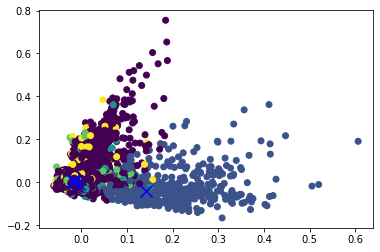

In [15]:
plt.scatter(reduced_features[:,0], reduced_features[:,1], c=model.predict(X))
plt.scatter(reduced_cluster_centers[:, 0], reduced_cluster_centers[:,1], marker='x', s=150, c='b')

### 3D Plot

In [16]:
# reduce the features to 3D
pca_1 = PCA(n_components=3, random_state=0)
reduced_features_1 = pca_1.fit_transform(X.toarray())

# reduce the cluster centers to 2D
reduced_cluster_centers_1 = pca_1.transform(model.cluster_centers_)

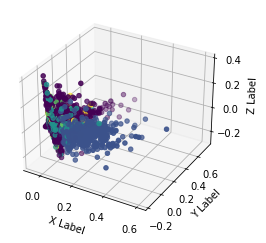

In [18]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt



fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

x = reduced_features_1[:,0]
y = reduced_features_1[:,1]
z = reduced_features_1[:,2]

ax.scatter(x, y, z, c=model.predict(X), marker='o')

ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

plt.show()

### 3D Plot interactive

In [95]:
import plotly
import plotly.graph_objs as go
# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()
# Configure the trace.
trace = go.Scatter3d(
    x = reduced_features_1[:,0],
    y = reduced_features_1[:,1],
    z = reduced_features_1[:,2], # <-- Put your data instead
    #surfacecolor= 'purple',
    mode='markers',
    #mode =prediction_list,  
    marker={
        'size': 10,
        'opacity': 0.8,
        'color': model.predict(X)
    }
    
)
# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
   
)
data = [trace]
 
plot_figure = go.Figure(data=data, layout=layout)
# Render the plot.
plotly.offline.iplot(plot_figure)

In [94]:
labels = model.labels_

In [99]:
df= pd.DataFrame(documents, columns = ['lead'])

In [103]:
df['label']= labels
df

,lead,label
0,Im Rahmen Start up Inkubators Hubraum Entwickl...,0
1,Ein Fonds Milliarden Euro Jahr ökologischen Um...,0
2,Pünktlich Weltraumflug Jeff Bezos FAA Regeln V...,0
3,Weniger Nutzer gedacht Reklameverfolgung App w...,0
4,Das Rohstoffangebot knapp Preise steigen Auf V...,0
...,...,...
13626,Fortschritt Technologien verdient beschleunigt...,0
13627,Internationale Forscher arbeiten Kernkraftwerk...,0
13628,Charles Simonyi Mitch Kapor Software früh Anse...,0
13629,Unser Schicksal Genen liegen James Watson form...,0


## with label

In [82]:
lead_tags_article = [[article["lead"], article["brandig"]] for article in articles] 

In [ ]:
from sklearn.metrics import homogeneity_score
homogeneity_score(df.label, cls.predict(features))